<center><h1 style='color:#2AAC8C ; font-size: 50px'>Data Mining</h1>
<h2 style='color: #75D0B9; font-size: 20px'>PVA Project</h2></center>

<center><h1 style='color: #000000; font-size: 15px'>Inês Melo m20200624</h1>
<h1 style='color: #000000; font-size: 15px'>Ricardo Nunes m20200611</h1>
<h1 style='color: #000000; font-size: 15px'>Catarina Pinheiro m20200654</h1><enter>

### Importing pandas and the csv file with the dataset

In [145]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
import seaborn as sns
from pandas_profiling import ProfileReport
from sklearn.impute import KNNImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.decomposition import PCA
from sklearn.cluster import DBSCAN, KMeans, AgglomerativeClustering, estimate_bandwidth, MeanShift
from sklearn.base import clone
from sklearn.metrics import pairwise_distances
from scipy.cluster.hierarchy import dendrogram
from sklearn.manifold import TSNE
from sklearn.tree import DecisionTreeClassifier, export_graphviz
from sklearn.model_selection import train_test_split
from sklearn.neighbors import NearestNeighbors
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score, silhouette_samples
import matplotlib.cm as cm
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import LocalOutlierFactor
from sklearn.datasets import make_blobs
from numpy import quantile, where, random
from collections import Counter
import sompy
from sompy.visualization.mapview import View2D
from sompy.visualization.bmuhits import BmuHitsView
from sompy.visualization.hitmap import HitMapView
from sklearn.preprocessing import LabelEncoder, StandardScaler, MinMaxScaler, RobustScaler
from pylab import bone, pcolor, colorbar, plot, show
from scipy.cluster.hierarchy import dendrogram, linkage, cophenet
from scipy.spatial.distance import pdist
import re
from math import ceil
import graphviz

In [146]:
import logging
logging.getLogger('matplotlib').setLevel(logging.ERROR)

## Importing Data

In [147]:
donors = pd.read_csv('donors.csv', dtype={'NOEXCH':'object','RDATE_5':'object'})

## Feature Selection

In [148]:
data = donors[['STATE','DOB','DOMAIN','GENDER','HIT','AGE901','EC1','IC1','MHUC1', 'POP901','PCOWNERS','NUMPRM12','LASTDATE','LASTGIFT','ODATEDW','AVGGIFT','CARDGIFT','RFA_2F','RFA_2A','IC5']]

## Feature Engineering 

Retirar as linhas duplicadas

In [149]:
data= data.drop_duplicates().copy()

In [150]:
def month_calculator(date):
    if pd.isna(date):
        return None
    else:
        return (2017 - int(date[:4])) * 12 + 6 - int(date[5:7])


def age_calculator(date):
    if pd.isna(date):
        return None
    else:
        return 2017 - int(date[:4]) - ((6, 1) < (int(date[5:7]), int(date[8:])))


In [151]:
for i in range(3,25):
    var = 'RAMNT_' + str(i)
    donors[var].fillna(0, inplace=True)

#criar as variaveis das promoções
data['Total_NK'] = donors.RAMNT_3 + donors.RAMNT_14 + donors.RAMNT_24
data['Total_TK'] = donors.RAMNT_4 + donors.RAMNT_15
data['Total_SK'] = donors.RAMNT_5
data['Total_LL'] = donors.RAMNT_6 + donors.RAMNT_16
data['Total_G1'] = donors.RAMNT_7 + donors.RAMNT_17
data['Total_GK'] = donors.RAMNT_8 + donors.RAMNT_18
data['Total_CC'] = donors.RAMNT_9 + donors.RAMNT_19
data['Total_WL'] = donors.RAMNT_10 + donors.RAMNT_20
data['Total_X1'] = donors.RAMNT_11 + donors.RAMNT_21
data['Total_XK'] = donors.RAMNT_12 + donors.RAMNT_22
data['Total_FS'] = donors.RAMNT_13 + donors.RAMNT_23

#criar a variavel NOCARDGIFT
data['NOCARDGIFT']=donors.NGIFTALL-donors.CARDGIFT 

#separar DOMAIN em SES e DOMAIN
data['SES'] = data['DOMAIN'].map(lambda x: x[-1]).copy()
data['DOMAIN'] = data['DOMAIN'].map(lambda x: x[0]).copy() 

 #tranformar data da primeira doação em meses
data['ODATEDW']=data.ODATEDW.map(month_calculator)

#transformar data da ultima doação em meses
data['LASTDATE']=data.LASTDATE.map(month_calculator)

#transformar Date of Birth em Age
data['AGE'] = data.DOB.map(age_calculator)

#anos de educação estavam originalmente multiplicados por 10
data['EC1']=data['EC1']/10 

#Alterar PCOWNERS para passar a ser variável binária.
data['PCOWNERS'] = data.PCOWNERS.map(lambda x: 1 if x=='Y' else 0) 

Em __GENDER__ encontrámos valores desconhecidos.
Eliminámos linhas com valores 'A' ou 'C' pois não coincidem com os possíveis valores desta variável indicados na metadata.  
Consideramos valores em branco (' ') como sendo unknown ('U').

In [152]:
data.GENDER.value_counts()

F    51277
M    39094
      2957
U     1715
J      365
A        2
C        2
Name: GENDER, dtype: int64

In [153]:
data=data[~data['GENDER'].str.contains('C',regex=False, na=False) & ~data['GENDER'].str.contains('A',regex=False, na=False)]
data['GENDER'] = data['GENDER'].map(lambda x: 'U' if x==' ' else x)

Em __STATE__ verificámos que continha 57 estados em vez dos 50. Então fomos averiguar quais eram os 7 valores a mais.  
Concluímos que so 7 estados a mais são áreas insulares, ou pertencem ao US military postal code, ou é o distrito federal. 

__AP__ -> U.S. Armed Forces – Pacific  
__AA__ -> U.S. Armed Forces – Americas  
__AE__ -> U.S. Armed Forces – Europe  
__VI__ -> U.S. Virgin Islands (Insular area)  
__GU__ -> Guam (Insular area)  
__DC__ -> District of Columbia (Federal district)  
__AS__ -> American Samoa (Insular area)

In [154]:
states=(['AL','AK','AZ','AR','CA','CO','CT','DE','FL','GA','HI','ID','IL','IN','IA','KS','KY','LA','ME','MD','MA','MI','MN','MS','MO','MT','NE','NV','NH','NJ','NM','NY','NC','ND','OH','OK','OR','PA','RI','SC','SD','TN','TX','UT','VT','VA','WA','WV','WI','WY'])
data[~data.STATE.isin(states)].STATE.value_counts()

AP    81
AA    18
AE    15
VI     5
GU     4
AS     1
DC     1
Name: STATE, dtype: int64

### Verificar consistência

Verificámos que havia pessoas com data de nascimento mais recente do que a sua primeira doação.  
Para assegurar a consistência dos dados eliminamos estas pessoas e também aquelas que a data da primeira doação é mais recente que a data da sua última doação.

Como continuamos bastante abaixo dos 5%, então podemos eliminar estes dados que são inconsistentes.  
Notar que já eliminámos 4 linhas de __GENDER__ que tinham valores não correspondentes no ficheiro metadata.

In [155]:
data_not_lapsed= data[(data.LASTDATE > 24) | (data.LASTDATE < 13)].copy()
data= data[(data['LASTDATE']<= 24) & (data['LASTDATE']>=13)].copy()

In [156]:
data.drop(data[data.AGE<0].index, inplace=True)

In [157]:
data['DOB_meses'] = data.DOB.map(month_calculator)
(data[data.DOB_meses < data.ODATEDW].shape[0] + 4) / donors.shape[0]

0.0026935815201442168

In [158]:
data.drop(data[(data.DOB_meses < data.ODATEDW)].index, inplace=True)

Após fazermos este tratamento de dados, já podemos eliminar a variável __DOB_meses__ e __DOB__

In [159]:
data.drop(columns=['DOB_meses', 'DOB'], inplace=True)

EM __ODATEDW__, verificar que não há datas de gifts após a data da promoção 17NK.

In [160]:
print('ODATEDW:',data[data.ODATEDW<=0].shape[0])

ODATEDW: 0


In [161]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 83873 entries, 0 to 95408
Data columns (total 33 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   STATE       83873 non-null  object 
 1   DOMAIN      83873 non-null  object 
 2   GENDER      83873 non-null  object 
 3   HIT         83873 non-null  int64  
 4   AGE901      83873 non-null  int64  
 5   EC1         83873 non-null  float64
 6   IC1         83873 non-null  int64  
 7   MHUC1       83873 non-null  int64  
 8   POP901      83873 non-null  int64  
 9   PCOWNERS    83873 non-null  int64  
 10  NUMPRM12    83873 non-null  int64  
 11  LASTDATE    83873 non-null  int64  
 12  LASTGIFT    83873 non-null  float64
 13  ODATEDW     83873 non-null  int64  
 14  AVGGIFT     83873 non-null  float64
 15  CARDGIFT    83873 non-null  int64  
 16  RFA_2F      83873 non-null  int64  
 17  RFA_2A      83873 non-null  object 
 18  IC5         83873 non-null  int64  
 19  Total_NK    83873 non-nul

### Dividir em metric e non_metric features

In [162]:
metric = data.select_dtypes(include=['float64','int64']).drop(columns=['PCOWNERS','RFA_2F']).columns.to_list()
non_metric = data.columns.drop(metric).to_list()

## Missing values

In [163]:
data.isna().sum()

STATE             0
DOMAIN            0
GENDER            0
HIT               0
AGE901            0
EC1               0
IC1               0
MHUC1             0
POP901            0
PCOWNERS          0
NUMPRM12          0
LASTDATE          0
LASTGIFT          0
ODATEDW           0
AVGGIFT           0
CARDGIFT          0
RFA_2F            0
RFA_2A            0
IC5               0
Total_NK          0
Total_TK          0
Total_SK          0
Total_LL          0
Total_G1          0
Total_GK          0
Total_CC          0
Total_WL          0
Total_X1          0
Total_XK          0
Total_FS          0
NOCARDGIFT        0
SES               0
AGE           21243
dtype: int64

Como NUMCHLD tem bastantes missing values, então vamos remover esta variavel pois nao fornece informação.  
Sobre WEALTH2, como tem tantos missing values então vamos remover esta variavel.

### Categoricas

There are unknown values in the __DOMAIN__ and __SES__. So we will assign 'unknown' to this values.  
The missing values in these categorical data is not as important as the missing data in continuous variables, because in the later they prevent to implement the clustering algorithms. We can annalyse the __DOMAIN__ and __SES__ values in each clusters by determining the mode, for example.

In [164]:
data['DOMAIN'] = data.DOMAIN.map(lambda x: 'unknown' if x==' ' else x)
data['SES'] = data.SES.map(lambda x: 'unknown' if x==' ' else x)

### Numéricas

__Mediana:__

In [165]:
data_median = data.copy(deep=True)
data_median['AGE'] = data_median['AGE'].fillna(data['AGE'].median())

__KNN:__

In [166]:
filled_data = data.copy()

# for 7-NN
imputer = KNNImputer(n_neighbors=7, weights='distance')
filled_data[metric] = imputer.fit_transform(filled_data[metric])

filled_data.isna().sum()

STATE         0
DOMAIN        0
GENDER        0
HIT           0
AGE901        0
EC1           0
IC1           0
MHUC1         0
POP901        0
PCOWNERS      0
NUMPRM12      0
LASTDATE      0
LASTGIFT      0
ODATEDW       0
AVGGIFT       0
CARDGIFT      0
RFA_2F        0
RFA_2A        0
IC5           0
Total_NK      0
Total_TK      0
Total_SK      0
Total_LL      0
Total_G1      0
Total_GK      0
Total_CC      0
Total_WL      0
Total_X1      0
Total_XK      0
Total_FS      0
NOCARDGIFT    0
SES           0
AGE           0
dtype: int64

Why 7-NN?  
Well, because it's a prime number so there are no ties. We do not want a small number because it would very sensible to outliers and create crisp frontiers. On the other hand, a large number would be computationally expensive and unable to detect small variations.    
Also, by the histograms below, we can see that for 7-NN, the distribution becomes more stable.

Text(0.5, 1.0, '50-NN')

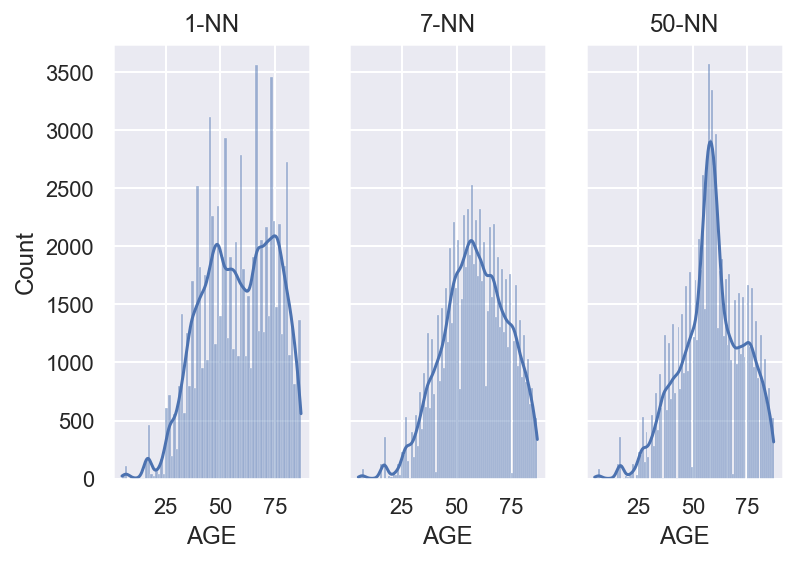

In [167]:
# for 1-NN
filled_data1 = data.copy()
imputer = KNNImputer(n_neighbors=1, weights='distance')
filled_data1[metric] = imputer.fit_transform(filled_data1[metric])

# for 50-NN
filled_data50 = data.copy()
imputer = KNNImputer(n_neighbors=50, weights='distance')
filled_data50[metric] = imputer.fit_transform(filled_data50[metric])

oneknn = pd.DataFrame(filled_data1, columns=data.select_dtypes(include=['float64','int64']).columns)
sevenknn = pd.DataFrame(filled_data, columns=data.select_dtypes(include=['float64','int64']).columns)
fiftyknn = pd.DataFrame(filled_data50, columns=data.select_dtypes(include=['float64','int64']).columns)

fig, (ax1, ax2, ax3) = plt.subplots(ncols=3, sharey=True)
sns.histplot(data=oneknn, x="AGE", kde=True, ax=ax1).set_title("1-NN")
sns.histplot(data=sevenknn, x="AGE", kde=True, ax=ax2).set_title("7-NN")
sns.histplot(data=fiftyknn, x="AGE", kde=True, ax=ax3).set_title("50-NN")

__Linear regression:__

usamos o log para linearizar a regressão

In [168]:
data_set=data[metric].dropna()
X = data_set.drop(columns=['AGE'])
y =np.log(data_set['AGE'])

lin_model = LinearRegression()

lin_model.fit(X, y)

lin_model.score(X,y)

0.08269601997630827

__Usamos o knn__ para preencher os missing values, pois se utilizassemos a mediana todos os valores seriam iguais e perderiamos dados sobre os clusters, usando o metodo de retirar os 70% da data, estariamos a perder uma percentagem de data e no linear regrassion, o R^2 é bastante baixo

__Updating the dataframe:__

In [169]:
data = filled_data.copy()

data['ODATEDW_anos'] = data.ODATEDW.map(lambda x: x/12)

data.drop(data[data.ODATEDW_anos>data.AGE].index, inplace=True)

data.drop(columns='ODATEDW_anos', inplace=True)

## Outliers

Outliers detection makes sense in the continuous variables.

In [170]:
# profile = ProfileReport(data, title='PVA Lapsed donors', correlations={
#         "pearson": {"calculate": True},
#         "spearman": {"calculate": False},
#         "kendall": {"calculate": False},
#         "phi_k": {"calculate": False},
#         "cramers": {"calculate": False},
#     }

# )

# profile.to_notebook_iframe()

Histograms

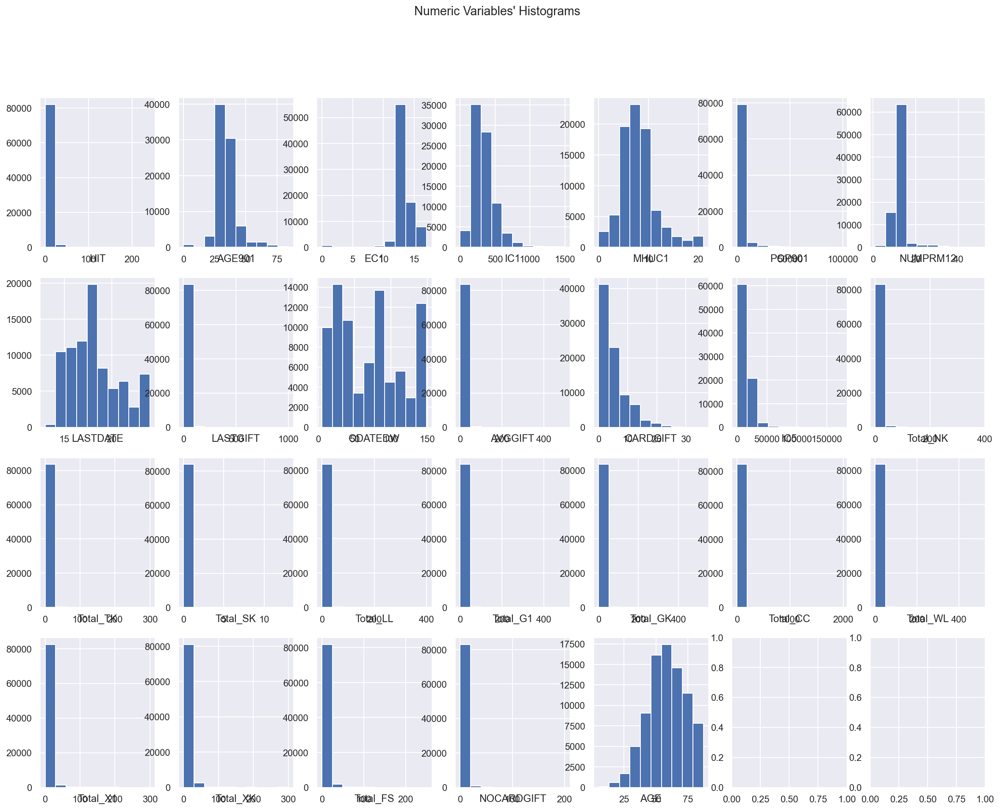

In [171]:
# All Numeric Variables' Histograms in one figure
sns.set()

# Prepare figure. Create individual axes where each histogram will be placed
fig, axes = plt.subplots(4, ceil(len(metric) / 4), figsize=(20, 15))

# Plot data
# Iterate across axes objects and associate each histogram (hint: use the ax.hist() instead of plt.hist()):
for ax, feat in zip(axes.flatten(), metric): # Notice the zip() function and flatten() method
    ax.hist(data[feat])
    ax.set_title(feat, y=-0.13)
    
# Layout
# Add a centered title to the figure:
title = "Numeric Variables' Histograms"

plt.suptitle(title)
plt.show()

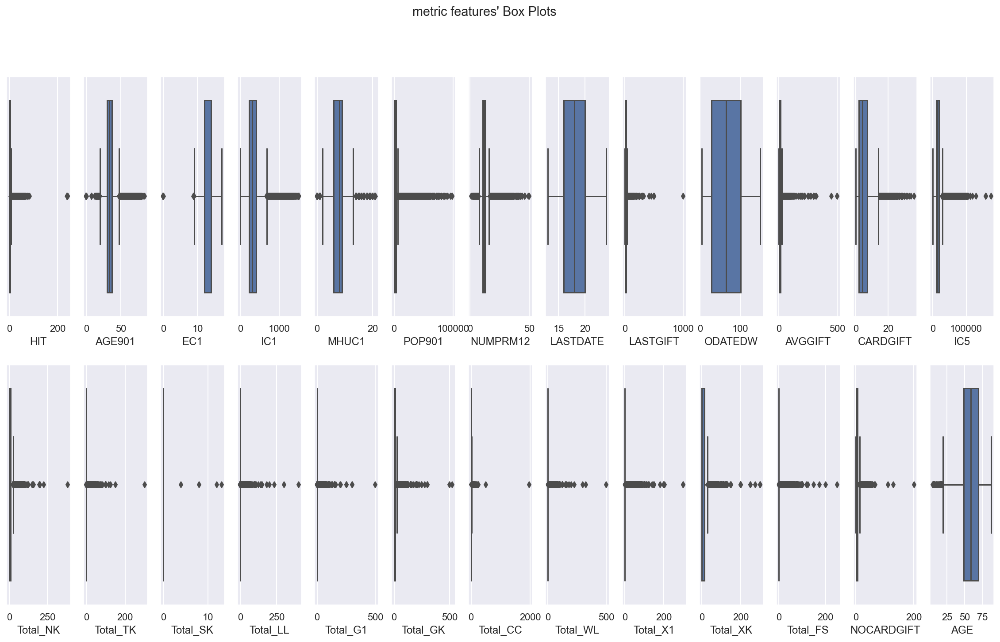

In [172]:

# All Numeric Variables' Box Plots in one figure
sns.set()

# Prepare figure. Create individual axes where each box plot will be placed
fig, axes = plt.subplots(2, ceil(len(metric) / 2), figsize=(20, 11))

# Plot data
# Iterate across axes objects and associate each box plot (hint: use the ax argument):
for ax, feat in zip(axes.flatten(), metric): # Notice the zip() function and flatten() method
    sns.boxplot(x=data[feat], ax=ax)
    
# Layout
# Add a centered title to the figure:
title = "metric features' Box Plots"

plt.suptitle(title)
plt.show()


In [173]:
data.reset_index(inplace=True, drop= True)

In [174]:
data[metric].describe()

,HIT,AGE901,EC1,IC1,MHUC1,POP901,NUMPRM12,LASTDATE,LASTGIFT,ODATEDW,...,Total_LL,Total_G1,Total_GK,Total_CC,Total_WL,Total_X1,Total_XK,Total_FS,NOCARDGIFT,AGE
count,83856.000000,83856.000000,83856.000000,83856.000000,83856.000000,83856.000000,83856.000000,83856.000000,83856.000000,83856.000000,...,83856.000000,83856.000000,83856.000000,83856.000000,83856.000000,83856.000000,83856.000000,83856.000000,83856.000000,83856.000000
mean,3.241640,34.440052,12.792154,339.483305,8.099468,3238.153465,12.479226,18.278299,17.042771,70.394927,...,3.135488,2.662860,6.281724,5.001126,2.952290,3.663972,6.915452,2.767433,4.294147,58.402043
std,8.982334,8.315642,1.779278,162.319325,3.522872,5691.006286,3.440456,2.482558,12.702435,41.440486,...,7.236958,7.573135,10.906634,12.002712,8.304586,8.578965,11.004328,7.345156,4.492296,14.660275
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,13.000000,0.000000,5.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000
25%,0.000000,30.000000,12.000000,230.000000,6.000000,991.000000,11.000000,16.000000,10.000000,29.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,48.691672
50%,0.000000,33.000000,12.000000,309.000000,8.000000,1563.000000,12.000000,18.000000,15.000000,65.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000,58.638926
75%,3.000000,37.000000,14.000000,414.000000,9.000000,3080.250000,13.000000,20.000000,20.000000,101.000000,...,0.000000,0.000000,10.000000,9.000000,0.000000,0.000000,12.000000,0.000000,6.000000,69.000000
max,241.000000,84.000000,17.000000,1500.000000,21.000000,98701.000000,50.000000,24.000000,1000.000000,149.000000,...,400.000000,500.000000,525.000000,1970.000000,500.000000,300.000000,300.000000,250.000000,201.000000,87.000000


### Manual way

In [175]:
filters1 = ((data.HIT <= 60)
            &
            (data.NUMPRM12 <= 45)
            &
            (data.AVGGIFT <= 100)
            &
            (data.NOCARDGIFT <= 40)
            &
            (data.LASTGIFT <= 200)
            &
            (data.CARDGIFT <= 30)
            &
            (data.IC5 <= 70000)
            &
            (data.Total_NK <= 70)
            &
            (data.Total_LL <= 50)
            &
            (data.Total_CC <= 300)
            &
            (data.Total_GK <= 150)
            &
            (data.Total_XK <= 80)
            &
            (data.Total_X1 <= 80)
            &
            (data.EC1 >= 6)
            &
            (data.IC1 <= 1000)
            &
            (data.POP901 <= 50000)
           )
data_1 = data[filters1]
print('Percentage of data kept after removing outliers:', np.round(data_1.shape[0] / donors.shape[0], 4))

Percentage of data kept after removing outliers: 0.858


### IQR

In [176]:
q25 = data.quantile(.25)
q75 = data.quantile(.75)
iqr = (q75 - q25)

upper_lim = q75 + 8 * iqr
lower_lim = q25 - 8 * iqr

filters2 = []
for m in metric:
    llim = lower_lim[m]
    ulim = upper_lim[m]
    filters2.append(data[m].between(llim, ulim, inclusive=True))

filters2 = pd.Series(np.all(filters2, 0))

data_2 = data[filters2]
print('Percentage of data kept after removing outliers:', np.round(data_2.shape[0] / donors.shape[0], 4))

Percentage of data kept after removing outliers: 0.2925


### Local Outlier Factor

In [177]:
model= LocalOutlierFactor(n_neighbors=5)
outl= model.fit_predict(data[metric])
Counter(outl)

Counter({1: 81550, -1: 2306})

In [178]:
filters3= pd.Series(outl!=-1)
data_3 = data[outl!=-1].copy()
print('Percentage of data kept after removing outliers:', len(data_3)/len(data))

Percentage of data kept after removing outliers: 0.9725004770082045


### Combined Methods

In [179]:
data_4 = data[(filters1 | filters3) & (filters1 | filters2) & (filters2 | filters3)]
print('Percentage of data kept after removing outliers:', np.round(data_4.shape[0] / data.shape[0], 4))

Percentage of data kept after removing outliers: 0.9655


In [180]:
data_out = data[~((filters1 & filters3) | (filters1 & filters2) | (filters2 & filters3))].copy()

data=data_4.copy()

data.reset_index(inplace=True, drop=True)

data_not_standard = data.copy()

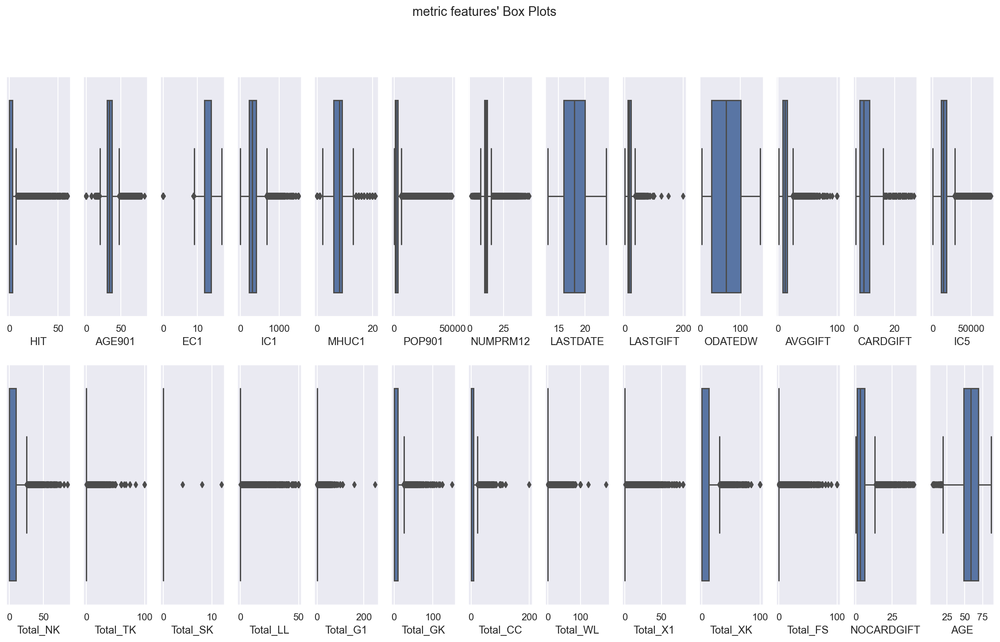

In [181]:
from math import ceil
# All Numeric Variables' Box Plots in one figure
sns.set()

# Prepare figure. Create individual axes where each box plot will be placed
fig, axes = plt.subplots(2, ceil(len(metric) / 2), figsize=(20, 11))

# Plot data
# Iterate across axes objects and associate each box plot (hint: use the ax argument):
for ax, feat in zip(axes.flatten(), metric): # Notice the zip() function and flatten() method
    sns.boxplot(x=data[feat], ax=ax)
    
# Layout
# Add a centered title to the figure:
title = "metric features' Box Plots"

plt.suptitle(title)
plt.show()

### Data Normalization

In [182]:
# making a copy
data_standard = data.copy()

# applying the standard scaler
scaler = StandardScaler()
scaled_feat = scaler.fit_transform(data_standard[metric])

# updating standard values in dataframe
data_standard[metric] = scaled_feat

In [183]:
data = data_standard.copy()

## One-hot encoding

In [184]:
data_ohc = data.copy()

In [185]:
# Use OneHotEncoder to encode the categorical features. Get feature names and create a DataFrame 
# with the one-hot encoded categorical features (pass feature names)
ohc = OneHotEncoder( sparse=False)
ohc_feat = ohc.fit_transform(data_ohc[non_metric])
# ohc_feat_names = ohc.get_feature_names(['STATE', 'DOMAIN', 'GENDER', 'PCOWNERS', 'RFA_2F', 'RFA_2A', 'SES',
#        'LAPSED'])
ohc_feat_names = ohc.get_feature_names(non_metric)

ohc_data = pd.DataFrame(ohc_feat, index=data_ohc.index, columns=ohc_feat_names)  # Why the index=df_ohc.index?

In [186]:
data_ohc = pd.concat([data_ohc.drop(columns=non_metric), ohc_data], axis=1)

In [187]:
data = data_ohc.copy()

In [278]:
data_ohc2 = data_not_standard.copy()

In [279]:
# Use OneHotEncoder to encode the categorical features. Get feature names and create a DataFrame 
# with the one-hot encoded categorical features (pass feature names)
ohc = OneHotEncoder( sparse=False)
ohc_feat = ohc.fit_transform(data_ohc2[non_metric])
# ohc_feat_names = ohc.get_feature_names(['STATE', 'DOMAIN', 'GENDER', 'PCOWNERS', 'RFA_2F', 'RFA_2A', 'SES',
#        'LAPSED'])
ohc_feat_names = ohc.get_feature_names(non_metric)

ohc_data = pd.DataFrame(ohc_feat, index=data_ohc.index, columns=ohc_feat_names)  # Why the index=df_ohc.index?

In [280]:
data_ohc2 = pd.concat([data_ohc2.drop(columns=non_metric), ohc_data], axis=1)

## Multivariate Analysis

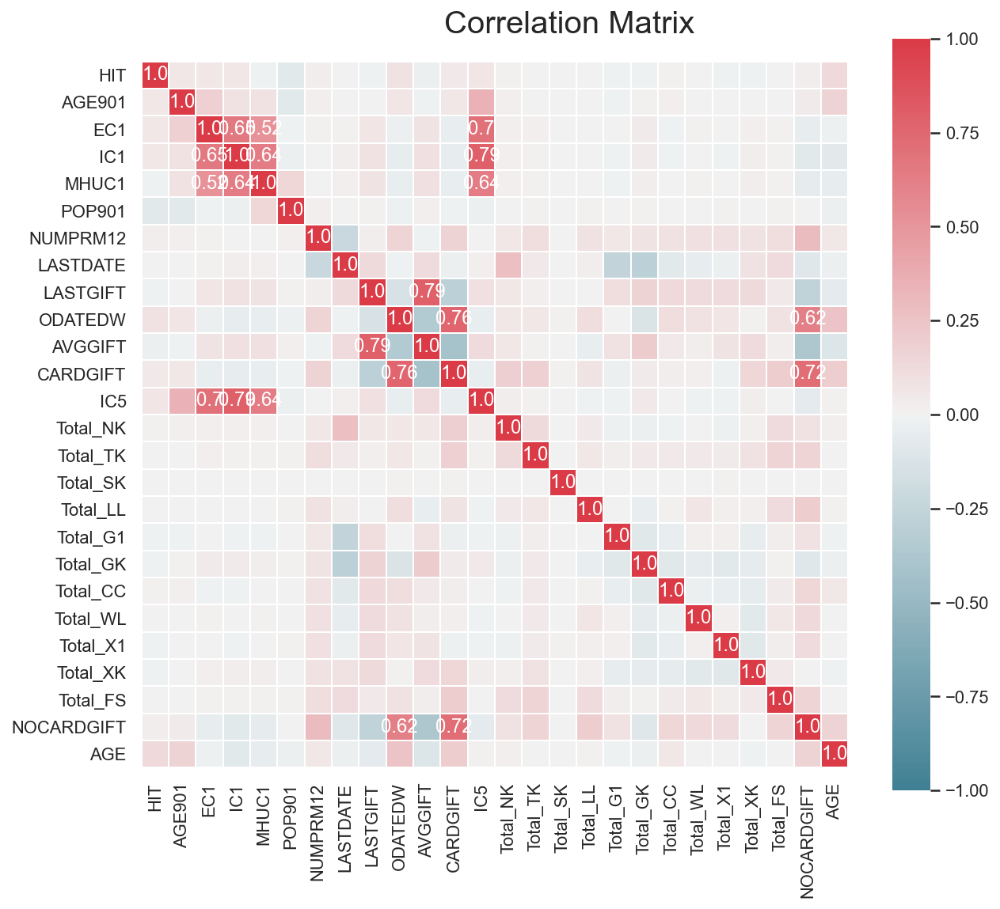

In [188]:
# Prepare figure
fig = plt.figure(figsize=(10, 8))

# Obtain correlation matrix. Round the values to 2 decimal cases. Use the DataFrame corr() and round() method.
corr = np.round(data[metric].corr(method="pearson"), decimals=2)

# Build annotation matrix (values above |0.5| will appear annotated in the plot)
mask_annot = np.absolute(corr.values) >= 0.5
annot = np.where(mask_annot, corr.values, np.full(corr.shape,"")) # Try to understand what this np.where() does

# Plot heatmap of the correlation matrix
sns.heatmap(data=corr, annot=annot, cmap=sns.diverging_palette(220, 10, as_cmap=True), 
            fmt='s', vmin=-1, vmax=1, center=0, square=True, linewidths=.5)

# Layout
fig.subplots_adjust(top=0.95)
fig.suptitle("Correlation Matrix", fontsize=20)


plt.show()

In [189]:
#'Total_NK','Total_TK', 'Total_SK', 'Total_LL', 'Total_G1', 'Total_GK', 'Total_CC',
#'Total_WL', 'Total_X1', 'Total_XK', 'Total_FS','HIT', 'POP901', 'AGE', 'HIT' not used to cluster

## Clustering

Clustering with perspectives- Split variables into perspectives

In [190]:
# Split variables into perspectives (example, requires critical thinking and domain knowledge)
demo_features = [
    'IC5',
    'EC1',
    'IC1',
    'MHUC1',
    'AGE901'
]

gift_features = [ 
    'NOCARDGIFT',
    'CARDGIFT',
    'LASTDATE',
    'LASTGIFT',
    'ODATEDW',
    'NUMPRM12',
    'AVGGIFT' 
]


data_demo = data[demo_features].copy()
data_gift = data[gift_features].copy()

In [191]:
def get_ss(df):
    """Computes the sum of squares for all variables given a dataset
    """
    ss = np.sum(df.var() * (df.count() - 1))
    return ss  # return sum of sum of squares of each df variable

def r2(df, labels):
    sst = get_ss(df)
    ssw = np.sum(df.groupby(labels).apply(get_ss))
    return 1 - ssw/sst
    
def get_r2_scores(df, clusterer, min_k=2, max_k=10):
    """
    Loop over different values of k. To be used with sklearn clusterers.
    """
    r2_clust = {}
    for n in range(min_k, max_k):
        clust = clone(clusterer).set_params(n_clusters=n)
        labels = clust.fit_predict(df)
        r2_clust[n] = r2(df, labels)
    return r2_clust


# Set up the clusterers
kmeans = KMeans(
    init='k-means++',
    n_init=20,
    random_state=42
)

hierarchical = AgglomerativeClustering(
    affinity='euclidean'
)

In [192]:
 def avg_silhouette_plot(df, k):
    avg_silhouette = []
    # Create a figure
    fig = plt.figure(figsize=(13, 7))

    # Initialize the KMeans object with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    kmclust = KMeans(n_clusters=k, init='k-means++', n_init=15, random_state=1)
    cluster_labels = kmclust.fit_predict(df)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed clusters
    silhouette_avg = silhouette_score(df, cluster_labels)
    avg_silhouette.append(silhouette_avg)
    print(f"For n_clusters = k, the average silhouette_score is : {silhouette_avg}")

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(df, cluster_labels)

    y_lower = 10
    for i in range(k):
        # Aggregate the silhouette scores for samples belonging to cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()

        # Get y_upper to demarcate silhouette y range size
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        # Filling the silhouette
        color = cm.nipy_spectral(float(i) / k)
        plt.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    plt.title("The silhouette plot for the various clusters.")
    plt.xlabel("The silhouette coefficient values")
    plt.ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    plt.axvline(x=silhouette_avg, color="red", linestyle="--")

    # The silhouette coefficient can range from -1, 1
    xmin, xmax = np.round(sample_silhouette_values.min() -0.1, 2), np.round(sample_silhouette_values.max() + 0.1, 2)
    plt.xlim([xmin, xmax])

    # The (nclus+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    plt.ylim([0, len(df) + (k + 1) * 10])

    plt.yticks([])  # Clear the yaxis labels / ticks
    plt.xticks(np.arange(xmin, xmax, 0.1))

In [316]:
 def avg_silhouette_plot_ward(df, k):
    avg_silhouette = []
    # Create a figure
    fig = plt.figure(figsize=(13, 7))

    # Initialize the KMeans object with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    kmclust = KMeans(n_clusters=k, init='k-means++', n_init=15, random_state=1)
    cluster_labels = kmclust.fit_predict(df)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed clusters
    silhouette_avg = silhouette_score(df, cluster_labels)
    avg_silhouette.append(silhouette_avg)
    print(f"For n_clusters = k, the average silhouette_score is : {silhouette_avg}")

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(df, cluster_labels)

    y_lower = 10
    for i in range(k):
        # Aggregate the silhouette scores for samples belonging to cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()

        # Get y_upper to demarcate silhouette y range size
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        # Filling the silhouette
        color = cm.nipy_spectral(float(i) / k)
        plt.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    plt.title("The silhouette plot for the various clusters.")
    plt.xlabel("The silhouette coefficient values")
    plt.ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    plt.axvline(x=silhouette_avg, color="red", linestyle="--")

    # The silhouette coefficient can range from -1, 1
    xmin, xmax = np.round(sample_silhouette_values.min() -0.1, 2), np.round(sample_silhouette_values.max() + 0.1, 2)
    plt.xlim([xmin, xmax])

    # The (nclus+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    plt.ylim([0, len(df) + (k + 1) * 10])

    plt.yticks([])  # Clear the yaxis labels / ticks
    plt.xticks(np.arange(xmin, xmax, 0.1))

# Demographic

### PCA

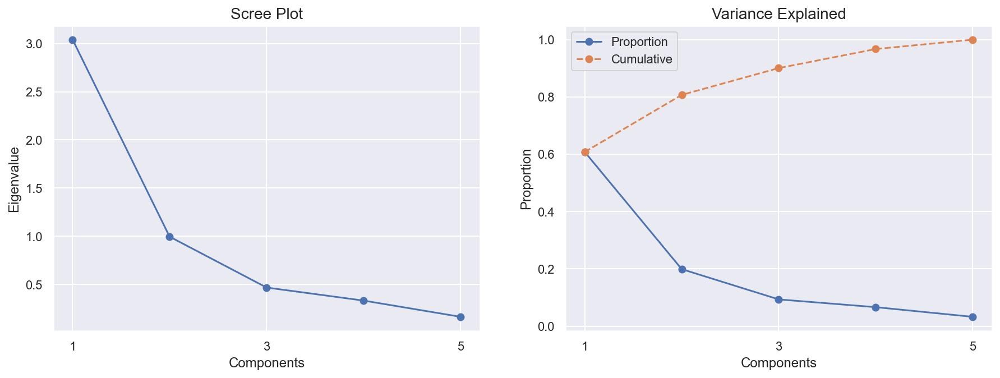

In [194]:
data_demo_pca = data_demo.copy()
pca = PCA()
pca_feat = pca.fit_transform(data_demo_pca)
    
# figure and axes
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

# draw plots
ax1.plot(pca.explained_variance_, marker=".", markersize=12)
ax2.plot(pca.explained_variance_ratio_, marker=".", markersize=12, label="Proportion")
ax2.plot(np.cumsum(pca.explained_variance_ratio_), marker=".", markersize=12, linestyle="--", label="Cumulative")
# customizations
ax2.legend()
ax1.set_title("Scree Plot", fontsize=14)
ax2.set_title("Variance Explained", fontsize=14)
ax1.set_ylabel("Eigenvalue")
ax2.set_ylabel("Proportion")
ax1.set_xlabel("Components")
ax2.set_xlabel("Components")
ax1.set_xticks(range(0, pca.n_components_, 2))
ax1.set_xticklabels(range(1, pca.n_components_ + 1, 2))
ax2.set_xticks(range(0, pca.n_components_, 2))
ax2.set_xticklabels(range(1, pca.n_components_ + 1, 2))
plt.show()

In [195]:
pca = PCA(n_components=2)
pca_feat = pca.fit_transform(data_demo_pca)
pca_feat_names = [f"PC{i}" for i in range(pca.n_components_)]
pca_df = pd.DataFrame(pca_feat, index=data_demo_pca.index, columns=pca_feat_names)

r2_scores = {}
r2_scores['kmeans'] = get_r2_scores(pca_df, kmeans)

pd.DataFrame(r2_scores)

,kmeans
2,0.468486
3,0.589112
4,0.706172
5,0.752177
6,0.790898
7,0.819806
8,0.843950
9,0.859892


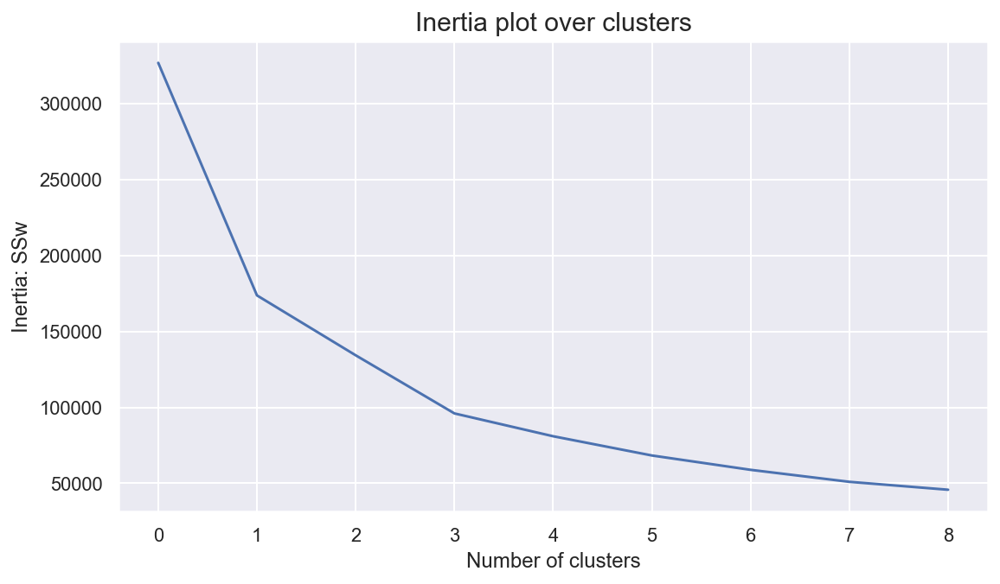

In [196]:
range_clusters = range(1, 10)
inertia = []
for n_clus in range_clusters:  # iterate over desired ncluster range
    kmclust = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=42)
    kmclust.fit(pca_df)
    inertia.append(kmclust.inertia_)
# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(inertia)
plt.ylabel("Inertia: SSw")
plt.xlabel("Number of clusters")
plt.title("Inertia plot over clusters", size=15)
plt.show()

For n_clusters = k, the average silhouette_score is : 0.43731820685916617


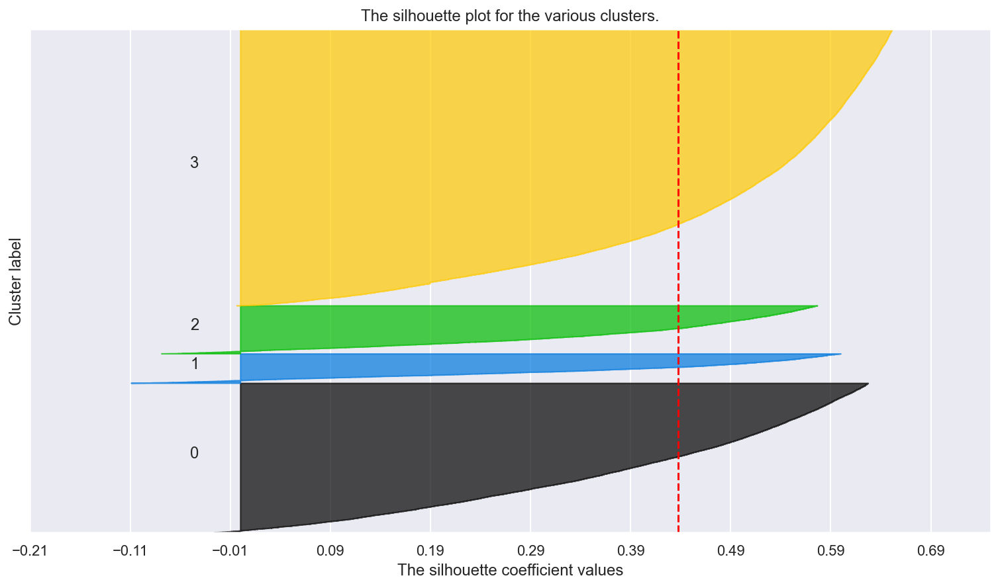

In [197]:
avg_silhouette_plot(pca_df,4)

In [198]:
# final cluster solution
number_clusters = 4
pca_kmclust = KMeans(n_clusters=number_clusters, init='k-means++', n_init=50, random_state=42)
pca_km_labels = pca_kmclust.fit_predict(pca_df)

In [199]:
# m = pca_df.mean()
# m
# # TSS (total sum of squares)
# TSS = pca_df.shape[0]*pca_df.var(ddof=0)
# print(TSS)

In [200]:
data_demo_pca_km = pd.concat((data_demo, pd.Series(pca_km_labels, name='labels', index= data_demo.index)), axis=1)

In [201]:
sst = get_ss(data_demo_pca_km[demo_features])  # get total sum of squares

ssw_labels = data_demo_pca_km[demo_features + ["labels"]].groupby(by='labels').apply(get_ss)  # compute ssw for each cluster labels

ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB

r2 = ssb / sst

r2

0.5740372999634457

### Self organizing maps

In [63]:
# This som implementation does not have a random seed parameter
# We're going to set it up ourselves
np.random.seed(42)

sm = sompy.SOMFactory().build(
    data_demo.values, 
    mapsize=(100, 100),
    initialization='random', 
    neighborhood='gaussian',
    training='batch',
    lattice='hexa',
    component_names=demo_features
)
sm.train(n_job=-1, train_rough_len=500, train_finetune_len=500)
# sm.train(n_job=4, verbose='info', train_rough_len=100, train_finetune_len=100)

 Training...
 random_initialization took: 0.002000 seconds
 Rough training...
 radius_ini: 34.000000 , radius_final: 5.666667, trainlen: 500

 epoch: 1 ---> elapsed time:  31.602000, quantization error: 0.944373

 epoch: 2 ---> elapsed time:  31.609000, quantization error: 1.856443

 epoch: 3 ---> elapsed time:  29.056000, quantization error: 1.834886

 epoch: 4 ---> elapsed time:  32.161000, quantization error: 1.827397

 epoch: 5 ---> elapsed time:  29.289000, quantization error: 1.825934

 epoch: 6 ---> elapsed time:  33.734000, quantization error: 1.825233

 epoch: 7 ---> elapsed time:  31.238000, quantization error: 1.824846

 epoch: 8 ---> elapsed time:  32.316000, quantization error: 1.824575

 epoch: 9 ---> elapsed time:  30.904000, quantization error: 1.824411

 epoch: 10 ---> elapsed time:  32.836000, quantization error: 1.824158

 epoch: 11 ---> elapsed time:  31.209000, quantization error: 1.823996

 epoch: 12 ---> elapsed time:  32.557000, quantization error: 1.823869

 ep

 epoch: 113 ---> elapsed time:  29.391000, quantization error: 1.807854

 epoch: 114 ---> elapsed time:  31.225000, quantization error: 1.807646

 epoch: 115 ---> elapsed time:  29.936000, quantization error: 1.807437

 epoch: 116 ---> elapsed time:  30.428000, quantization error: 1.807227

 epoch: 117 ---> elapsed time:  30.068000, quantization error: 1.807015

 epoch: 118 ---> elapsed time:  31.062000, quantization error: 1.806802

 epoch: 119 ---> elapsed time:  30.488000, quantization error: 1.806587

 epoch: 120 ---> elapsed time:  31.074000, quantization error: 1.806371

 epoch: 121 ---> elapsed time:  30.421000, quantization error: 1.806154

 epoch: 122 ---> elapsed time:  30.625000, quantization error: 1.805937

 epoch: 123 ---> elapsed time:  30.614000, quantization error: 1.805717

 epoch: 124 ---> elapsed time:  30.078000, quantization error: 1.805496

 epoch: 125 ---> elapsed time:  30.742000, quantization error: 1.805273

 epoch: 126 ---> elapsed time:  29.953000, quantiza

 epoch: 226 ---> elapsed time:  32.063000, quantization error: 1.761565

 epoch: 227 ---> elapsed time:  31.795000, quantization error: 1.761069

 epoch: 228 ---> elapsed time:  32.161000, quantization error: 1.760570

 epoch: 229 ---> elapsed time:  31.923000, quantization error: 1.760067

 epoch: 230 ---> elapsed time:  31.820000, quantization error: 1.759561

 epoch: 231 ---> elapsed time:  31.162000, quantization error: 1.759050

 epoch: 232 ---> elapsed time:  32.171000, quantization error: 1.758536

 epoch: 233 ---> elapsed time:  31.934000, quantization error: 1.758018

 epoch: 234 ---> elapsed time:  31.810000, quantization error: 1.757495

 epoch: 235 ---> elapsed time:  31.653000, quantization error: 1.756969

 epoch: 236 ---> elapsed time:  32.542000, quantization error: 1.756439

 epoch: 237 ---> elapsed time:  32.152000, quantization error: 1.755905

 epoch: 238 ---> elapsed time:  32.510000, quantization error: 1.755367

 epoch: 239 ---> elapsed time:  32.881000, quantiza

 epoch: 339 ---> elapsed time:  31.670000, quantization error: 1.670532

 epoch: 340 ---> elapsed time:  31.835000, quantization error: 1.669261

 epoch: 341 ---> elapsed time:  32.130000, quantization error: 1.667978

 epoch: 342 ---> elapsed time:  31.988000, quantization error: 1.666681

 epoch: 343 ---> elapsed time:  32.032000, quantization error: 1.665373

 epoch: 344 ---> elapsed time:  31.722000, quantization error: 1.664055

 epoch: 345 ---> elapsed time:  32.113000, quantization error: 1.662723

 epoch: 346 ---> elapsed time:  32.080000, quantization error: 1.661377

 epoch: 347 ---> elapsed time:  32.204000, quantization error: 1.660015

 epoch: 348 ---> elapsed time:  31.965000, quantization error: 1.658642

 epoch: 349 ---> elapsed time:  31.882000, quantization error: 1.657257

 epoch: 350 ---> elapsed time:  32.131000, quantization error: 1.655852

 epoch: 351 ---> elapsed time:  31.911000, quantization error: 1.654426

 epoch: 352 ---> elapsed time:  32.385000, quantiza

 epoch: 452 ---> elapsed time:  31.809000, quantization error: 1.403762

 epoch: 453 ---> elapsed time:  31.908000, quantization error: 1.399734

 epoch: 454 ---> elapsed time:  31.857000, quantization error: 1.395648

 epoch: 455 ---> elapsed time:  32.220000, quantization error: 1.391519

 epoch: 456 ---> elapsed time:  31.919000, quantization error: 1.387303

 epoch: 457 ---> elapsed time:  32.378000, quantization error: 1.383099

 epoch: 458 ---> elapsed time:  31.968000, quantization error: 1.378823

 epoch: 459 ---> elapsed time:  31.917000, quantization error: 1.374508

 epoch: 460 ---> elapsed time:  31.878000, quantization error: 1.370191

 epoch: 461 ---> elapsed time:  32.050000, quantization error: 1.365797

 epoch: 462 ---> elapsed time:  31.604000, quantization error: 1.361400

 epoch: 463 ---> elapsed time:  31.950000, quantization error: 1.356953

 epoch: 464 ---> elapsed time:  32.364000, quantization error: 1.352460

 epoch: 465 ---> elapsed time:  32.311000, quantiza

 epoch: 65 ---> elapsed time:  31.956000, quantization error: 1.322732

 epoch: 66 ---> elapsed time:  32.586000, quantization error: 1.321481

 epoch: 67 ---> elapsed time:  32.135000, quantization error: 1.320227

 epoch: 68 ---> elapsed time:  32.581000, quantization error: 1.318959

 epoch: 69 ---> elapsed time:  32.298000, quantization error: 1.317697

 epoch: 70 ---> elapsed time:  31.744000, quantization error: 1.316443

 epoch: 71 ---> elapsed time:  31.814000, quantization error: 1.315174

 epoch: 72 ---> elapsed time:  32.143000, quantization error: 1.313892

 epoch: 73 ---> elapsed time:  32.069000, quantization error: 1.312608

 epoch: 74 ---> elapsed time:  31.736000, quantization error: 1.311309

 epoch: 75 ---> elapsed time:  32.171000, quantization error: 1.310037

 epoch: 76 ---> elapsed time:  31.588000, quantization error: 1.308755

 epoch: 77 ---> elapsed time:  32.196000, quantization error: 1.307466

 epoch: 78 ---> elapsed time:  31.947000, quantization error: 1.

 epoch: 178 ---> elapsed time:  32.252000, quantization error: 1.158517

 epoch: 179 ---> elapsed time:  31.679000, quantization error: 1.156858

 epoch: 180 ---> elapsed time:  31.757000, quantization error: 1.155206

 epoch: 181 ---> elapsed time:  32.020000, quantization error: 1.153548

 epoch: 182 ---> elapsed time:  32.169000, quantization error: 1.151888

 epoch: 183 ---> elapsed time:  31.872000, quantization error: 1.150223

 epoch: 184 ---> elapsed time:  32.099000, quantization error: 1.148565

 epoch: 185 ---> elapsed time:  32.170000, quantization error: 1.146903

 epoch: 186 ---> elapsed time:  32.047000, quantization error: 1.145233

 epoch: 187 ---> elapsed time:  31.800000, quantization error: 1.143562

 epoch: 188 ---> elapsed time:  32.160000, quantization error: 1.141834

 epoch: 189 ---> elapsed time:  32.079000, quantization error: 1.140098

 epoch: 190 ---> elapsed time:  32.021000, quantization error: 1.138419

 epoch: 191 ---> elapsed time:  31.767000, quantiza

 epoch: 291 ---> elapsed time:  32.111000, quantization error: 0.935469

 epoch: 292 ---> elapsed time:  31.849000, quantization error: 0.933138

 epoch: 293 ---> elapsed time:  32.108000, quantization error: 0.930791

 epoch: 294 ---> elapsed time:  31.985000, quantization error: 0.928442

 epoch: 295 ---> elapsed time:  31.735000, quantization error: 0.926093

 epoch: 296 ---> elapsed time:  32.066000, quantization error: 0.923729

 epoch: 297 ---> elapsed time:  31.966000, quantization error: 0.921315

 epoch: 298 ---> elapsed time:  32.176000, quantization error: 0.918864

 epoch: 299 ---> elapsed time:  31.792000, quantization error: 0.916437

 epoch: 300 ---> elapsed time:  31.665000, quantization error: 0.914025

 epoch: 301 ---> elapsed time:  31.912000, quantization error: 0.911617

 epoch: 302 ---> elapsed time:  31.796000, quantization error: 0.909183

 epoch: 303 ---> elapsed time:  32.473000, quantization error: 0.906730

 epoch: 304 ---> elapsed time:  31.961000, quantiza

 epoch: 404 ---> elapsed time:  32.154000, quantization error: 0.636866

 epoch: 405 ---> elapsed time:  31.779000, quantization error: 0.634098

 epoch: 406 ---> elapsed time:  31.787000, quantization error: 0.631316

 epoch: 407 ---> elapsed time:  32.214000, quantization error: 0.628534

 epoch: 408 ---> elapsed time:  31.771000, quantization error: 0.625676

 epoch: 409 ---> elapsed time:  31.955000, quantization error: 0.622800

 epoch: 410 ---> elapsed time:  32.413000, quantization error: 0.619904

 epoch: 411 ---> elapsed time:  32.135000, quantization error: 0.617085

 epoch: 412 ---> elapsed time:  31.785000, quantization error: 0.614145

 epoch: 413 ---> elapsed time:  31.994000, quantization error: 0.611190

 epoch: 414 ---> elapsed time:  32.052000, quantization error: 0.608314

 epoch: 415 ---> elapsed time:  31.748000, quantization error: 0.605423

 epoch: 416 ---> elapsed time:  32.032000, quantization error: 0.602476

 epoch: 417 ---> elapsed time:  31.913000, quantiza

C:\Users\Ricardo\anaconda3\envs\dmi\lib\site-packages\sompy\visualization\plot_tools.py:45: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  ax = fig.add_subplot(shape[0], shape[1], comp + 1, aspect='equal')


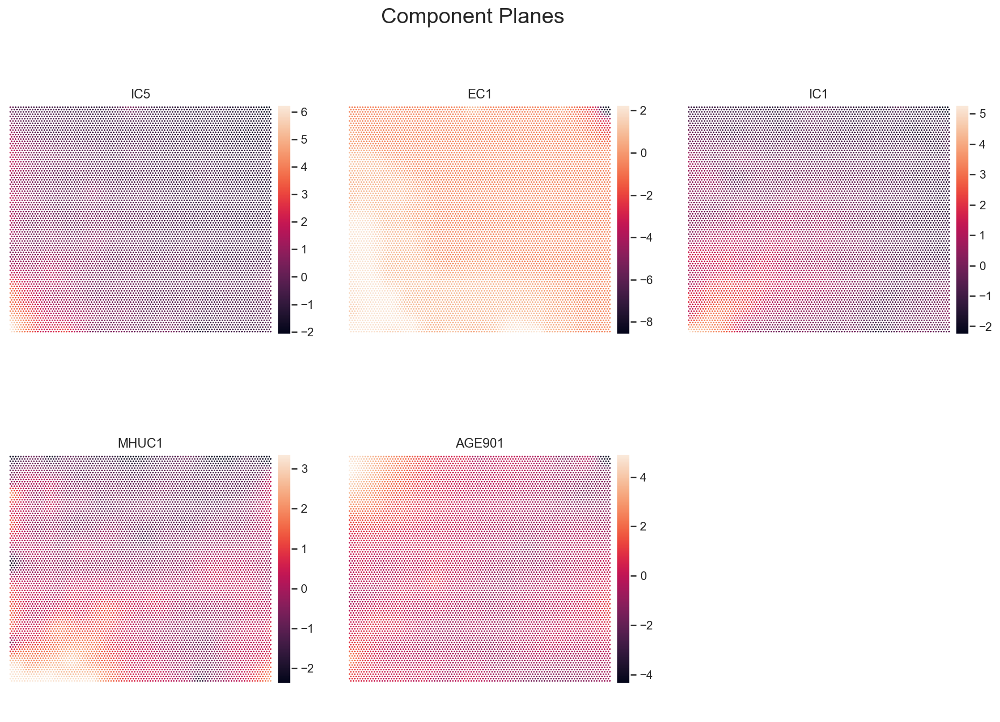

In [64]:
sns.set()
view2D = View2D(12,12,"", text_size=10)
view2D.show(sm, col_sz=3, what='codebook')
plt.subplots_adjust(top=0.90)
plt.suptitle("Component Planes", fontsize=20)
plt.savefig('componentplanes.png')
plt.show()

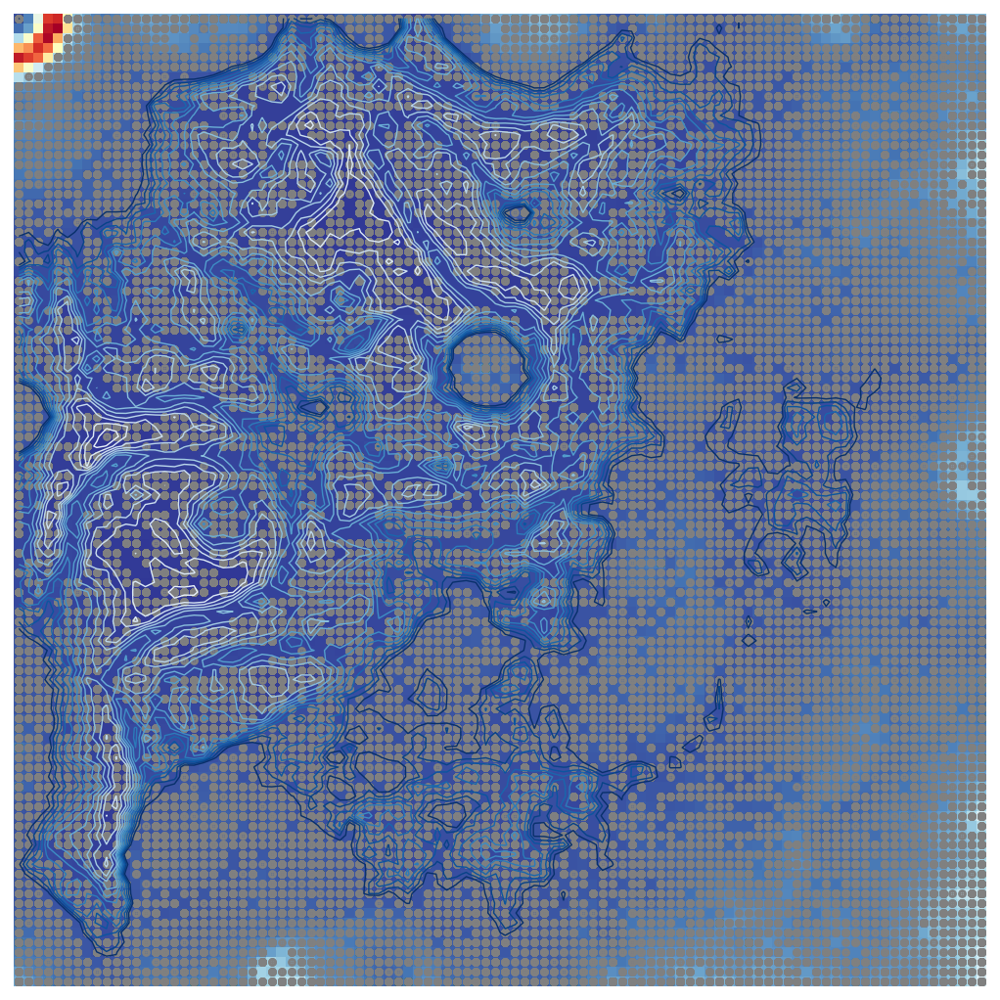

array([[0.08310057, 0.18673452, 0.57188459, ..., 0.28127296, 0.31208534,
        0.31831407],
       [0.1443309 , 0.25386136, 0.64436102, ..., 0.26400403, 0.2523526 ,
        0.2729053 ],
       [0.42522544, 0.63398829, 1.06312779, ..., 0.24716549, 0.24980978,
        0.24561646],
       ...,
       [0.19004695, 0.17535832, 0.17192816, ..., 0.38093398, 0.44508999,
        0.49436527],
       [0.25089335, 0.21131197, 0.18069642, ..., 0.37915792, 0.4049964 ,
        0.51646585],
       [0.27558861, 0.25793405, 0.20867567, ..., 0.37972955, 0.42613416,
        0.53060858]])

In [65]:
u = sompy.umatrix.UMatrixView(12, 12, 'umatrix', show_axis=True, text_size=8, show_text=True)

UMAT = u.show(
    sm, 
    distance2=1, 
    row_normalized=False, 
    show_data=True, 
    contooor=True, # Visualize isomorphic curves
    blob=False
)

UMAT[1]

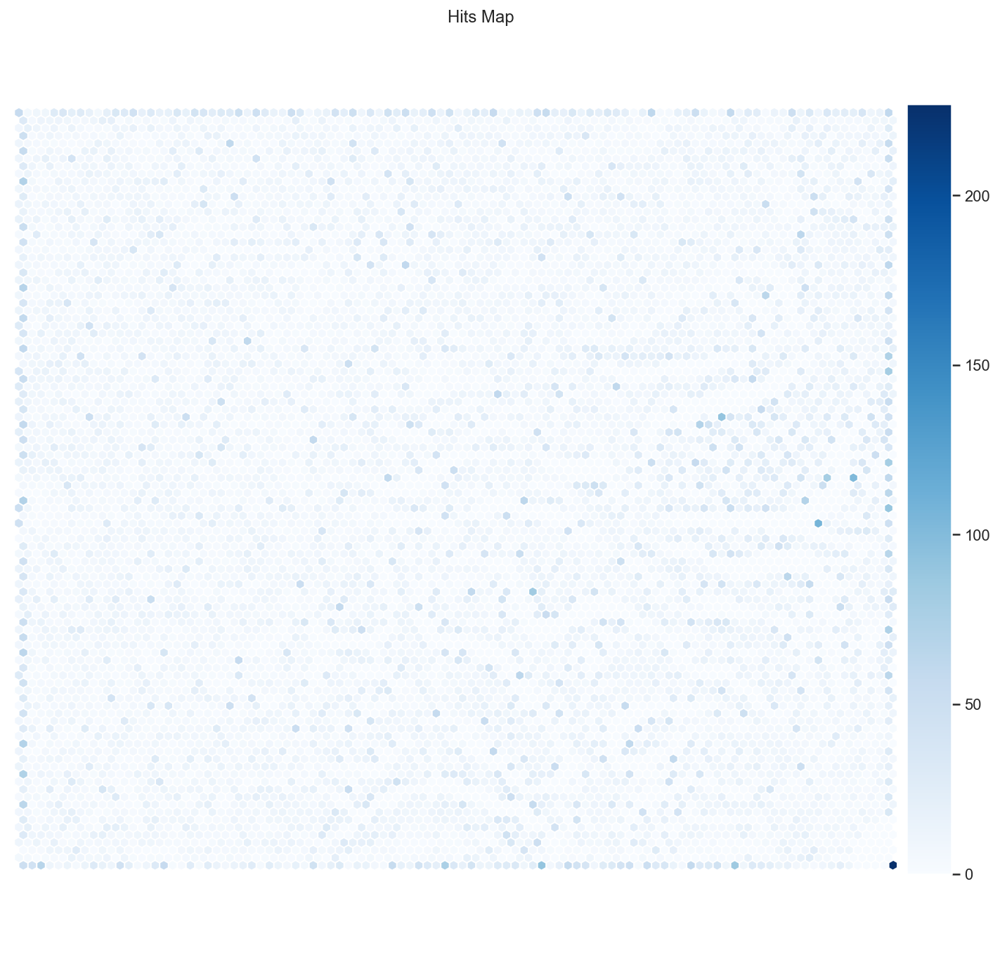

In [66]:
vhts  = BmuHitsView(12,12,"Hits Map")
vhts.show(sm, anotate=False, cmap="Blues")
plt.show()

Obtaining the R² scores for each cluster solution on demographic variables on top of SOM

In [69]:
smdata=pd.DataFrame(sm.get_node_vectors())
r2_scores = {}
r2_scores['kmeans'] = get_r2_scores(smdata, kmeans)

for linkage in ['complete', 'average', 'single', 'ward']:
    r2_scores[linkage] = get_r2_scores(
       smdata, hierarchical.set_params(linkage=linkage)
    )

pd.DataFrame(r2_scores)

,kmeans,complete,average,single,ward
2,0.408865,0.050296,0.037005,0.034669,0.368182
3,0.519976,0.412418,0.296207,0.035666,0.482476
4,0.625858,0.440348,0.307355,0.037662,0.586065
5,0.671435,0.452805,0.310148,0.038269,0.625416
6,0.698237,0.553390,0.420378,0.038285,0.661371
7,0.723799,0.583851,0.436218,0.038296,0.683109
8,0.748601,0.607417,0.447342,0.039238,0.703027
9,0.765762,0.690081,0.452400,0.039911,0.721617


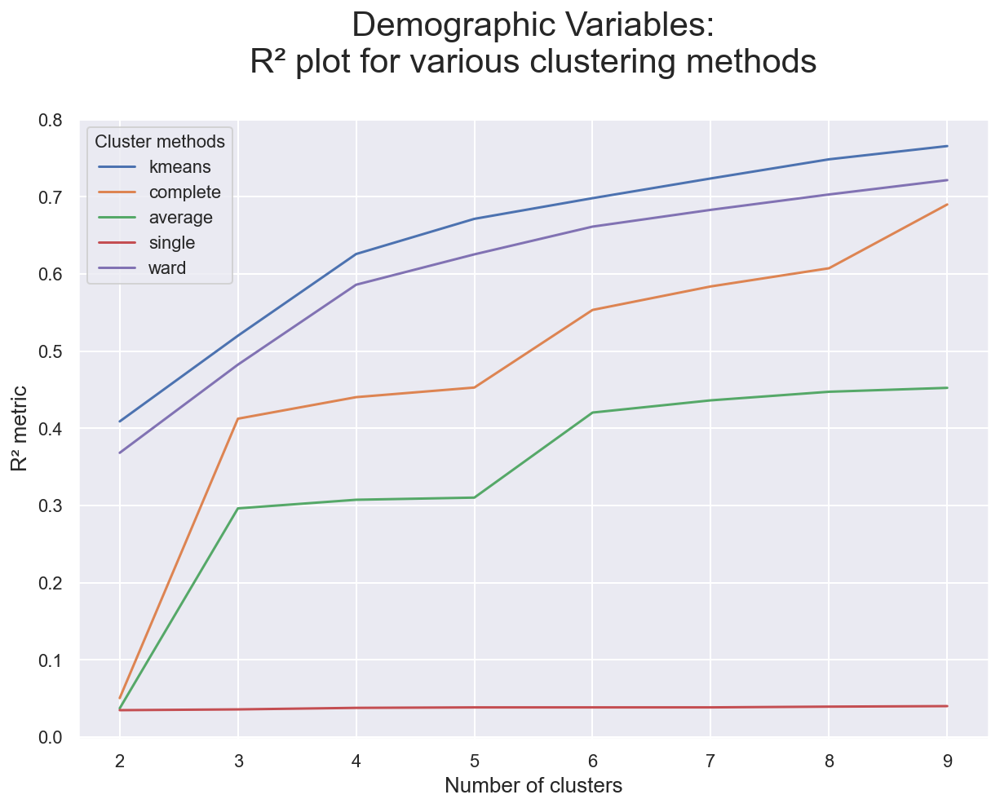

In [70]:
pd.DataFrame(r2_scores).plot.line(figsize=(10,7))

plt.title("Demographic Variables:\nR² plot for various clustering methods\n", fontsize=21)
plt.legend(title="Cluster methods", title_fontsize=11)
plt.xlabel("Number of clusters", fontsize=13)
plt.ylabel("R² metric", fontsize=13)
plt.show()

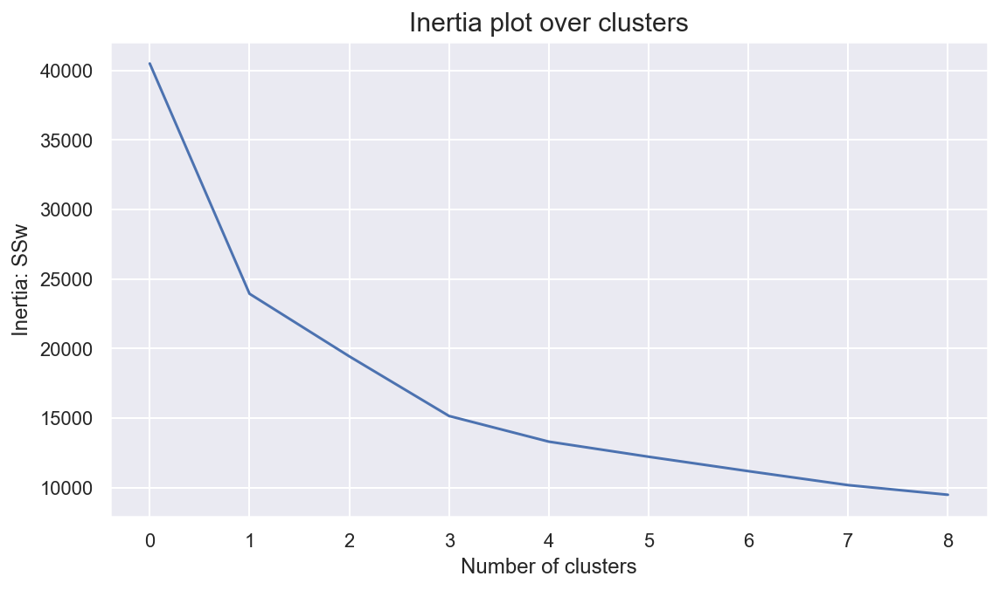

In [71]:
range_clusters = range(1, 10)
inertia = []
for n_clus in range_clusters:  # iterate over desired ncluster range
    kmclust = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
    kmclust.fit(smdata)
    inertia.append(kmclust.inertia_)
# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(inertia)
plt.ylabel("Inertia: SSw")
plt.xlabel("Number of clusters")
plt.title("Inertia plot over clusters", size=15)
plt.show()

For n_clusters = k, the average silhouette_score is : 0.4137864750231508


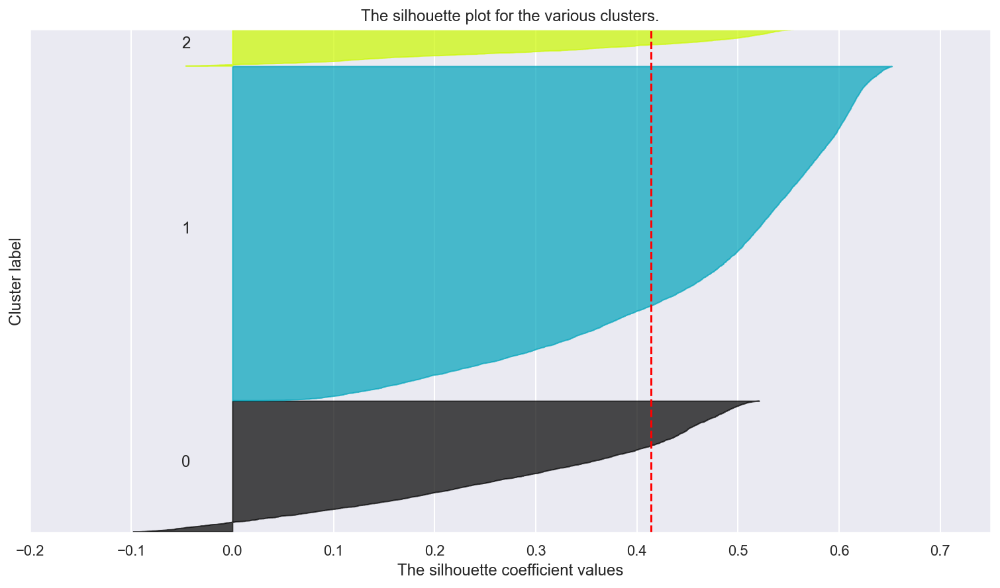

In [92]:
avg_silhouette_plot(smdata,3)

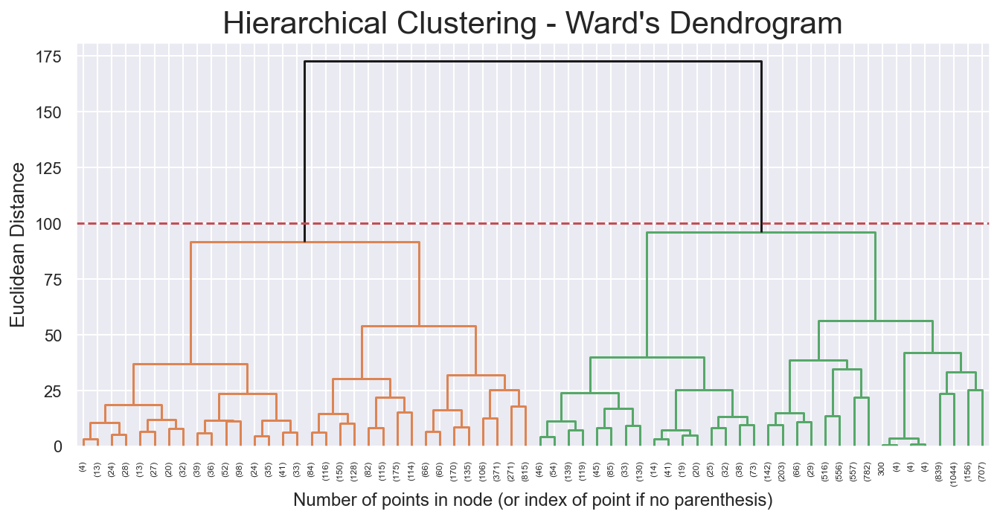

In [94]:
#performs hierarchical clustering on neuron weights and plots a dendogram
linkage = 'ward'
distance = 'euclidean'
hclust = AgglomerativeClustering(linkage=linkage, affinity=distance, distance_threshold=0, n_clusters=None)
hclust.fit_predict(smdata)
# create the counts of samples under each node (number of points being merged)
counts = np.zeros(hclust.children_.shape[0])
n_samples = len(hclust.labels_)

# hclust.children_ contains the observation ids that are being merged together
# At the i-th iteration, children[i][0] and children[i][1] are merged to form node n_samples + i
for i, merge in enumerate(hclust.children_):
    # track the number of observations in the current cluster being formed
    current_count = 0
    for child_idx in merge:
        if child_idx < n_samples:
            # If this is True, then we are merging an observation
            current_count += 1  # leaf node
        else:
            # Otherwise, we are merging a previously formed cluster
            current_count += counts[child_idx - n_samples]
    counts[i] = current_count

# the hclust.children_ is used to indicate the two points/clusters being merged (dendrogram's u-joins)
# the hclust.distances_ indicates the distance between the two points/clusters (height of the u-joins)
# the counts indicate the number of points being merged (dendrogram's x-axis)
linkage_matrix = np.column_stack(
    [hclust.children_, hclust.distances_, counts]
).astype(float)

# Plot the corresponding dendrogram
sns.set()
fig = plt.figure(figsize=(11,5))
# The Dendrogram parameters need to be tuned
y_threshold = 100
dendrogram(linkage_matrix, truncate_mode='level', p=5, color_threshold=y_threshold, above_threshold_color='k')
plt.hlines(y_threshold, 0, 1000, colors="r", linestyles="dashed")
plt.title(f'Hierarchical Clustering - {linkage.title()}\'s Dendrogram', fontsize=21)
plt.xlabel('Number of points in node (or index of point if no parenthesis)')
plt.ylabel(f'{distance.title()} Distance', fontsize=13)
plt.show()

#### Considering the results, we apply K-means with 3 clusters

In [95]:
demo_kmeans = KMeans(n_clusters=3, init='k-means++', n_init=50, random_state=42)
demo_nodeclus_labels = sm.cluster(demo_kmeans)

#### Applying SOM clusetring solution  to observations

In [359]:
# Check the nodes and and respective clusters
smdata.columns=demo_features
df_demo_nodes = smdata
df_demo_nodes['label'] = demo_nodeclus_labels

bmus_map = sm.find_bmu(data_demo[demo_features])[0]  # get bmus for each observation in df

demo_bmus = pd.DataFrame(
    np.concatenate((data_demo, np.expand_dims(bmus_map,1)), axis=1),
    index=data_demo.index, columns=np.append(data_demo.columns,"BMU")
)

demo_SOM_final = demo_bmus.merge(df_demo_nodes['label'], 'left', left_on="BMU", right_index=True)

In [99]:
sst = get_ss(demo_SOM_final[demo_features])  # get total sum of squares
ssw_labels = demo_SOM_final[demo_features + ["label"]].groupby(by='label').apply(get_ss)  # compute ssw for each cluster labels
ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
r2 = ssb / sst
r2

0.4724246794292757

In [203]:
def get_ss(df):
    """Computes the sum of squares for all variables given a dataset
    """
    ss = np.sum(df.var() * (df.count() - 1))
    return ss  # return sum of sum of squares of each df variable

def r2(df, labels):
    sst = get_ss(df)
    ssw = np.sum(df.groupby(labels).apply(get_ss))
    return 1 - ssw/sst
    
def get_r2_scores(df, clusterer, min_k=2, max_k=10):
    """
    Loop over different values of k. To be used with sklearn clusterers.
    """
    r2_clust = {}
    for n in range(min_k, max_k):
        clust = clone(clusterer).set_params(n_clusters=n)
        labels = clust.fit_predict(df)
        r2_clust[n] = r2(df, labels)
    return r2_clust


# Set up the clusterers
kmeans = KMeans(
    init='k-means++',
    n_init=20,
    random_state=42
)

hierarchical = AgglomerativeClustering(
    affinity='euclidean'
)

### K-means

In [204]:
r2_scores = {}
r2_scores['kmeans'] = get_r2_scores(data_demo, kmeans)

pd.DataFrame(r2_scores)

,kmeans
2,0.378444
3,0.478616
4,0.575083
5,0.626340
6,0.665023
7,0.692975
8,0.714774
9,0.731008


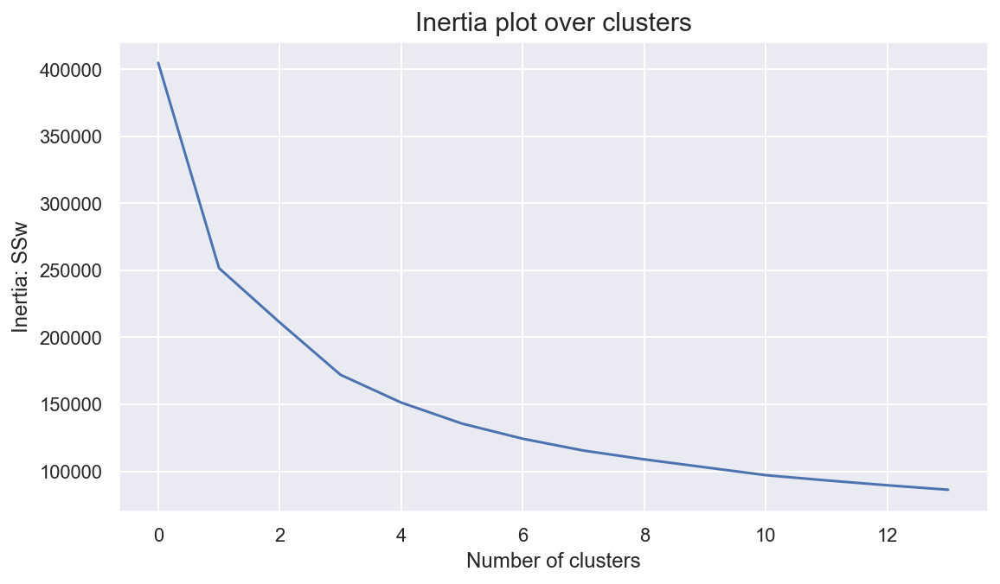

In [205]:
range_clusters = range(1, 15)
inertia = []
for n_clus in range_clusters:  # iterate over desired ncluster range
    kmclust = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
    kmclust.fit(data_demo)
    inertia.append(kmclust.inertia_)
# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(inertia)
plt.ylabel("Inertia: SSw")
plt.xlabel("Number of clusters")
plt.title("Inertia plot over clusters", size=15)
plt.show()

For n_clusters = k, the average silhouette_score is : 0.30965107899058003


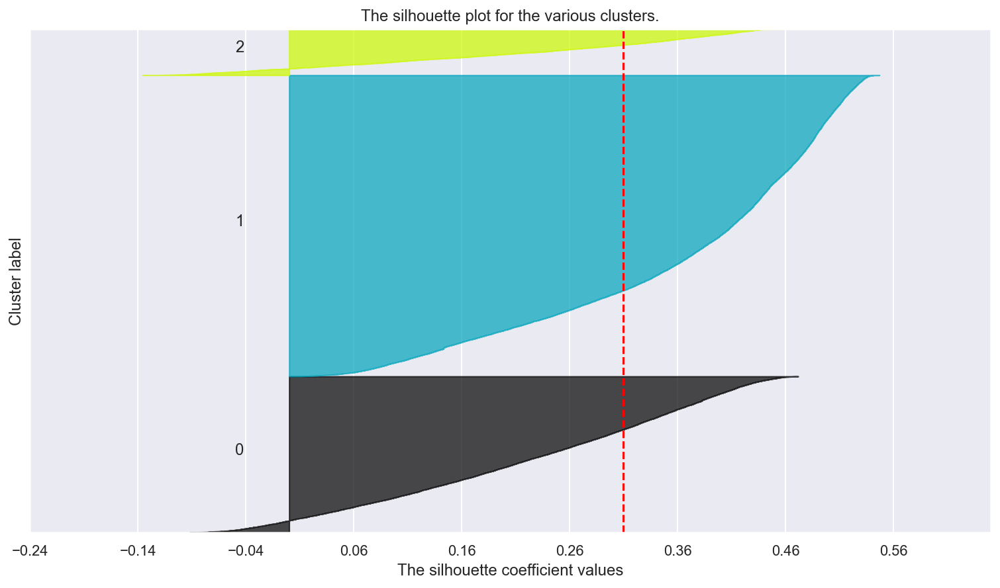

In [206]:
avg_silhouette_plot(data_demo,3)

For n_clusters = k, the average silhouette_score is : 0.3415430295678549


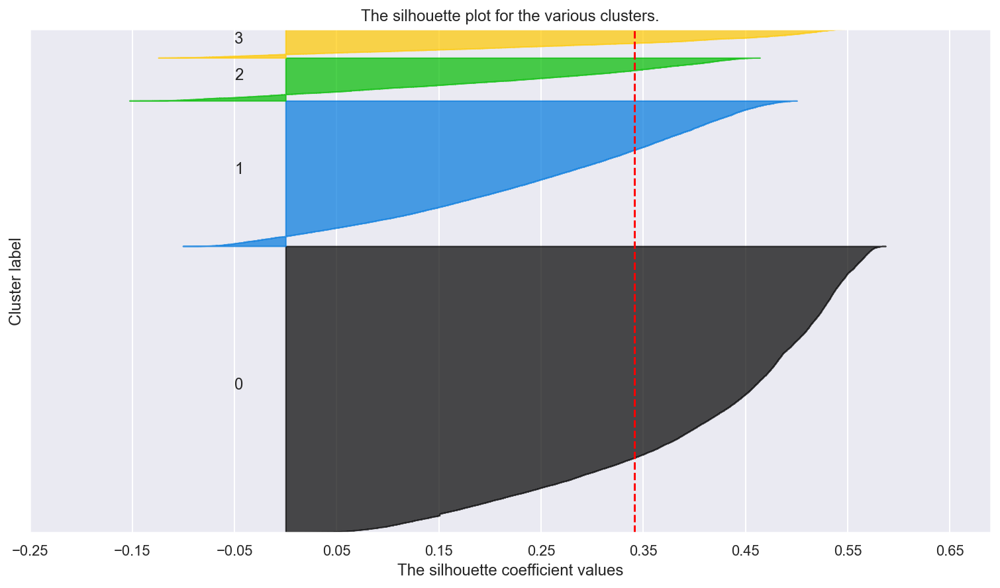

In [207]:
avg_silhouette_plot(data_demo,4)

In [208]:
# after slecting the number of clusters, apply k-means to the demographic data

km_demo = KMeans(n_clusters=3, init='k-means++', n_init=50, random_state=42)
km_demo.fit(data_demo)

demo_labels=km_demo.predict(data_demo)

df_concat_demo = pd.concat((data_demo, pd.Series(demo_labels, name='demo_labels', index= data_demo.index)), axis=1)
df_concat_demo

,IC5,EC1,IC1,MHUC1,AGE901,demo_labels
0,-0.348206,-0.565264,-0.198827,-0.610259,0.558146,1
1,-0.524832,-0.565264,-0.575725,0.277008,0.050731,1
2,-0.044551,-0.565264,0.332868,2.347298,-0.329830,0
3,-0.759972,-0.565264,-0.649758,-0.610259,-0.202976,1
4,0.021531,-0.565264,0.184801,0.277008,-0.329830,1
...,...,...,...,...,...,...
80956,-1.069978,-0.699556,-1.194914,-0.018748,-0.456683,1
80957,-0.449695,-0.565264,-0.757443,-1.497526,0.177585,1
80958,-0.549967,-0.565264,-0.346894,-0.610259,0.431292,1
80959,0.452351,0.509073,0.649193,2.347298,-0.837244,0


In [209]:
sst = get_ss(df_concat_demo[demo_features])  # get total sum of squares

ssw_labels = df_concat_demo[demo_features + ["demo_labels"]].groupby(by='demo_labels').apply(get_ss)  # compute ssw for each cluster labels

ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB

r2 = ssb / sst

r2

0.47861715019725665

### DBSCAN

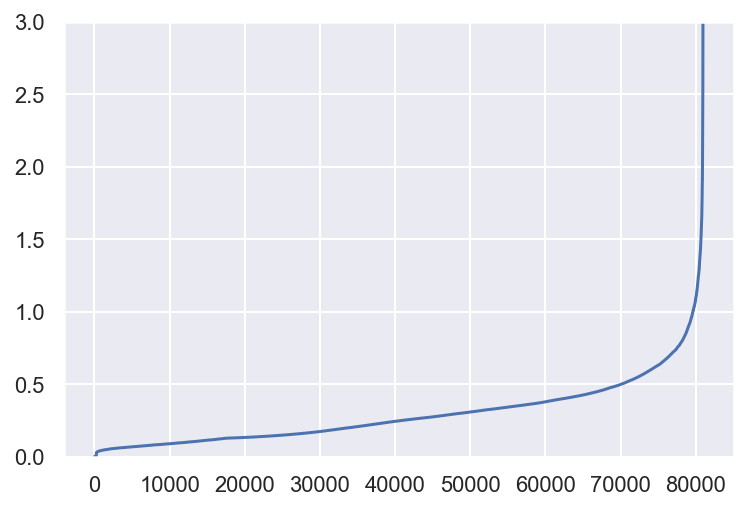

In [210]:
# K-distance graph to find out the right eps value
neigh = NearestNeighbors(n_neighbors=20)
neigh.fit(data_demo)
distances, _ = neigh.kneighbors(data_demo)
distances = np.sort(distances[:, -1])
plt.ylim(top=3) 
plt.plot(distances)
plt.show()

In [211]:
# Perform DBSCAN clustering
dbscan = DBSCAN(eps=0.75, min_samples=20, n_jobs=-1)
dbscan_labels = dbscan.fit_predict(data_demo)

dbscan_n_clusters = len(np.unique(dbscan_labels))
print("Number of estimated clusters : %d" % dbscan_n_clusters)

Number of estimated clusters : 3


In [212]:
# Concatenating the labels to df
data_concat = pd.concat([data_demo, pd.Series(dbscan_labels, index=data.index, name="dbscan_labels")], axis=1)

# Detecting noise (potential outliers)
data_concat.loc[data_concat['dbscan_labels'] == -1]

,IC5,EC1,IC1,MHUC1,AGE901,dbscan_labels
10,-0.950786,1.717701,0.130958,-0.610259,-1.725220,-1
63,4.790279,2.120577,2.701939,-0.018748,0.685000,-1
178,-1.444175,-2.579644,-1.659306,-2.384793,-1.598366,-1
293,1.870218,0.777657,0.965518,3.234565,1.826682,-1
347,3.480116,0.777657,0.400171,3.530321,1.065561,-1
...,...,...,...,...,...,...
80850,-0.508075,-2.042476,0.440553,-1.201770,-1.217805,-1
80865,2.866725,-0.565264,-0.219018,-1.497526,-0.329830,-1
80918,5.475428,2.120577,-0.023839,3.530321,2.080390,-1
80923,0.986821,-0.162388,-0.259400,2.643054,1.953536,-1


In [213]:
# Computing the R^2 of the cluster solution
data_nonoise = data_concat.loc[data_concat['dbscan_labels'] != -1]
sst = get_ss(data_demo)  # get total sum of squares
ssw_labels = data_nonoise.groupby(by='dbscan_labels').apply(get_ss)  # compute ssw for each cluster labels
ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
r2 = ssb / sst
print("Cluster solution with R^2 of %0.4f" % r2)

Cluster solution with R^2 of 0.1803


### Mean Shift

In [214]:
# The following bandwidth can be automatically detected using (we need to set quantile though)
# Based on distance to nearest neighbors for all observations
bandwidth = estimate_bandwidth(data_demo, quantile=0.15, random_state=1, n_jobs=-1)
bandwidth

1.5635711472214333

In [215]:
# Perform mean-shift clustering with bandwidth set using estimate_bandwidth
ms = MeanShift(bandwidth=bandwidth, bin_seeding=True, n_jobs=4)
ms_labels = ms.fit_predict(data_demo)

ms_n_clusters = len(np.unique(ms_labels))
print("Number of estimated clusters : %d" % ms_n_clusters)

Number of estimated clusters : 29


In [216]:
# Concatenating the labels to df
databd_concat = pd.concat([data_demo, pd.Series(ms_labels, index=data.index, name="ms_labels")], axis=1)
databd_concat.head()

,IC5,EC1,IC1,MHUC1,AGE901,ms_labels
0,-0.348206,-0.565264,-0.198827,-0.610259,0.558146,0
1,-0.524832,-0.565264,-0.575725,0.277008,0.050731,0
2,-0.044551,-0.565264,0.332868,2.347298,-0.329830,0
3,-0.759972,-0.565264,-0.649758,-0.610259,-0.202976,0
4,0.021531,-0.565264,0.184801,0.277008,-0.329830,0


In [217]:
# Computing the R^2 of the cluster solution
sst = get_ss(data_demo)  # get total sum of squares
ssw_labels = databd_concat.groupby(by='ms_labels').apply(get_ss)  # compute ssw for each cluster labels
ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
r2 = ssb / sst
print("Cluster solution with R^2 of %0.4f" % r2)

Cluster solution with R^2 of 0.4655


### GMM

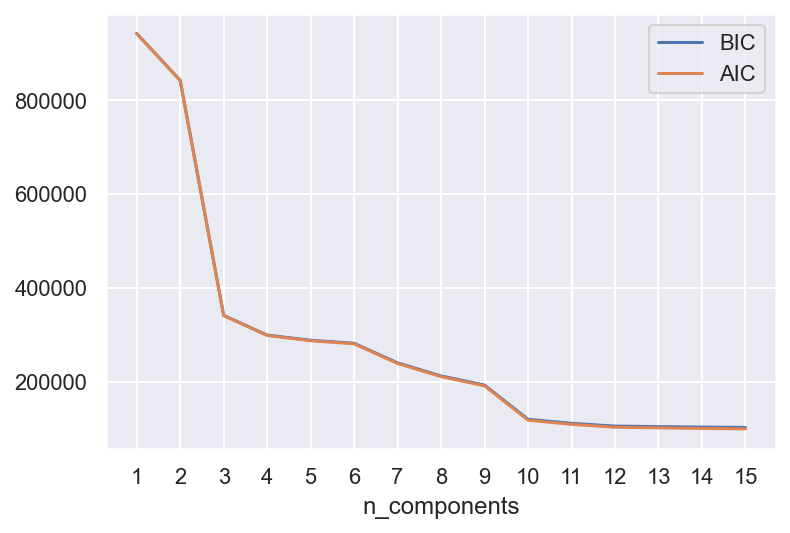

In [127]:
# Selecting number of components based on AIC and BIC
n_components = np.arange(1, 16)
models = [GaussianMixture(n, covariance_type='full', n_init=10, random_state=1).fit(data_demo)
          for n in n_components]

bic_values = [m.bic(data_demo) for m in models]
aic_values = [m.aic(data_demo) for m in models]
plt.plot(n_components, bic_values, label='BIC')
plt.plot(n_components, aic_values, label='AIC')
plt.legend(loc='best')
plt.xlabel('n_components')
plt.xticks(n_components)
plt.show()

In [136]:
# Performing GMM clustering
gmm = GaussianMixture(n_components=7, covariance_type='full', n_init=5, init_params='kmeans', random_state=1)
gmm_labels = gmm.fit_predict(data_demo)
labels_proba = gmm.predict_proba(data_demo)

In [137]:
# The estimated component weights
gmm.weights_

array([0.23187443, 0.06238074, 0.04571936, 0.05833568, 0.00974559,
       0.48843279, 0.10351141])

In [138]:
gmm.covariances_.shape

(7, 5, 5)

In [141]:
for c in range(4, 8):  
    # Performing GMM c:lustering
    gmm = GaussianMixture(n_components=c, covariance_type='full', n_init=5, init_params='kmeans', random_state=1)
    gmm_labels = gmm.fit_predict(data_demo)
    labels_proba = gmm.predict_proba(data_demo)
    # Concatenating the labels to df
    df_concat = pd.concat([data_demo, pd.Series(gmm_labels, index=data_demo.index, name="gmm_labels")], axis=1)
    # Computing the R^2 of the cluster solution
    sst = get_ss(data_demo)  # get total sum of squares
    ssw_labels = df_concat.groupby(by='gmm_labels').apply(get_ss)  # compute ssw for each cluster labels
    ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
    r2 = ssb / sst
    print("Cluster solution with R^2 of %0.4f" % r2)

Cluster solution with R^2 of 0.3322
Cluster solution with R^2 of 0.4245
Cluster solution with R^2 of 0.4590
Cluster solution with R^2 of 0.4886


# Gift Features

### PCA

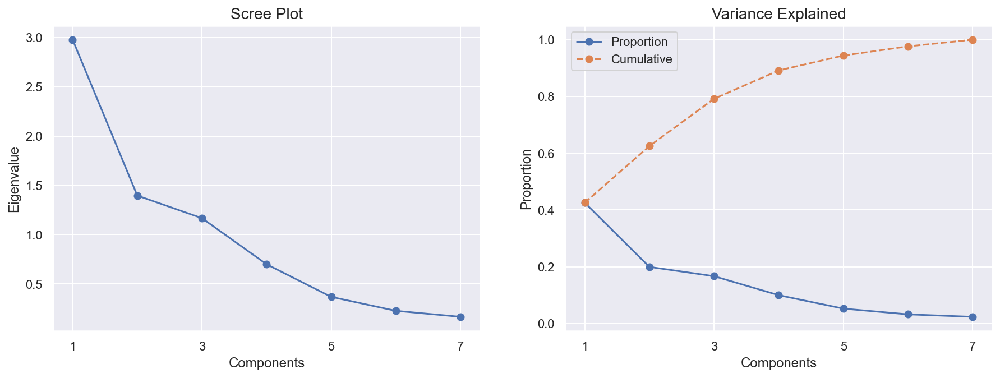

In [317]:
data_gift_pca = data_gift.copy()
pca = PCA()
pca_feat = pca.fit_transform(data_gift_pca)
    
# figure and axes
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

# draw plots
ax1.plot(pca.explained_variance_, marker=".", markersize=12)
ax2.plot(pca.explained_variance_ratio_, marker=".", markersize=12, label="Proportion")
ax2.plot(np.cumsum(pca.explained_variance_ratio_), marker=".", markersize=12, linestyle="--", label="Cumulative")
# customizations
ax2.legend()
ax1.set_title("Scree Plot", fontsize=14)
ax2.set_title("Variance Explained", fontsize=14)
ax1.set_ylabel("Eigenvalue")
ax2.set_ylabel("Proportion")
ax1.set_xlabel("Components")
ax2.set_xlabel("Components")
ax1.set_xticks(range(0, pca.n_components_, 2))
ax1.set_xticklabels(range(1, pca.n_components_ + 1, 2))
ax2.set_xticks(range(0, pca.n_components_, 2))
ax2.set_xticklabels(range(1, pca.n_components_ + 1, 2))
plt.show()

In [318]:
pca = PCA(n_components=3)
pca_feat = pca.fit_transform(data_gift_pca)
pca_feat_names = [f"PC{i}" for i in range(pca.n_components_)]
pca_df = pd.DataFrame(pca_feat, index=data_gift_pca.index, columns=pca_feat_names)

In [320]:
def get_ss(df):
    """Computes the sum of squares for all variables given a dataset
    """
    ss = np.sum(df.var() * (df.count() - 1))
    return ss  # return sum of sum of squares of each df variable

def r2(df, labels):
    sst = get_ss(df)
    ssw = np.sum(df.groupby(labels).apply(get_ss))
    return 1 - ssw/sst
    
def get_r2_scores(df, clusterer, min_k=2, max_k=10):
    """
    Loop over different values of k. To be used with sklearn clusterers.
    """
    r2_clust = {}
    for n in range(min_k, max_k):
        clust = clone(clusterer).set_params(n_clusters=n)
        labels = clust.fit_predict(df)
        r2_clust[n] = r2(df, labels)
    return r2_clust


# Set up the clusterers
kmeans = KMeans(
    init='k-means++',
    n_init=20,
    random_state=42
)

hierarchical = AgglomerativeClustering(
    affinity='euclidean'
)

In [321]:
r2_scores = {}
r2_scores['kmeans'] = get_r2_scores(pca_df, kmeans)

pd.DataFrame(r2_scores)

,kmeans
2,0.349053
3,0.473124
4,0.546759
5,0.602949
6,0.647931
7,0.689412
8,0.719818
9,0.745060


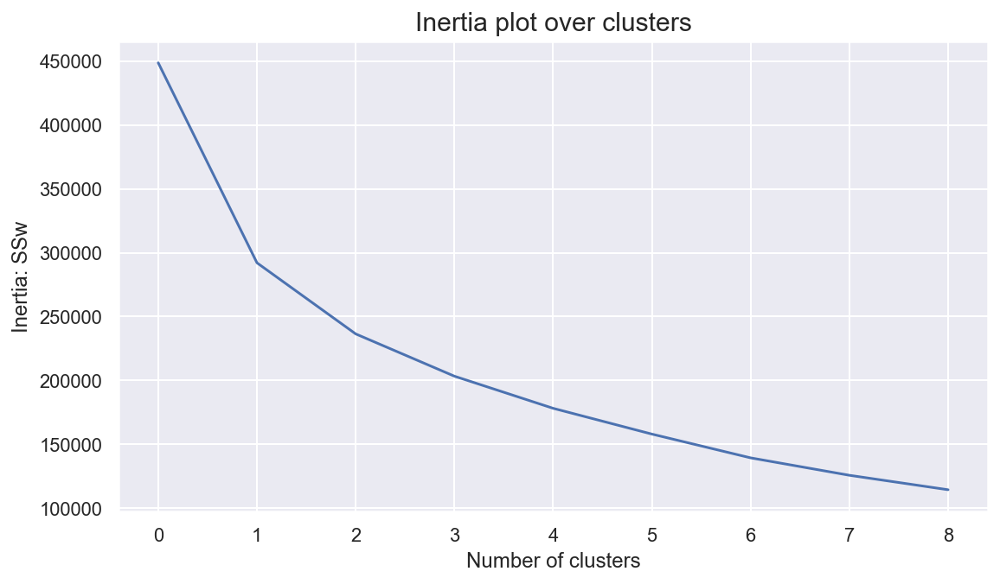

In [322]:
range_clusters = range(1, 10)
inertia = []
for n_clus in range_clusters:  # iterate over desired ncluster range
    kmclust = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
    kmclust.fit(pca_df)
    inertia.append(kmclust.inertia_)
# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(inertia)
plt.ylabel("Inertia: SSw")
plt.xlabel("Number of clusters")
plt.title("Inertia plot over clusters", size=15)
plt.show()

For n_clusters = k, the average silhouette_score is : 0.26398593506698753


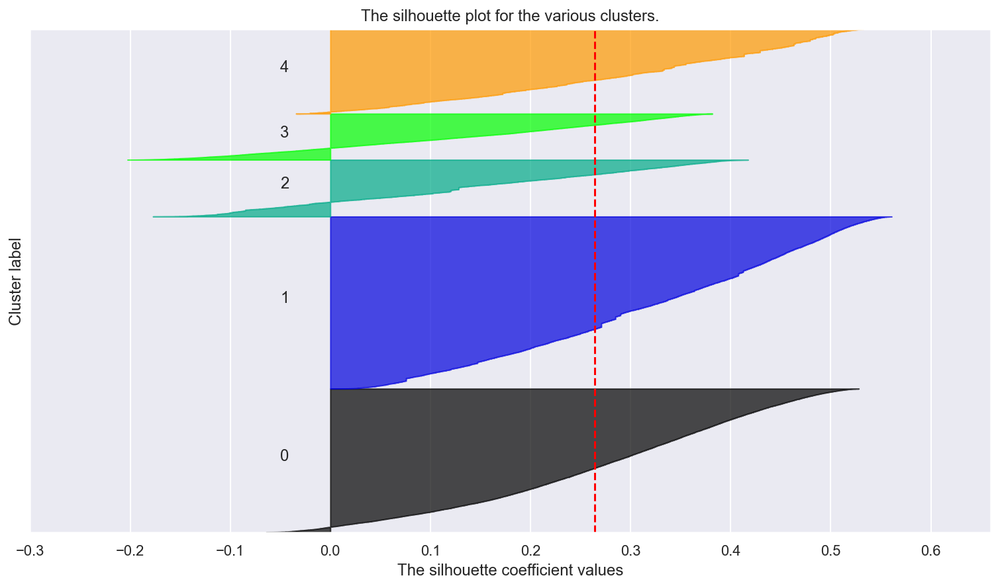

In [323]:
avg_silhouette_plot(pca_df,5)

### Self Organizing Maps

In [325]:
# This som implementation does not have a random seed parameter
# We're going to set it up ourselves
np.random.seed(42)

sm = sompy.SOMFactory().build(
    data_gift.values, 
    mapsize=(100, 100),
    initialization='random', 
    neighborhood='gaussian',
    training='batch',
    lattice='hexa',
    component_names=gift_features
)
sm.train(n_job=-1, train_rough_len=500, train_finetune_len=500)
# sm.train(n_job=4, verbose='info', train_rough_len=100, train_finetune_len=100)

 Training...
 random_initialization took: 0.063000 seconds
 Rough training...
 radius_ini: 34.000000 , radius_final: 5.666667, trainlen: 500

 epoch: 1 ---> elapsed time:  37.186000, quantization error: 1.977321

 epoch: 2 ---> elapsed time:  32.265000, quantization error: 2.364187

 epoch: 3 ---> elapsed time:  33.469000, quantization error: 2.349170

 epoch: 4 ---> elapsed time:  32.125000, quantization error: 2.341624

 epoch: 5 ---> elapsed time:  33.902000, quantization error: 2.337490

 epoch: 6 ---> elapsed time:  30.773000, quantization error: 2.335966

 epoch: 7 ---> elapsed time:  29.179000, quantization error: 2.335674

 epoch: 8 ---> elapsed time:  28.940000, quantization error: 2.335555

 epoch: 9 ---> elapsed time:  29.278000, quantization error: 2.335442

 epoch: 10 ---> elapsed time:  28.850000, quantization error: 2.335326

 epoch: 11 ---> elapsed time:  29.329000, quantization error: 2.335207

 epoch: 12 ---> elapsed time:  29.068000, quantization error: 2.335086

 ep

 epoch: 113 ---> elapsed time:  28.980000, quantization error: 2.318746

 epoch: 114 ---> elapsed time:  29.871000, quantization error: 2.318534

 epoch: 115 ---> elapsed time:  28.922000, quantization error: 2.318321

 epoch: 116 ---> elapsed time:  28.875000, quantization error: 2.318107

 epoch: 117 ---> elapsed time:  28.862000, quantization error: 2.317891

 epoch: 118 ---> elapsed time:  29.052000, quantization error: 2.317674

 epoch: 119 ---> elapsed time:  28.651000, quantization error: 2.317455

 epoch: 120 ---> elapsed time:  28.794000, quantization error: 2.317236

 epoch: 121 ---> elapsed time:  28.780000, quantization error: 2.317015

 epoch: 122 ---> elapsed time:  28.913000, quantization error: 2.316792

 epoch: 123 ---> elapsed time:  28.961000, quantization error: 2.316568

 epoch: 124 ---> elapsed time:  28.896000, quantization error: 2.316343

 epoch: 125 ---> elapsed time:  28.735000, quantization error: 2.316117

 epoch: 126 ---> elapsed time:  28.716000, quantiza

 epoch: 226 ---> elapsed time:  29.040000, quantization error: 2.283810

 epoch: 227 ---> elapsed time:  29.033000, quantization error: 2.283363

 epoch: 228 ---> elapsed time:  29.095000, quantization error: 2.282914

 epoch: 229 ---> elapsed time:  29.149000, quantization error: 2.282462

 epoch: 230 ---> elapsed time:  30.076000, quantization error: 2.282005

 epoch: 231 ---> elapsed time:  28.990000, quantization error: 2.281546

 epoch: 232 ---> elapsed time:  29.172000, quantization error: 2.281083

 epoch: 233 ---> elapsed time:  28.694000, quantization error: 2.280616

 epoch: 234 ---> elapsed time:  29.014000, quantization error: 2.280146

 epoch: 235 ---> elapsed time:  28.820000, quantization error: 2.279672

 epoch: 236 ---> elapsed time:  29.548000, quantization error: 2.279195

 epoch: 237 ---> elapsed time:  29.094000, quantization error: 2.278714

 epoch: 238 ---> elapsed time:  29.376000, quantization error: 2.278229

 epoch: 239 ---> elapsed time:  28.857000, quantiza

 epoch: 339 ---> elapsed time:  29.201000, quantization error: 2.201421

 epoch: 340 ---> elapsed time:  29.254000, quantization error: 2.200255

 epoch: 341 ---> elapsed time:  29.203000, quantization error: 2.199075

 epoch: 342 ---> elapsed time:  28.944000, quantization error: 2.197882

 epoch: 343 ---> elapsed time:  28.712000, quantization error: 2.196677

 epoch: 344 ---> elapsed time:  28.874000, quantization error: 2.195461

 epoch: 345 ---> elapsed time:  28.935000, quantization error: 2.194233

 epoch: 346 ---> elapsed time:  29.108000, quantization error: 2.192990

 epoch: 347 ---> elapsed time:  29.002000, quantization error: 2.191734

 epoch: 348 ---> elapsed time:  28.873000, quantization error: 2.190467

 epoch: 349 ---> elapsed time:  28.876000, quantization error: 2.189188

 epoch: 350 ---> elapsed time:  29.321000, quantization error: 2.187897

 epoch: 351 ---> elapsed time:  29.044000, quantization error: 2.186592

 epoch: 352 ---> elapsed time:  29.197000, quantiza

 epoch: 452 ---> elapsed time:  28.950000, quantization error: 1.939988

 epoch: 453 ---> elapsed time:  28.986000, quantization error: 1.935751

 epoch: 454 ---> elapsed time:  28.839000, quantization error: 1.931489

 epoch: 455 ---> elapsed time:  29.216000, quantization error: 1.927178

 epoch: 456 ---> elapsed time:  29.076000, quantization error: 1.922833

 epoch: 457 ---> elapsed time:  29.081000, quantization error: 1.918476

 epoch: 458 ---> elapsed time:  28.762000, quantization error: 1.914077

 epoch: 459 ---> elapsed time:  29.071000, quantization error: 1.909622

 epoch: 460 ---> elapsed time:  29.094000, quantization error: 1.905108

 epoch: 461 ---> elapsed time:  29.008000, quantization error: 1.900561

 epoch: 462 ---> elapsed time:  29.327000, quantization error: 1.895951

 epoch: 463 ---> elapsed time:  28.981000, quantization error: 1.891291

 epoch: 464 ---> elapsed time:  28.846000, quantization error: 1.886583

 epoch: 465 ---> elapsed time:  28.862000, quantiza

 epoch: 65 ---> elapsed time:  29.261000, quantization error: 1.855293

 epoch: 66 ---> elapsed time:  28.659000, quantization error: 1.853974

 epoch: 67 ---> elapsed time:  28.931000, quantization error: 1.852641

 epoch: 68 ---> elapsed time:  29.207000, quantization error: 1.851308

 epoch: 69 ---> elapsed time:  29.102000, quantization error: 1.849943

 epoch: 70 ---> elapsed time:  28.580000, quantization error: 1.848593

 epoch: 71 ---> elapsed time:  28.660000, quantization error: 1.847259

 epoch: 72 ---> elapsed time:  28.997000, quantization error: 1.845914

 epoch: 73 ---> elapsed time:  29.253000, quantization error: 1.844569

 epoch: 74 ---> elapsed time:  28.872000, quantization error: 1.843194

 epoch: 75 ---> elapsed time:  29.180000, quantization error: 1.841837

 epoch: 76 ---> elapsed time:  29.105000, quantization error: 1.840477

 epoch: 77 ---> elapsed time:  29.033000, quantization error: 1.839103

 epoch: 78 ---> elapsed time:  28.853000, quantization error: 1.

 epoch: 178 ---> elapsed time:  28.647000, quantization error: 1.670965

 epoch: 179 ---> elapsed time:  29.272000, quantization error: 1.668910

 epoch: 180 ---> elapsed time:  29.114000, quantization error: 1.666901

 epoch: 181 ---> elapsed time:  29.202000, quantization error: 1.664936

 epoch: 182 ---> elapsed time:  28.683000, quantization error: 1.662925

 epoch: 183 ---> elapsed time:  29.188000, quantization error: 1.660827

 epoch: 184 ---> elapsed time:  28.905000, quantization error: 1.658767

 epoch: 185 ---> elapsed time:  29.790000, quantization error: 1.656755

 epoch: 186 ---> elapsed time:  28.689000, quantization error: 1.654326

 epoch: 187 ---> elapsed time:  28.789000, quantization error: 1.651997

 epoch: 188 ---> elapsed time:  28.914000, quantization error: 1.649828

 epoch: 189 ---> elapsed time:  29.237000, quantization error: 1.647683

 epoch: 190 ---> elapsed time:  29.041000, quantization error: 1.645584

 epoch: 191 ---> elapsed time:  29.139000, quantiza

 epoch: 291 ---> elapsed time:  28.735000, quantization error: 1.397751

 epoch: 292 ---> elapsed time:  29.374000, quantization error: 1.394879

 epoch: 293 ---> elapsed time:  28.804000, quantization error: 1.391985

 epoch: 294 ---> elapsed time:  28.933000, quantization error: 1.389107

 epoch: 295 ---> elapsed time:  29.081000, quantization error: 1.386135

 epoch: 296 ---> elapsed time:  29.125000, quantization error: 1.383246

 epoch: 297 ---> elapsed time:  29.205000, quantization error: 1.380382

 epoch: 298 ---> elapsed time:  29.215000, quantization error: 1.377493

 epoch: 299 ---> elapsed time:  29.008000, quantization error: 1.374569

 epoch: 300 ---> elapsed time:  29.127000, quantization error: 1.371672

 epoch: 301 ---> elapsed time:  28.901000, quantization error: 1.368747

 epoch: 302 ---> elapsed time:  28.879000, quantization error: 1.365764

 epoch: 303 ---> elapsed time:  28.938000, quantization error: 1.362843

 epoch: 304 ---> elapsed time:  29.437000, quantiza

 epoch: 404 ---> elapsed time:  29.092000, quantization error: 1.013870

 epoch: 405 ---> elapsed time:  29.231000, quantization error: 1.009934

 epoch: 406 ---> elapsed time:  29.057000, quantization error: 1.006154

 epoch: 407 ---> elapsed time:  29.351000, quantization error: 1.002320

 epoch: 408 ---> elapsed time:  29.495000, quantization error: 0.998490

 epoch: 409 ---> elapsed time:  28.710000, quantization error: 0.994664

 epoch: 410 ---> elapsed time:  28.813000, quantization error: 0.990779

 epoch: 411 ---> elapsed time:  28.839000, quantization error: 0.986855

 epoch: 412 ---> elapsed time:  29.565000, quantization error: 0.982918

 epoch: 413 ---> elapsed time:  28.715000, quantization error: 0.979009

 epoch: 414 ---> elapsed time:  28.810000, quantization error: 0.975034

 epoch: 415 ---> elapsed time:  28.904000, quantization error: 0.970957

 epoch: 416 ---> elapsed time:  29.359000, quantization error: 0.967052

 epoch: 417 ---> elapsed time:  28.786000, quantiza

C:\Users\joaof\anaconda3\lib\site-packages\sompy\visualization\plot_tools.py:45: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  ax = fig.add_subplot(shape[0], shape[1], comp + 1, aspect='equal')


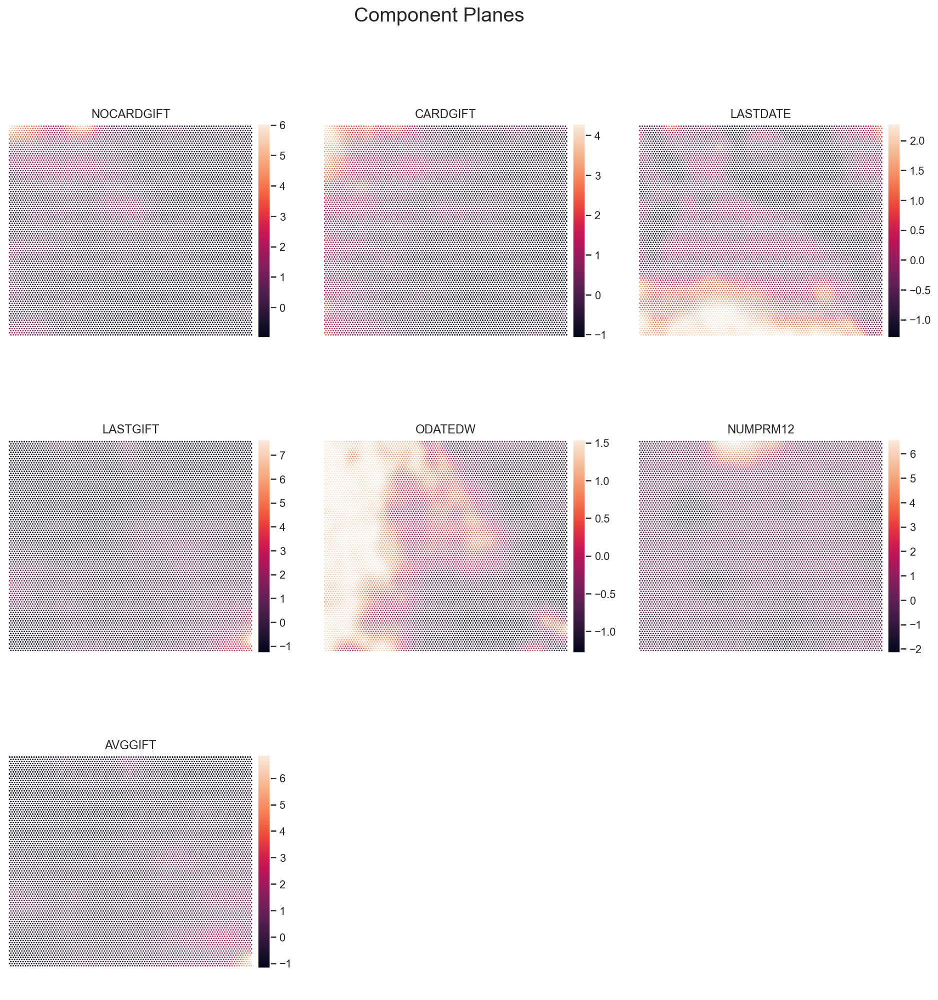

In [326]:
sns.set()
view2D = View2D(12,12,"", text_size=10)
view2D.show(sm, col_sz=3, what='codebook')
plt.subplots_adjust(top=0.90)
plt.suptitle("Component Planes", fontsize=20)
plt.show()

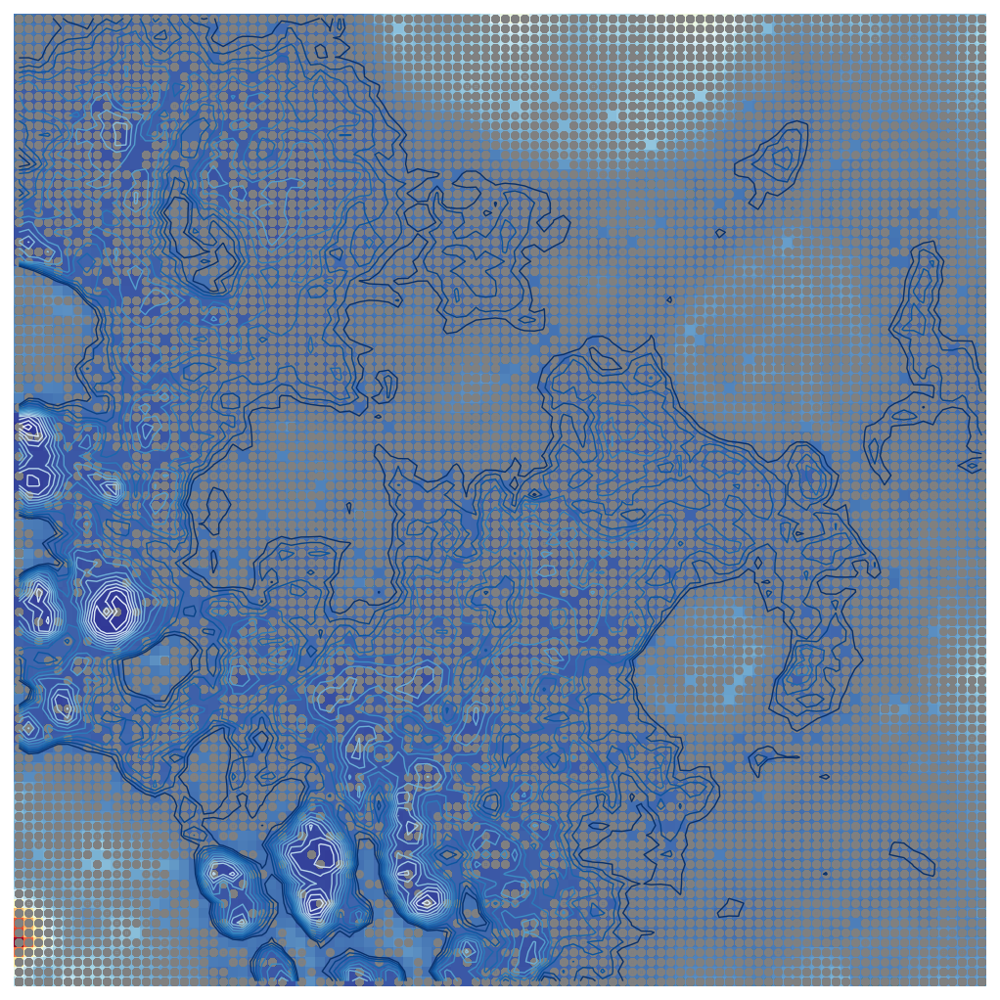

array([[0.16226758, 0.15463925, 0.13985134, ..., 0.31752496, 0.35447073,
        0.3643755 ],
       [0.17332971, 0.15995236, 0.15286863, ..., 0.28974569, 0.32885237,
        0.39089957],
       [0.16375879, 0.160654  , 0.15636805, ..., 0.31869168, 0.35969247,
        0.40543509],
       ...,
       [0.7414318 , 0.54638066, 0.45403362, ..., 0.23196537, 0.23709365,
        0.24043779],
       [0.57082703, 0.45474748, 0.33102833, ..., 0.23191319, 0.22593804,
        0.23916374],
       [0.43899994, 0.43481491, 0.3471279 , ..., 0.24785035, 0.23940967,
        0.24344737]])

In [327]:
u = sompy.umatrix.UMatrixView(12, 12, 'umatrix', show_axis=True, text_size=8, show_text=True)

UMAT = u.show(
    sm, 
    distance2=1, 
    row_normalized=False, 
    show_data=True, 
    contooor=True, # Visualize isomorphic curves
    blob=False
)

UMAT[1]

In [328]:
# Obtaining the R² scores for each cluster solution on demographic variables
smdata_gift=pd.DataFrame(sm.get_node_vectors())
r2_scores = {}
r2_scores['kmeans'] = get_r2_scores(smdata_gift, kmeans)

for linkage in ['complete', 'average', 'single', 'ward']:
    r2_scores[linkage] = get_r2_scores(
       smdata_gift, hierarchical.set_params(linkage=linkage)
    )

pd.DataFrame(r2_scores)

,kmeans,complete,average,single,ward
2,0.315745,0.077711,0.001926,0.001926,0.237151
3,0.415980,0.248886,0.109387,0.003270,0.352889
4,0.499741,0.324563,0.190020,0.004724,0.432949
5,0.569683,0.329544,0.286149,0.005854,0.506959
6,0.621957,0.478403,0.293176,0.008642,0.556816
7,0.656213,0.486246,0.299899,0.009736,0.599923
8,0.690112,0.495521,0.308076,0.009743,0.634900
9,0.714004,0.511830,0.501310,0.010670,0.669217


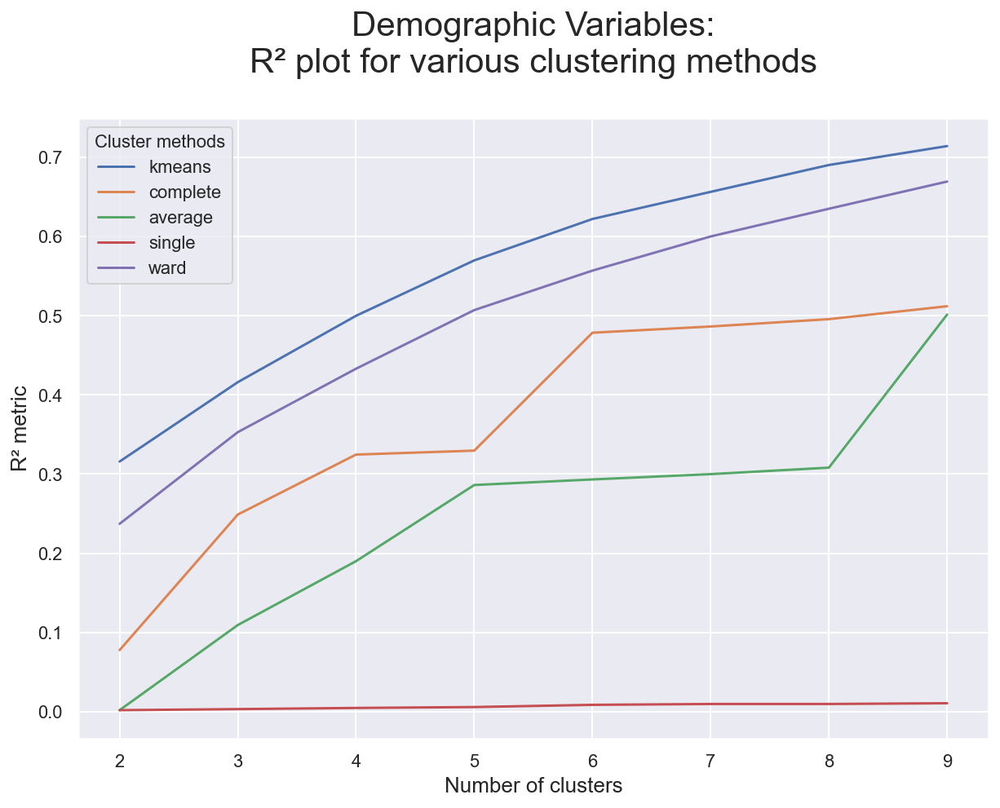

In [329]:
pd.DataFrame(r2_scores).plot.line(figsize=(10,7))

plt.title("Demographic Variables:\nR² plot for various clustering methods\n", fontsize=21)
plt.legend(title="Cluster methods", title_fontsize=11)
plt.xlabel("Number of clusters", fontsize=13)
plt.ylabel("R² metric", fontsize=13)
plt.show()

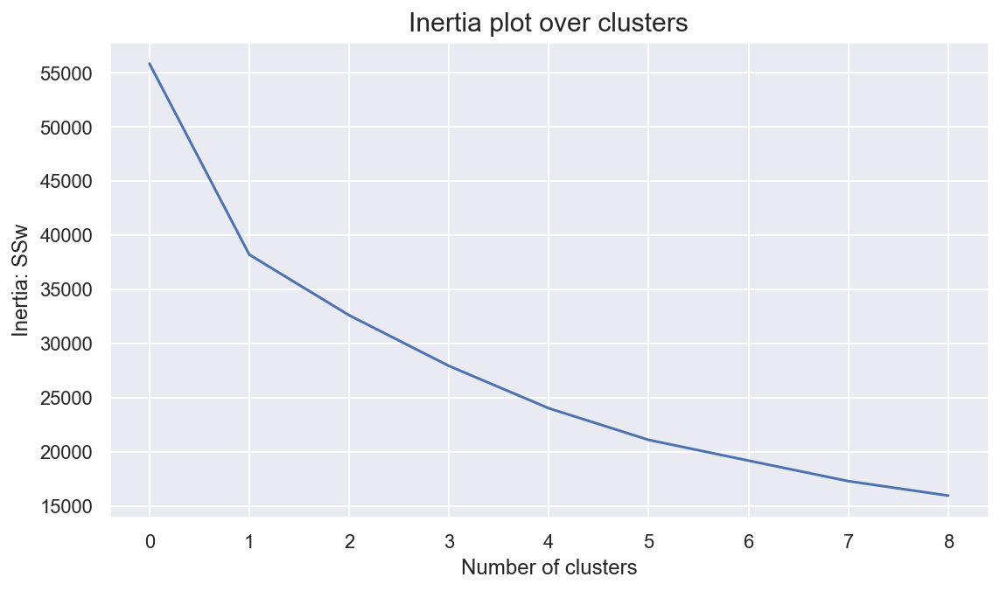

In [330]:
range_clusters = range(1, 10)
inertia = []
for n_clus in range_clusters:  # iterate over desired ncluster range
    kmclust = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
    kmclust.fit(smdata_gift)
    inertia.append(kmclust.inertia_)
# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(inertia)
plt.ylabel("Inertia: SSw")
plt.xlabel("Number of clusters")
plt.title("Inertia plot over clusters", size=15)
plt.show()

For n_clusters = k, the average silhouette_score is : 0.25865511756080384


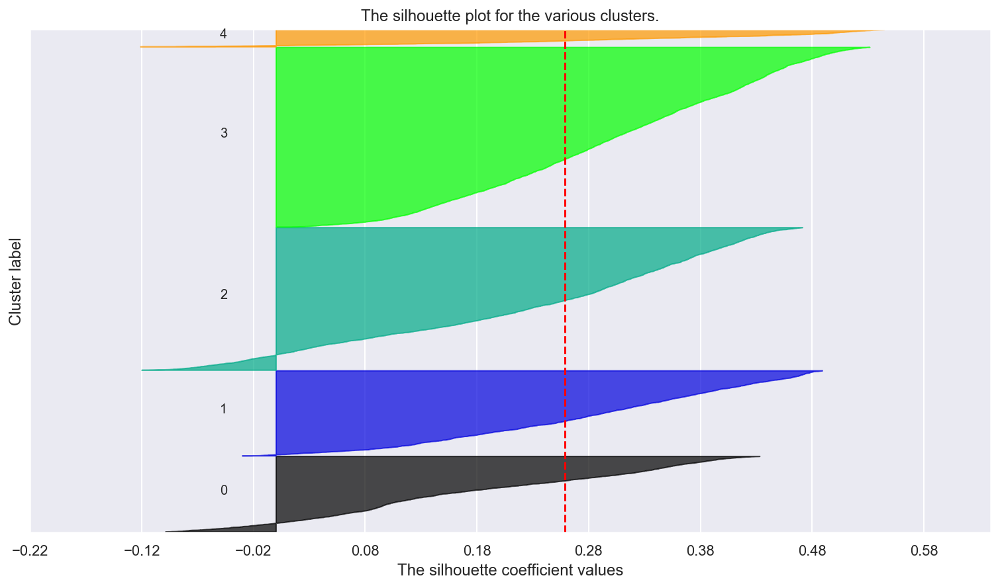

In [331]:
avg_silhouette_plot(smdata_gift,5)

For n_clusters = k, the average silhouette_score is : 0.23227408262259852


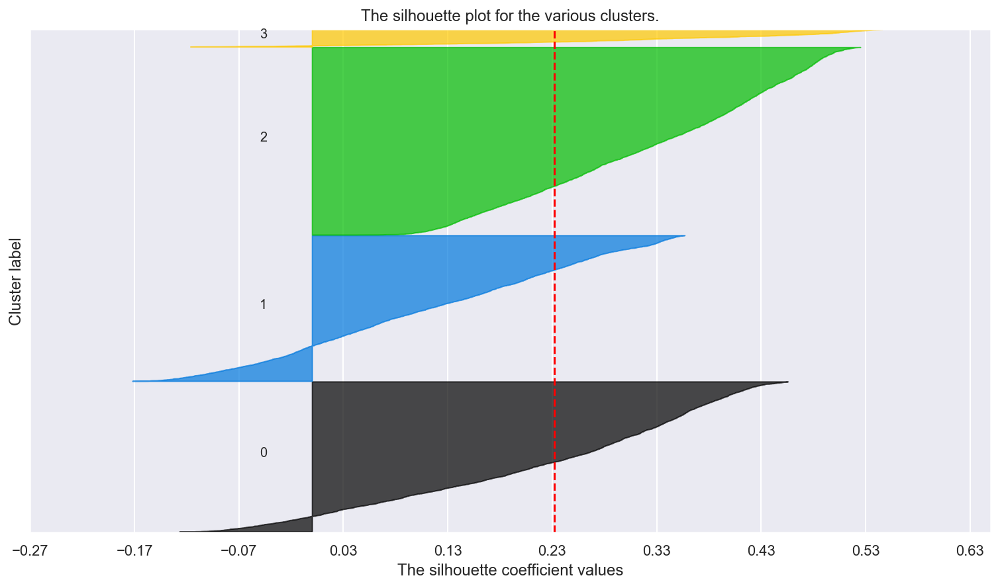

In [332]:
avg_silhouette_plot(smdata_gift,4)

For n_clusters = k, the average silhouette_score is : 0.3088374657931019


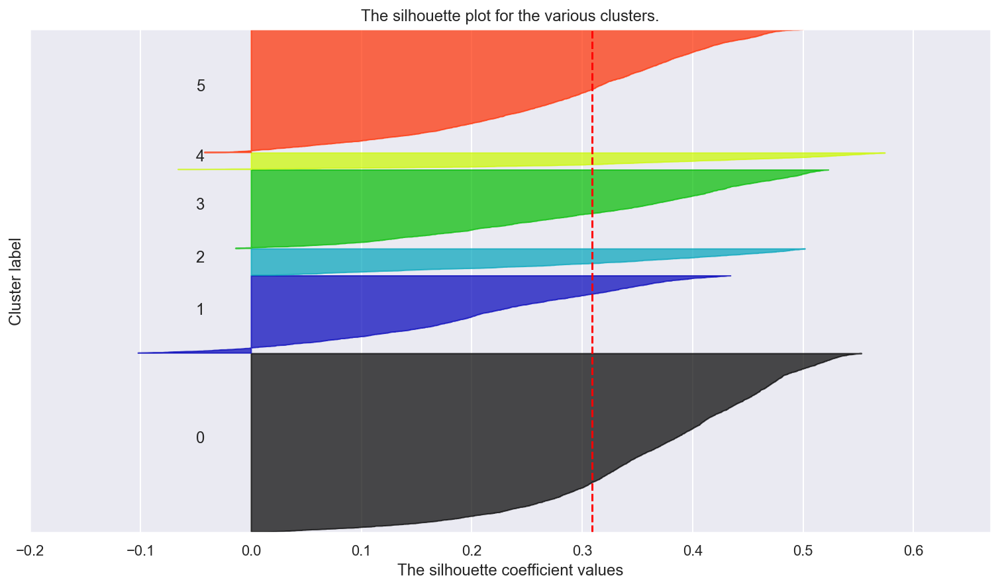

In [374]:
avg_silhouette_plot(smdata_gift,6)

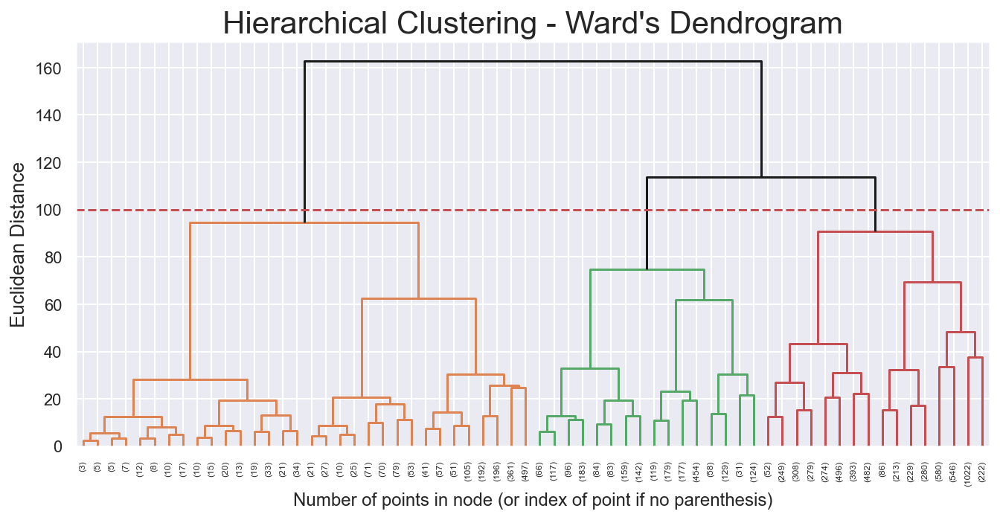

In [333]:
#performs hierarchical clustering on neuron weights and plots a dendogram
linkage = 'ward'
distance = 'euclidean'
hclust = AgglomerativeClustering(linkage=linkage, affinity=distance, distance_threshold=0, n_clusters=None)
hclust.fit_predict(smdata_gift)
# create the counts of samples under each node (number of points being merged)
counts = np.zeros(hclust.children_.shape[0])
n_samples = len(hclust.labels_)

# hclust.children_ contains the observation ids that are being merged together
# At the i-th iteration, children[i][0] and children[i][1] are merged to form node n_samples + i
for i, merge in enumerate(hclust.children_):
    # track the number of observations in the current cluster being formed
    current_count = 0
    for child_idx in merge:
        if child_idx < n_samples:
            # If this is True, then we are merging an observation
            current_count += 1  # leaf node
        else:
            # Otherwise, we are merging a previously formed cluster
            current_count += counts[child_idx - n_samples]
    counts[i] = current_count

# the hclust.children_ is used to indicate the two points/clusters being merged (dendrogram's u-joins)
# the hclust.distances_ indicates the distance between the two points/clusters (height of the u-joins)
# the counts indicate the number of points being merged (dendrogram's x-axis)
linkage_matrix = np.column_stack(
    [hclust.children_, hclust.distances_, counts]
).astype(float)

# Plot the corresponding dendrogram
sns.set()
fig = plt.figure(figsize=(11,5))
# The Dendrogram parameters need to be tuned
y_threshold = 100
dendrogram(linkage_matrix, truncate_mode='level', p=5, color_threshold=y_threshold, above_threshold_color='k')
plt.hlines(y_threshold, 0, 1000, colors="r", linestyles="dashed")
plt.title(f'Hierarchical Clustering - {linkage.title()}\'s Dendrogram', fontsize=21)
plt.xlabel('Number of points in node (or index of point if no parenthesis)')
plt.ylabel(f'{distance.title()} Distance', fontsize=13)
plt.show()

For n_clusters = k, the average silhouette_score is : 0.23227408262259852


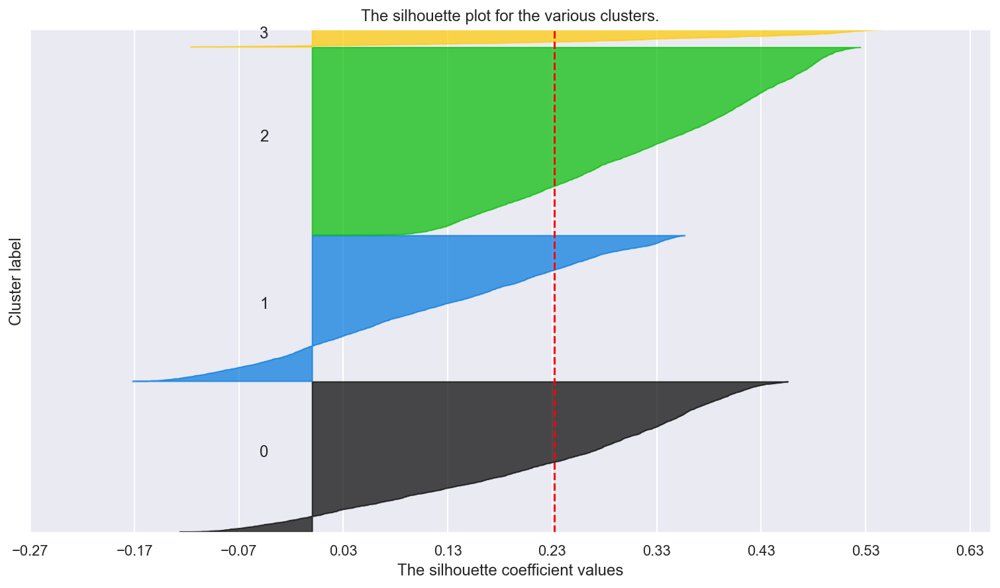

In [334]:
avg_silhouette_plot_ward(smdata_gift,4)

For n_clusters = k, the average silhouette_score is : 0.25865511756080384


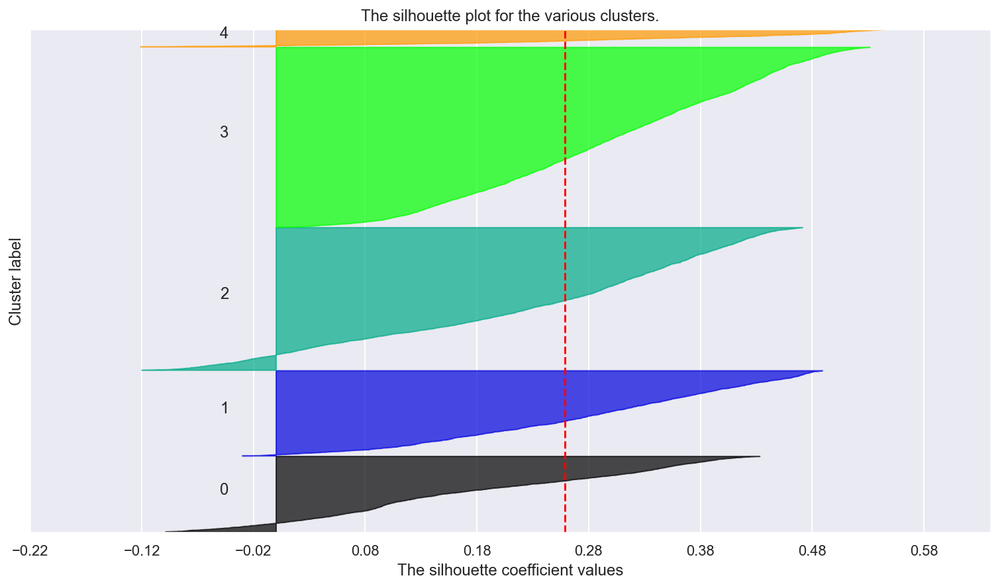

In [335]:
avg_silhouette_plot_ward(smdata_gift,5)

For n_clusters = k, the average silhouette_score is : 0.2991388860928053


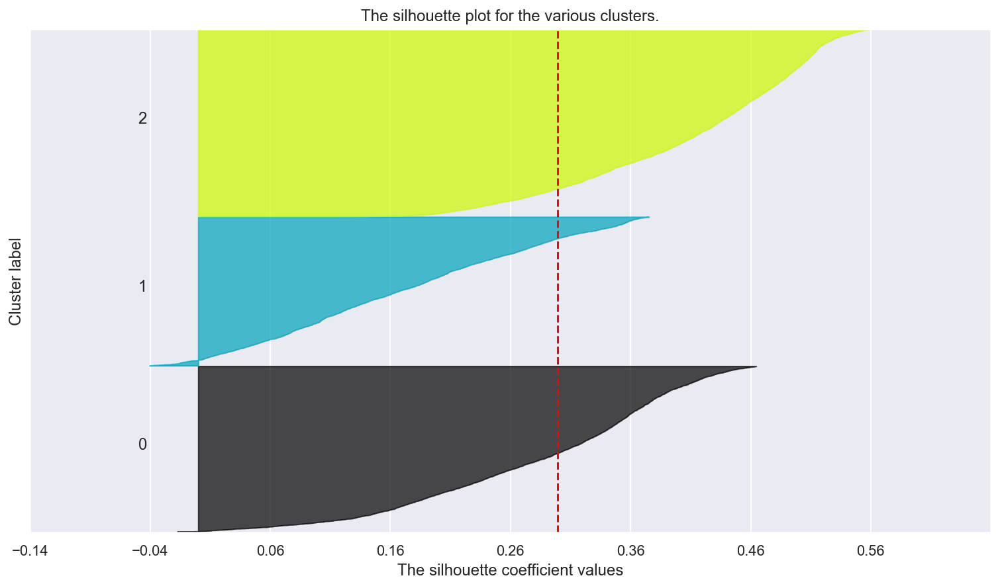

In [393]:
avg_silhouette_plot_ward(smdata_gift,3)

In [370]:
giftsm_kmeans = KMeans(n_clusters=4, init='k-means++', n_init=50, random_state=42)
giftsm_nodeclus_labels = sm.cluster(giftsm_kmeans)

In [371]:
# Check the nodes and and respective clusters
#smdata_gift.columns=gift_features
df_gift_nodes = smdata_gift
df_gift_nodes['label'] = giftsm_nodeclus_labels

bmus_map = sm.find_bmu(data_gift[gift_features])[0]  # get bmus for each observation in df

gift_bmus = pd.DataFrame(
    np.concatenate((data_gift, np.expand_dims(bmus_map,1)), axis=1),
    index=data_gift.index, columns=np.append(data_gift.columns,"BMU")
)

gift_SOM_final = gift_bmus.merge(df_gift_nodes['label'], 'left', left_on="BMU", right_index=True)
gift_SOM_final

,NOCARDGIFT,CARDGIFT,LASTDATE,LASTGIFT,ODATEDW,NUMPRM12,AVGGIFT,BMU,label
0,2.969591,2.007903,-0.113045,-0.732245,0.740353,0.482911,-0.743321,588.0,2
1,2.038118,2.007903,-0.113045,-1.297622,0.451134,0.482911,-0.781540,787.0,2
2,1.106644,0.448065,-0.113045,-0.732245,1.318793,0.482911,-0.879707,1776.0,2
3,5.764013,0.670899,-0.516513,-0.166869,1.608012,3.820667,-0.872023,69.0,3
4,-0.756304,-0.443271,2.307759,-0.166869,-0.705745,-0.123954,-0.008431,9159.0,1
...,...,...,...,...,...,...,...,...,...
80956,-0.523436,0.670899,0.693890,-0.958396,-0.705745,-0.123954,-1.013608,2.0,0
80957,-0.756304,-0.666104,1.500825,0.963885,-0.127305,0.179479,2.033716,9718.0,1
80958,1.805249,1.562235,-0.919980,-1.636848,0.451134,-0.123954,-1.384130,2262.0,2
80959,-0.756304,-1.111772,-0.919980,0.963885,-1.284184,-0.123954,1.789148,7105.0,1


In [372]:
sst = get_ss(gift_SOM_final[gift_features])  # get total sum of squares
ssw_labels = gift_SOM_final[gift_features + ["label"]].groupby(by='label').apply(get_ss)  # compute ssw for each cluster labels
ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
r2 = ssb / sst
r2

0.4397572104854081

### K- Means

__K-means__ was the clustring algorithm with best R2 score.

In [219]:
def get_ss(df):
    """Computes the sum of squares for all variables given a dataset
    """
    ss = np.sum(df.var() * (df.count() - 1))
    return ss  # return sum of sum of squares of each df variable

def r2(df, labels):
    sst = get_ss(df)
    ssw = np.sum(df.groupby(labels).apply(get_ss))
    return 1 - ssw/sst
    
def get_r2_scores(df, clusterer, min_k=2, max_k=10):
    """
    Loop over different values of k. To be used with sklearn clusterers.
    """
    r2_clust = {}
    for n in range(min_k, max_k):
        clust = clone(clusterer).set_params(n_clusters=n)
        labels = clust.fit_predict(df)
        r2_clust[n] = r2(df, labels)
    return r2_clust


# Set up the clusterers
kmeans = KMeans(
    init='k-means++',
    n_init=20,
    random_state=42
)

hierarchical = AgglomerativeClustering(
    affinity='euclidean'
)

In [220]:
# Set up the clusterers
kmeans = KMeans(init='k-means++', n_init=50, random_state=42)
r2_scores = {}
r2_scores['kmeans'] = get_r2_scores(data_gift, kmeans)

pd.DataFrame(r2_scores)

,kmeans
2,0.277628
3,0.376985
4,0.447573
5,0.512556
6,0.560108
7,0.597520
8,0.626467
9,0.650164


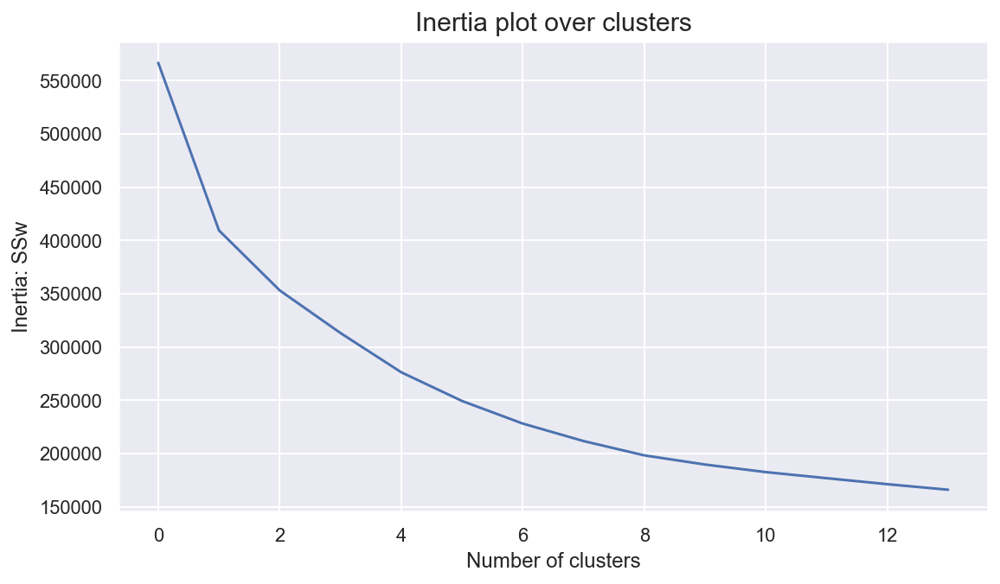

In [221]:
range_clusters = range(1, 15)
inertia = []
for n_clus in range_clusters:  # iterate over desired ncluster range
    kmclust = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
    kmclust.fit(data_gift)
    inertia.append(kmclust.inertia_)
# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(inertia)
plt.ylabel("Inertia: SSw")
plt.xlabel("Number of clusters")
plt.title("Inertia plot over clusters", size=15)
plt.show()

For n_clusters = k, the average silhouette_score is : 0.2142962530245203


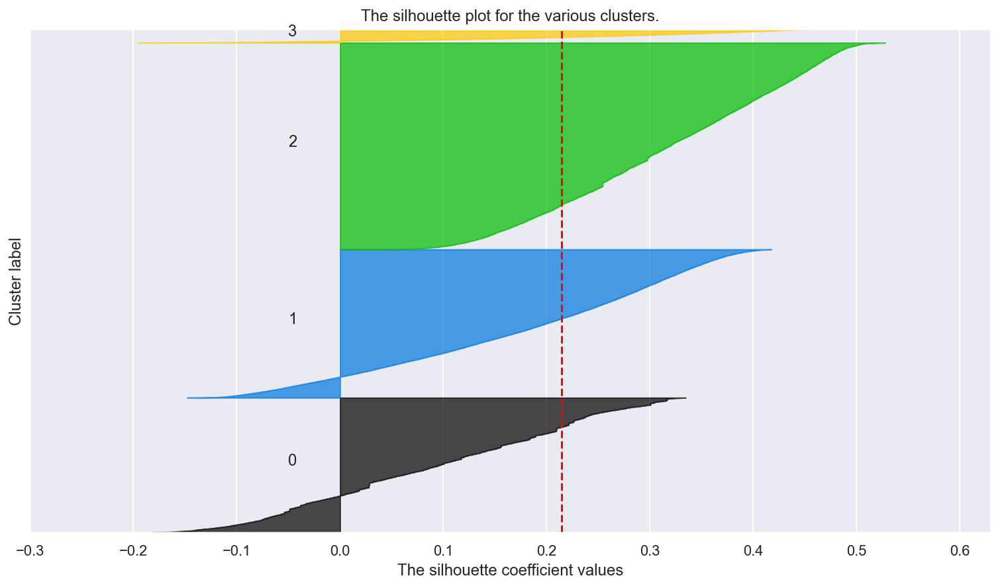

In [222]:
avg_silhouette_plot(data_gift,4)

For n_clusters = k, the average silhouette_score is : 0.2295061312227301


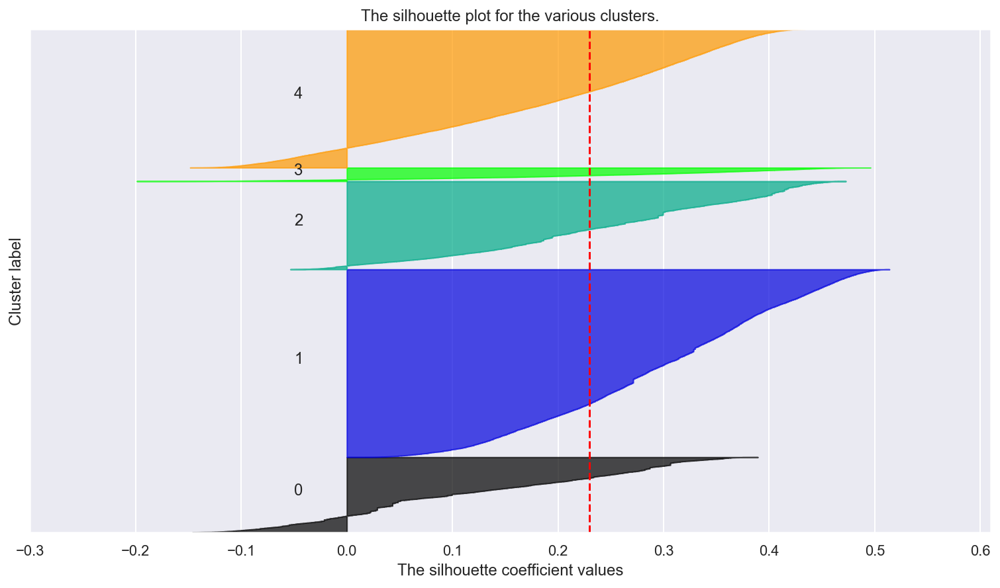

In [223]:
avg_silhouette_plot(data_gift,5)

For n_clusters = k, the average silhouette_score is : 0.2196811584403811


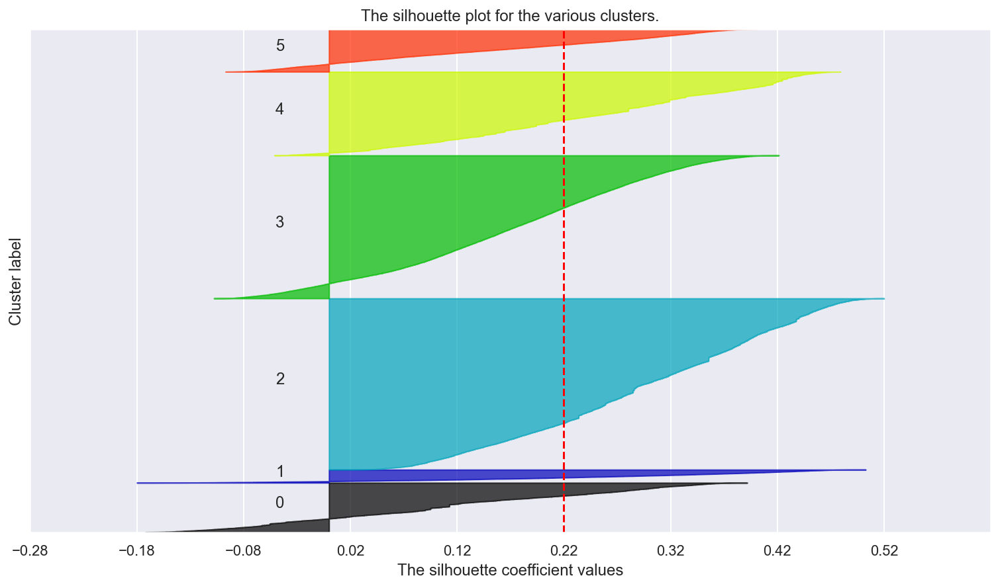

In [373]:
avg_silhouette_plot(data_gift,6)

In [224]:
# after slecting the number of clusters, apply k-means to the gift data

km_gift = KMeans(n_clusters=4, init='k-means++', n_init=50, random_state=42)
km_gift.fit(data_gift)

gift_labels=km_gift.predict(data_gift)

df_concat_gift = pd.concat((data_gift, pd.Series(gift_labels, name='gift_labels', index= data_gift.index)), axis=1)

In [225]:
sst = get_ss(df_concat_gift[gift_features])  # get total sum of squares

ssw_labels = df_concat_gift[gift_features + ["gift_labels"]].groupby(by='gift_labels').apply(get_ss)  # compute ssw for each cluster labels

ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB

r2 = ssb / sst

r2

0.4475729954403324

### DBSCAN

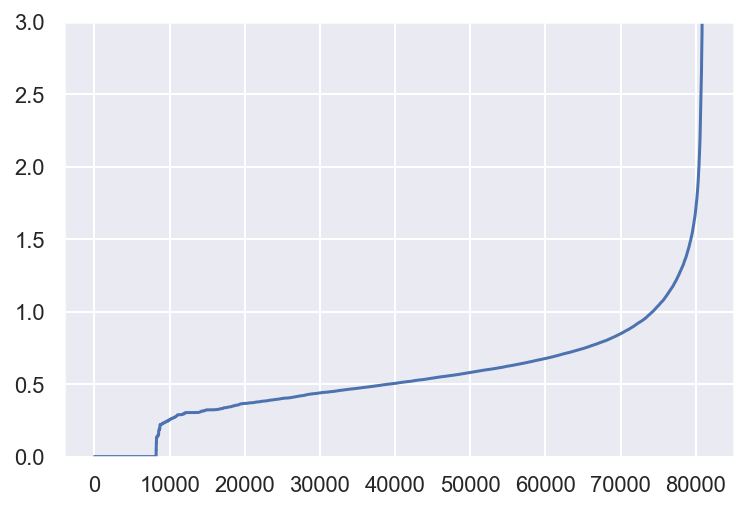

In [337]:
# K-distance graph to find out the right eps value
neigh = NearestNeighbors(n_neighbors=20)
neigh.fit(data_gift)
distances, _ = neigh.kneighbors(data_gift)
distances = np.sort(distances[:, -1])
plt.ylim(top=3) 
plt.plot(distances)
plt.show()

In [338]:
# Perform DBSCAN clustering
dbscan = DBSCAN(eps=1.1, min_samples=20, n_jobs=4)
dbscan_labels = dbscan.fit_predict(data_gift)

dbscan_n_clusters = len(np.unique(dbscan_labels))
print("Number of estimated clusters : %d" % dbscan_n_clusters)

Number of estimated clusters : 3


In [339]:
# Concatenating the labels to df
data_concat = pd.concat([data_gift, pd.Series(dbscan_labels, index=data.index, name="dbscan_labels")], axis=1)

# Detecting noise (potential outliers)
data_concat.loc[data_concat['dbscan_labels'] == -1]

,NOCARDGIFT,CARDGIFT,LASTDATE,LASTGIFT,ODATEDW,NUMPRM12,AVGGIFT,dbscan_labels
3,5.764013,0.670899,-0.516513,-0.166869,1.608012,3.820667,-0.872023,-1
30,-0.756304,2.676404,1.500825,1.190035,1.608012,0.179479,0.492934,-1
79,0.640907,1.785069,2.307759,-0.732245,1.029573,2.606937,-0.962249,-1
101,-0.989173,-0.666104,0.693890,2.660015,-1.284184,-2.247980,2.889706,-1
109,-0.057699,-1.111772,-1.726915,-0.166869,-0.705745,4.427531,1.569036,-1
...,...,...,...,...,...,...,...,...
80729,1.106644,0.225231,-0.113045,-0.166869,1.608012,3.820667,0.957615,-1
80750,4.832539,0.225231,-1.323448,-0.732245,-0.127305,8.068719,-0.563444,-1
80758,-0.523436,-0.888938,-0.113045,4.921521,-0.994964,0.179479,4.870712,-1
80778,1.572381,0.448065,-0.113045,9.444534,1.318793,0.786343,1.944041,-1


In [340]:
# Computing the R^2 of the cluster solution
data_nonoise = data_concat.loc[data_concat['dbscan_labels'] != -1]
sst = get_ss(data_gift)  # get total sum of squares
ssw_labels = data_nonoise.groupby(by='dbscan_labels').apply(get_ss)  # compute ssw for each cluster labels
ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
r2 = ssb / sst
print("Cluster solution with R^2 of %0.4f" % r2)

Cluster solution with R^2 of 0.1644


### Mean- Shift

In [341]:
# The following bandwidth can be automatically detected using (we need to set quantile though)
# Based on distance to nearest neighbors for all observations
bandwidth = estimate_bandwidth(data_gift, quantile=0.06, random_state=1, n_jobs=-1)
bandwidth

1.7422960312594313

In [342]:
# Perform mean-shift clustering with bandwidth set using estimate_bandwidth
ms = MeanShift(bandwidth=bandwidth, bin_seeding=True, n_jobs=4)
ms_labels = ms.fit_predict(data_gift)

In [343]:
ms_n_clusters = len(np.unique(ms_labels))
print("Number of estimated clusters : %d" % ms_n_clusters)

Number of estimated clusters : 134


In [344]:
# Concatenating the labels to df
databd_concat = pd.concat([data_gift, pd.Series(ms_labels, index=data.index, name="ms_labels")], axis=1)
databd_concat.head()

,NOCARDGIFT,CARDGIFT,LASTDATE,LASTGIFT,ODATEDW,NUMPRM12,AVGGIFT,ms_labels
0,2.969591,2.007903,-0.113045,-0.732245,0.740353,0.482911,-0.743321,3
1,2.038118,2.007903,-0.113045,-1.297622,0.451134,0.482911,-0.781540,3
2,1.106644,0.448065,-0.113045,-0.732245,1.318793,0.482911,-0.879707,0
3,5.764013,0.670899,-0.516513,-0.166869,1.608012,3.820667,-0.872023,62
4,-0.756304,-0.443271,2.307759,-0.166869,-0.705745,-0.123954,-0.008431,0


In [345]:
# Computing the R^2 of the cluster solution
sst = get_ss(data_gift)  # get total sum of squares
ssw_labels = databd_concat.groupby(by='ms_labels').apply(get_ss)  # compute ssw for each cluster labels
ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
r2 = ssb / sst
print("Cluster solution with R^2 of %0.4f" % r2)

Cluster solution with R^2 of 0.3824


### GMM 

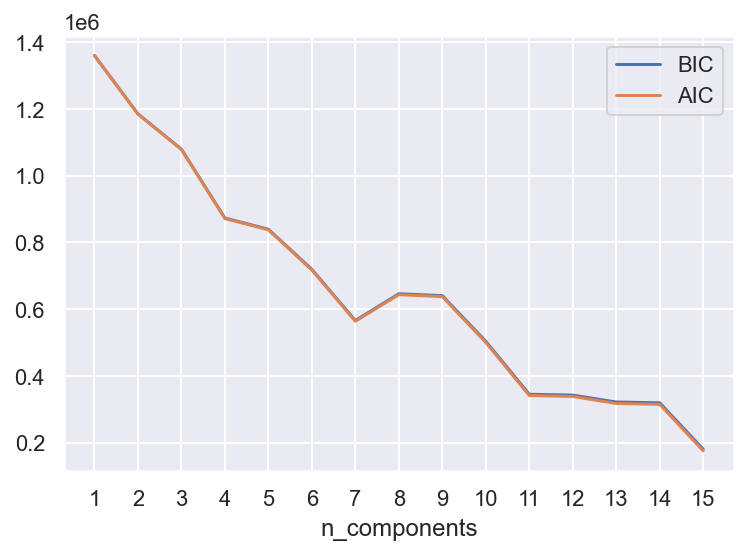

In [346]:
# Selecting number of components based on AIC and BIC
n_components = np.arange(1, 16)
models = [GaussianMixture(n, covariance_type='full', n_init=10, random_state=1).fit(data_gift)
          for n in n_components]

bic_values = [m.bic(data_gift) for m in models]
aic_values = [m.aic(data_gift) for m in models]
plt.plot(n_components, bic_values, label='BIC')
plt.plot(n_components, aic_values, label='AIC')
plt.legend(loc='best')
plt.xlabel('n_components')
plt.xticks(n_components)
plt.show()

In [347]:
# Performing GMM clustering
gmm = GaussianMixture(n_components=5, covariance_type='full', n_init=10, init_params='kmeans', random_state=1)
gmm_labels = gmm.fit_predict(data_gift)
labels_proba = gmm.predict_proba(data_gift)

In [348]:
# The estimated component weights
gmm.weights_

array([0.11877852, 0.35731518, 0.20801976, 0.21999609, 0.09589045])

In [349]:
gmm.covariances_.shape

(5, 7, 7)

In [350]:
# Concatenating the labels to df
df_concat = pd.concat([data_gift, pd.Series(gmm_labels, index=data_gift.index, name="gmm_labels")], axis=1)
# Computing the R^2 of the cluster solution
sst = get_ss(data_gift)  # get total sum of squares
ssw_labels = df_concat.groupby(by='gmm_labels').apply(get_ss)  # compute ssw for each cluster labels
ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
r2 = ssb / sst
print("Cluster solution with R^2 of %0.4f" % r2)

Cluster solution with R^2 of 0.3524


## Merging perspectives

Be clear which ones are `demo_labels` and `gift_labels`.

#### Using hierarchical clustering

In [226]:
data_not_standard.reset_index(inplace=True, drop=True)
df_concat_demo.reset_index(inplace=True, drop=True)
df_concat_gift.reset_index(inplace=True, drop=True)

data_label = pd.concat((data[demo_features+gift_features], df_concat_demo["demo_labels"], df_concat_gift["gift_labels"]), axis=1)

In [227]:
df_centroids = data_label.groupby(['demo_labels', 'gift_labels']).mean()

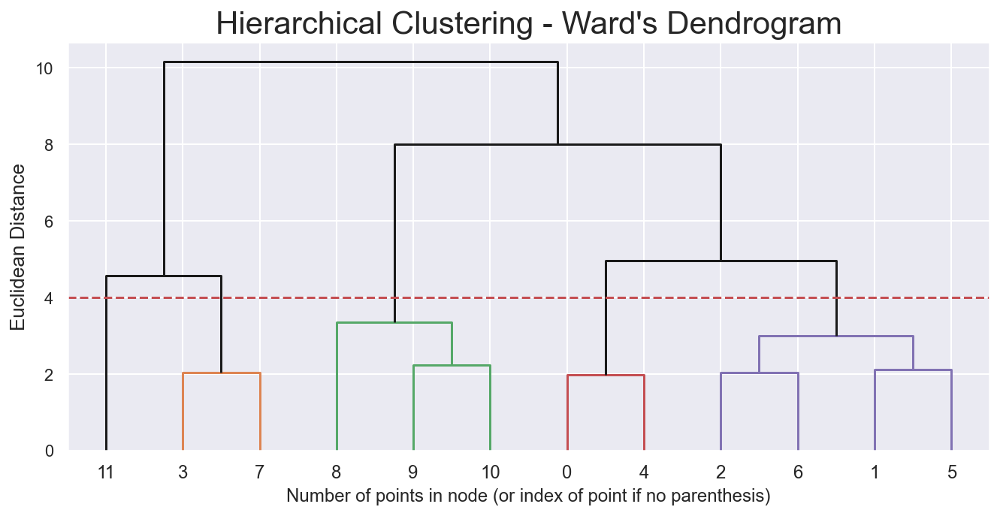

In [228]:
#performs hierarchical clustering on neuron weights and plots a dendogram
linkage = 'ward'
distance = 'euclidean'
hclust = AgglomerativeClustering(linkage=linkage, affinity=distance, distance_threshold=0, n_clusters=None)
hclust.fit_predict(df_centroids)
# create the counts of samples under each node (number of points being merged)
counts = np.zeros(hclust.children_.shape[0])
n_samples = len(hclust.labels_)

# hclust.children_ contains the observation ids that are being merged together
# At the i-th iteration, children[i][0] and children[i][1] are merged to form node n_samples + i
for i, merge in enumerate(hclust.children_):
    # track the number of observations in the current cluster being formed
    current_count = 0
    for child_idx in merge:
        if child_idx < n_samples:
            # If this is True, then we are merging an observation
            current_count += 1  # leaf node
        else:
            # Otherwise, we are merging a previously formed cluster
            current_count += counts[child_idx - n_samples]
    counts[i] = current_count

# the hclust.children_ is used to indicate the two points/clusters being merged (dendrogram's u-joins)
# the hclust.distances_ indicates the distance between the two points/clusters (height of the u-joins)
# the counts indicate the number of points being merged (dendrogram's x-axis)
linkage_matrix = np.column_stack(
    [hclust.children_, hclust.distances_, counts]
).astype(float)

# Plot the corresponding dendrogram
sns.set()
fig = plt.figure(figsize=(11,5))
# The Dendrogram parameters need to be tuned
y_threshold = 4
dendrogram(linkage_matrix, truncate_mode='level', p=5, color_threshold=y_threshold, above_threshold_color='k')
plt.hlines(y_threshold, 0, 1000, colors="r", linestyles="dashed")
plt.title(f'Hierarchical Clustering - {linkage.title()}\'s Dendrogram', fontsize=21)
plt.xlabel('Number of points in node (or index of point if no parenthesis)')
plt.ylabel(f'{distance.title()} Distance', fontsize=13)
plt.show()

In [229]:
# Re-running the Hierarchical clustering based on the correct number of clusters
hclust = AgglomerativeClustering(
    linkage='ward', 
    affinity='euclidean', 
    n_clusters=5
)
hclust_labels = hclust.fit_predict(df_centroids)
df_centroids['hclust_labels'] = hclust_labels

In [230]:
# Mapper between concatenated clusters and hierarchical clusters
cluster_mapper = df_centroids['hclust_labels'].to_dict()

data_ = data_label.copy()

# Mapping the hierarchical clusters on the centroids to the observations
data_['merged_labels'] = data_.apply(lambda row: cluster_mapper[(row['demo_labels'], row['gift_labels'])], axis=1)

# Merged cluster centroids
data_.groupby('merged_labels').mean()[demo_features+gift_features]

,IC5,EC1,IC1,MHUC1,AGE901,NOCARDGIFT,CARDGIFT,LASTDATE,LASTGIFT,ODATEDW,NUMPRM12,AVGGIFT
merged_labels,,,,,,,,,,,,
0,2.237339,1.651710,1.963446,1.920559,0.540469,-0.225666,-0.141895,0.064617,0.263611,-0.116404,-0.140859,0.298393
1,-0.211380,-0.150225,-0.168868,-0.172279,-0.102239,-0.437495,-0.520627,0.020828,0.174340,-0.521007,-0.160932,0.229581
2,-0.175455,-0.104172,-0.197973,-0.175044,0.069264,1.326256,0.574132,-0.585011,-0.117243,0.453708,4.425697,-0.012002
3,-0.251745,-0.201856,-0.254781,-0.234310,0.043690,0.921990,1.154983,-0.008683,-0.467828,1.159922,-0.038796,-0.614174
4,2.156920,1.653885,1.940996,1.837670,0.535082,1.068153,0.517125,-0.564862,0.285433,0.384605,4.312177,0.463362


## Cluster analysis

In [231]:
def cluster_profiles(df, label_columns, figsize, compar_titles=None):
    """
    Pass df with labels columns of one or multiple clustering labels. 
    Then specify this label columns to perform the cluster profile according to them.
    """
    if compar_titles == None:
        compar_titles = [""]*len(label_columns)
        
    sns.set()
    fig, axes = plt.subplots(nrows=len(label_columns), ncols=2, figsize=figsize, squeeze=False)
    for ax, label, titl in zip(axes, label_columns, compar_titles):
        # Filtering df
        drop_cols = [i for i in label_columns if i!=label]
        dfax = df.drop(drop_cols, axis=1)
        
        # Getting the cluster centroids and counts
        centroids = dfax.groupby(by=label, as_index=False).mean()
        counts = dfax.groupby(by=label, as_index=False).count().iloc[:,[0,1]]
        counts.columns = [label, "counts"]
        
        # Setting Data
        pd.plotting.parallel_coordinates(centroids, label, color=sns.color_palette(), ax=ax[0])
        sns.barplot(x=label, y="counts", data=counts, ax=ax[1])

        #Setting Layout
        handles, _ = ax[0].get_legend_handles_labels()
        cluster_labels = ["Cluster {}".format(i) for i in range(len(handles))]
        ax[0].annotate(text=titl, xy=(0.95,1.1), xycoords='axes fraction', fontsize=13, fontweight = 'heavy') 
        ax[0].legend(handles, cluster_labels) # Adaptable to number of clusters
        ax[0].axhline(color="black", linestyle="--")
        ax[0].set_title("Cluster Means - {} Clusters".format(len(handles)), fontsize=13)
        ax[0].set_xticklabels(ax[0].get_xticklabels(), rotation=-20)
        ax[1].set_xticklabels(cluster_labels)
        ax[1].set_xlabel("")
        ax[1].set_ylabel("Absolute Frequency")
        ax[1].set_title("Cluster Sizes - {} Clusters".format(len(handles)), fontsize=13)
    
    plt.subplots_adjust(hspace=0.4, top=0.90)
    plt.suptitle("Cluster Simple Profilling", fontsize=23)
    plt.show()

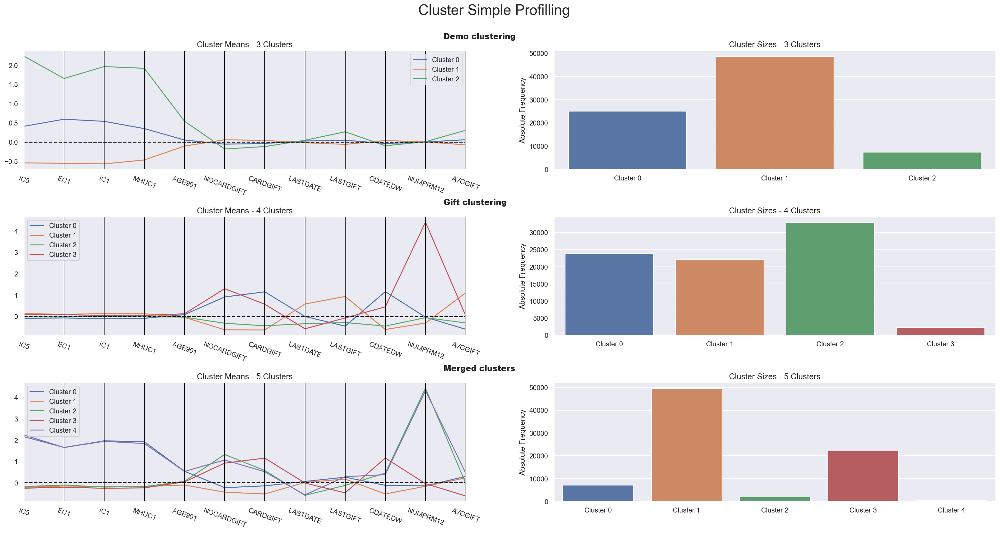

In [232]:
# Profilling each cluster (product, behavior, merged)
cluster_profiles(
    data_, 
    label_columns = ['demo_labels', 'gift_labels', 'merged_labels'], 
    figsize = (28, 13), 
    compar_titles = ["Demo clustering", "Gift clustering", "Merged clusters"]
)

## Cluster visualization using t-SNE

In [233]:
# RICARDO, compara com o tsne usando as metric features

In [234]:
# This is step can be quite time consuming
two_dim = TSNE(random_state=42).fit_transform(data[demo_features+gift_features])

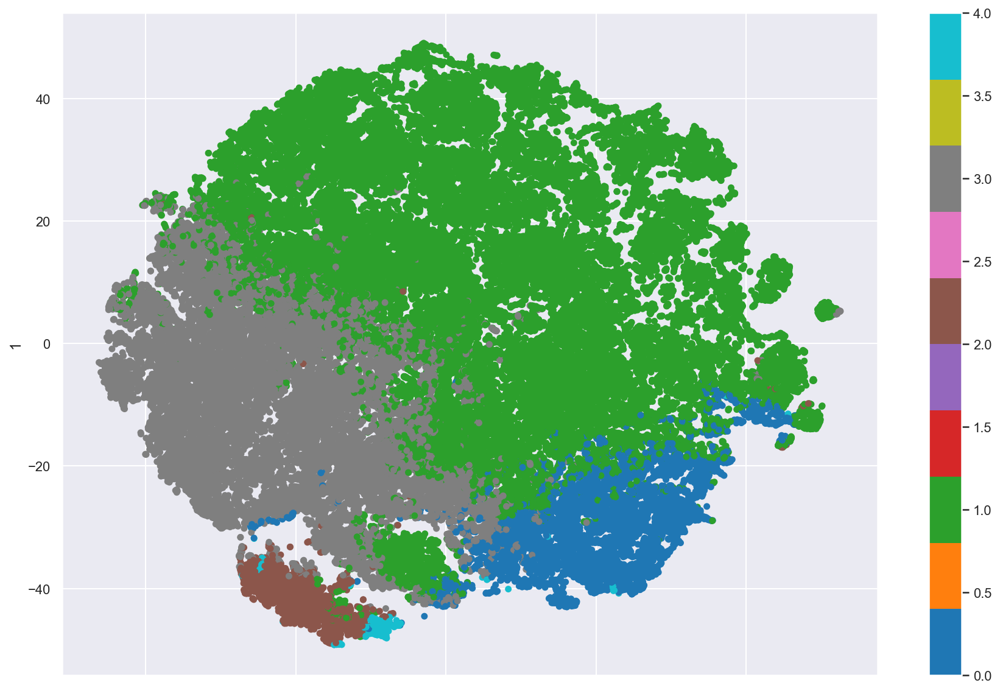

In [235]:
# t-SNE visualization
pd.DataFrame(two_dim).plot.scatter(x=0, y=1, c=data_['merged_labels'], colormap='tab10', figsize=(15,10))
plt.show()

## Reclassify outliers

#### Using decision tree

In [236]:
# Preparing the data
X = data_.drop(columns=['demo_labels','gift_labels','merged_labels'])
y = data_.merged_labels

# Splitting the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Fitting the decision tree
tree = DecisionTreeClassifier(random_state=42, max_depth=3)
tree.fit(X_train, y_train)
print("It is estimated that in average, we are able to predict {0:.2f}% of the customers correctly".format(tree.score(X_test, y_test)*100))

It is estimated that in average, we are able to predict 89.27% of the customers correctly


In [237]:
# Assessing feature importance
pd.Series(tree.feature_importances_, index=X_train.columns)

IC5           0.251080
EC1           0.000000
IC1           0.000000
MHUC1         0.026089
AGE901        0.000000
NOCARDGIFT    0.000000
CARDGIFT      0.577368
LASTDATE      0.000000
LASTGIFT      0.000000
ODATEDW       0.091993
NUMPRM12      0.053471
AVGGIFT       0.000000
dtype: float64

In [238]:
# Predicting the cluster labels of the outliers
data_out['merged_labels'] = tree.predict(data_out[demo_features+gift_features])

run ['dot.bat', '-Tsvg']


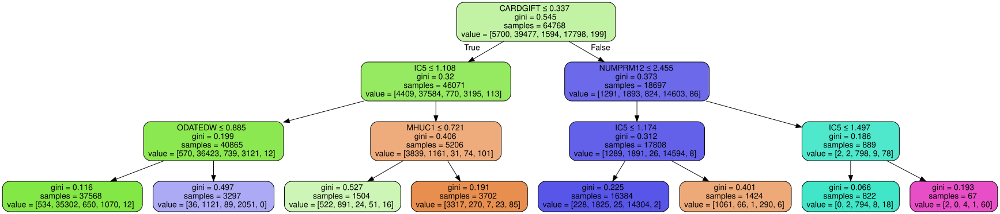

In [239]:
dot_data = export_graphviz(tree, out_file=None, 
                           feature_names=X.columns.to_list(),
                           filled=True,
                           rounded=True,
                           special_characters=True)  
graphviz.Source(dot_data)

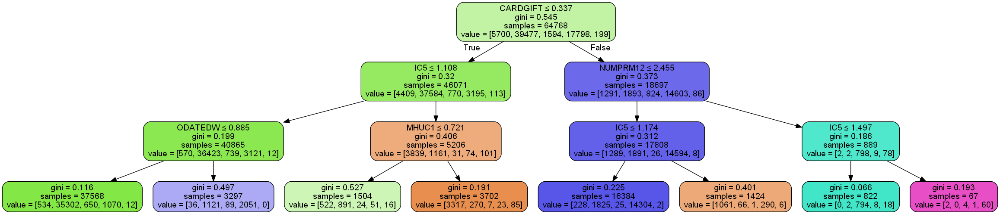

In [311]:
import pydotplus
from IPython.display import Image

graph=pydotplus.graph_from_dot_data(dot_data)
graph.write_pdf("tree.pdf")
pydot_graph.set_size('"8,5!"')
Image(graph.create_png()) 

# Cluster interpretation

In [240]:
data_merged = data_.drop(columns=['demo_labels','gift_labels'])

In [293]:
trial =data_not_standard.copy()
trial['merged_labels']=data_merged['merged_labels']
gb=trial.groupby('merged_labels')
nk = gb.size()
print(nk)

merged_labels
0     7090
1    49538
2     1985
3    22106
4      242
dtype: int64


In [294]:
m = trial.mean()
m
# TSS (total sum of squares)
TSS = trial.shape[0]*trial.var(ddof=0)
print(TSS)

HIT              3.282959e+06
AGE901           5.031181e+06
EC1              1.795706e+05
IC1              1.787331e+09
MHUC1            9.255707e+05
POP901           1.833451e+12
PCOWNERS         7.927088e+03
NUMPRM12         8.793305e+05
LASTDATE         4.973463e+05
LASTGIFT         6.331989e+06
ODATEDW          1.393743e+08
AVGGIFT          3.759863e+06
CARDGIFT         1.630472e+06
RFA_2F           9.492028e+04
IC5              4.433241e+12
Total_NK         6.174951e+06
Total_TK         1.167642e+06
Total_SK         2.239929e+02
Total_LL         3.225177e+06
Total_G1         3.616687e+06
Total_GK         7.588728e+06
Total_CC         6.679187e+06
Total_WL         4.402974e+06
Total_X1         4.778297e+06
Total_XK         7.937278e+06
Total_FS         3.712876e+06
NOCARDGIFT       1.492982e+06
AGE              1.736086e+07
merged_labels    8.007907e+04
dtype: float64


In [315]:
mk = gb['HIT', 'AGE901', 'EC1', 'IC1', 'MHUC1', 'POP901', 'NUMPRM12',
       'LASTDATE', 'LASTGIFT', 'ODATEDW', 'AVGGIFT', 'CARDGIFT', 'IC5',
       'NOCARDGIFT', 'AGE'].mean()
print(mk)

                    HIT     AGE901        EC1         IC1      MHUC1  \
merged_labels                                                          
0              3.688011  38.860649  15.301721  628.273625  14.557123   
1              2.733235  33.794118  12.618113  311.451350   7.480883   
2              3.886146  35.146096  12.686700  307.126952   7.471537   
3              3.554827  34.944495  12.541220  298.686330   7.271148   
4              4.417355  38.818182  15.304959  624.938017  14.276860   

                    POP901   NUMPRM12   LASTDATE   LASTGIFT     ODATEDW  \
merged_labels                                                             
0              2480.766996  11.944288  18.440339  18.807013   65.452327   
1              3156.264988  11.878134  18.331806  18.017536   48.664964   
2              3576.342569  26.993955  16.830227  15.438872   89.106801   
3              2932.404279  12.280648  18.258663  12.338414  118.408305   
4              2405.851240  26.619835  16.880

<ipython-input-315-7adfbddeee14>:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  mk = gb['HIT', 'AGE901', 'EC1', 'IC1', 'MHUC1', 'POP901', 'NUMPRM12',


In [313]:
data[metric].columns

Index(['HIT', 'AGE901', 'EC1', 'IC1', 'MHUC1', 'POP901', 'NUMPRM12',
       'LASTDATE', 'LASTGIFT', 'ODATEDW', 'AVGGIFT', 'CARDGIFT', 'IC5',
       'Total_NK', 'Total_TK', 'Total_SK', 'Total_LL', 'Total_G1', 'Total_GK',
       'Total_CC', 'Total_WL', 'Total_X1', 'Total_XK', 'Total_FS',
       'NOCARDGIFT', 'AGE'],
      dtype='object')

In [296]:
#square(difference between cond. means and overall mean)
EMk = (mk-m)**2
#weighted by the size of the groups
EM = EMk.multiply(nk,axis=0)
BSS = np.sum(EM,axis=0)
print(BSS)

AGE              7.594801e+05
AGE901           1.683993e+05
AVGGIFT          5.402484e+05
CARDGIFT         8.816489e+05
EC1              4.889500e+04
HIT              1.528213e+04
IC1              6.881215e+08
IC5              2.206281e+12
LASTDATE         4.971653e+03
LASTGIFT         5.383662e+05
MHUC1            3.396971e+05
NOCARDGIFT       5.975161e+05
NUMPRM12         4.869784e+05
ODATEDW          7.527997e+07
PCOWNERS         4.483472e+01
POP901           3.809896e+09
RFA_2F           3.107045e+03
Total_CC         1.031714e+04
Total_FS         3.509188e+04
Total_G1         3.321383e+03
Total_GK         4.861330e+04
Total_LL         1.550746e+04
Total_NK         2.801222e+04
Total_SK         1.970983e-02
Total_TK         1.072471e+04
Total_WL         4.656341e+03
Total_X1         2.132974e+03
Total_XK         1.466339e+04
merged_labels    0.000000e+00
dtype: float64


In [297]:
#square of the correlation ratio
#i.e. proportion of variance explained
# #for each variable
R2 = BSS/TSS
print(R2.sort_values(ascending=False))

NUMPRM12         0.553806
CARDGIFT         0.540732
ODATEDW          0.540128
IC5              0.497668
NOCARDGIFT       0.400217
IC1              0.385000
MHUC1            0.367014
EC1              0.272288
AVGGIFT          0.143688
LASTGIFT         0.085023
AGE              0.043747
AGE901           0.033471
RFA_2F           0.032733
LASTDATE         0.009996
Total_FS         0.009451
Total_TK         0.009185
Total_GK         0.006406
PCOWNERS         0.005656
Total_LL         0.004808
HIT              0.004655
Total_NK         0.004536
POP901           0.002078
Total_XK         0.001847
Total_CC         0.001545
Total_WL         0.001058
Total_G1         0.000918
Total_X1         0.000446
Total_SK         0.000088
merged_labels    0.000000
dtype: float64


In [281]:
trial =data_ohc2.copy()
trial['merged_labels']=data_merged['merged_labels']
gb=trial.groupby('merged_labels')
nk = gb.size()
print(nk)

merged_labels
0     7090
1    49538
2     1985
3    22106
4      242
dtype: int64


In [282]:
m = trial.mean()
m
# TSS (total sum of squares)
TSS = trial.shape[0]*trial.var(ddof=0)
print(TSS)


HIT              3.282959e+06
AGE901           5.031181e+06
EC1              1.795706e+05
IC1              1.787331e+09
MHUC1            9.255707e+05
                     ...     
SES_2            2.023403e+04
SES_3            1.183297e+04
SES_4            1.418245e+03
SES_unknown      1.533787e+03
merged_labels    8.007907e+04
Length: 109, dtype: float64


In [283]:
mk = gb.mean()
print(mk)

                    HIT     AGE901        EC1         IC1      MHUC1  \
merged_labels                                                          
0              3.688011  38.860649  15.301721  628.273625  14.557123   
1              2.733235  33.794118  12.618113  311.451350   7.480883   
2              3.886146  35.146096  12.686700  307.126952   7.471537   
3              3.554827  34.944495  12.541220  298.686330   7.271148   
4              4.417355  38.818182  15.304959  624.938017  14.276860   

                    POP901   NUMPRM12   LASTDATE   LASTGIFT     ODATEDW  ...  \
merged_labels                                                            ...   
0              2480.766996  11.944288  18.440339  18.807013   65.452327  ...   
1              3156.264988  11.878134  18.331806  18.017536   48.664964  ...   
2              3576.342569  26.993955  16.830227  15.438872   89.106801  ...   
3              2932.404279  12.280648  18.258663  12.338414  118.408305  ...   
4              

In [284]:
#square(difference between cond. means and overall mean)
EMk = (mk-m)**2
#weighted by the size of the groups
EM = EMk.multiply(nk,axis=0)
BSS = np.sum(EM,axis=0)
print(BSS)

AGE              759480.052977
AGE901           168399.305349
AVGGIFT          540248.355236
CARDGIFT         881648.922629
DOMAIN_C              4.322502
                     ...      
Total_TK          10724.708955
Total_WL           4656.340851
Total_X1           2132.974060
Total_XK          14663.387307
merged_labels         0.000000
Length: 109, dtype: float64


In [292]:
#square of the correlation ratio
#i.e. proportion of variance explained
# #for each variable
R2 = BSS/TSS
print(R2.sort_values(ascending=False).head(15))

NUMPRM12      0.553806
CARDGIFT      0.540732
ODATEDW       0.540128
IC5           0.497668
NOCARDGIFT    0.400217
IC1           0.385000
MHUC1         0.367014
EC1           0.272288
SES_1         0.180460
AVGGIFT       0.143688
LASTGIFT      0.085023
RFA_2A_E      0.083739
SES_2         0.077238
RFA_2A_F      0.060823
RFA_2A_D      0.053098
dtype: float64


Defining the function that returns the most profitable promotion

In [241]:
def best_promotion(cluster):
    cols = ['Total_NK', 'Total_TK', 'Total_SK', 'Total_LL', 'Total_G1', 'Total_GK','Total_CC', 'Total_WL', 'Total_X1', 'Total_XK', 'Total_FS']
    total = []
    for col in cols:
        total.append(cluster[col].sum())
    temp_ = pd.DataFrame({'Promotion':cols,'TOTAL':total})
    
    sns.barplot(x=temp_.Promotion, y=temp_.TOTAL, color='b')
    plt.xticks(rotation=90)
    plt.suptitle("Total amount per promotion")

In [242]:
def area_and_ses(cluster):
    sns.countplot(data=cluster, x="DOMAIN", hue="SES")
    plt.legend(bbox_to_anchor=(1, 1), loc=2)
    plt.suptitle("Area and Social Economic Status")

def gender_count(cluster):
    sns.countplot(data=cluster, x="GENDER")
    plt.suptitle("Gender")

def neighborhood_age(cluster):
    sns.boxplot(data=cluster1, x="AGE901", whis=[10, 90])
    plt.suptitle("80% of Neighborhood age")
    return str(cluster1["AGE901"].quantile(.10)), str(cluster1["AGE901"].quantile(.90))

def common_state(cluster):
    cluster.STATE.value_counts()[:3].plot(kind="bar")
    plt.suptitle("Top 3 States")

def other_donations(cluster):
    sns.displot(data=cluster, x="HIT")
    plt.suptitle("Non PVA mail offers")

def neighborhood_years_education(cluster):
    sns.displot(data=cluster, x="EC1")
    plt.suptitle("Neighborhood median education years")

def neighborhood_median_income(cluster):
    sns.displot(data=cluster, x="IC1")
    plt.suptitle("Neighborhood median income, in hundreds")

def neighborhood_home_ownership(cluster):
    sns.displot(data=cluster, x="MHUC1")
    plt.suptitle("Neighborhood median homeowner cost, in hundreds")

def neighborhood_population(cluster):
    sns.displot(data=cluster, x="POP901")
    plt.suptitle("Neighborhood population")

def pc_owners(cluster):
    sns.countplot(data=cluster, x="PCOWNERS")
    plt.suptitle("PC Ownership")

def num_promotions_received(cluster):
    sns.displot(data=cluster, x="NUMPRM12")
    plt.suptitle("Promotions received in the last 12 months")

def last_gift_date(cluster):
    sns.displot(data=cluster, x="LASTDATE")
    plt.suptitle("Months since last gift")

def donor_time(cluster):
    sns.boxplot(data=cluster, x="ODATEDW", whis=[10, 90])
    plt.suptitle("80% months since first donation")
    return str(cluster["ODATEDW"].quantile(.10)), str(cluster["ODATEDW"].quantile(.90))

def average_gift(cluster):
    sns.displot(data=cluster, x="AVGGIFT")
    plt.suptitle("80% average gift donation")
    return str(cluster["AVGGIFT"].quantile(.10)), str(cluster["AVGGIFT"].quantile(.90))

def donation_outside_promotion(cluster):
    sns.displot(data=cluster, x="NOCARDGIFT")
    plt.suptitle("80% donations made without promotion")
    return str(cluster["NOCARDGIFT"].quantile(.10)), str(cluster["NOCARDGIFT"].quantile(.90))

def donation_with_promotion(cluster):
    sns.displot(data=cluster, x="CARDGIFT")
    plt.suptitle("80% donations made through promotion")
    return str(cluster["CARDGIFT"].quantile(.10)), str(cluster["CARDGIFT"].quantile(.90))

def frequency(cluster):
    sns.countplot(data=cluster, x="RFA_2F")
    plt.suptitle("Frequency of gifts")

def amount(cluster):
    sns.countplot(data=cluster, x="RFA_2A")
    plt.suptitle("Amount of last gift")

def neighborhood_income(cluster):
    sns.displot(data=cluster1, x="IC5")
    plt.suptitle("80% neighborhood per capita income")
    return str(cluster["IC5"].quantile(.10)), str(cluster["IC5"].quantile(.90))

def donor_age(cluster):
    sns.displot(data=cluster1, x="AGE")
    plt.suptitle("80% donor's age")
    return str(cluster["AGE"].quantile(.10)), str(cluster["AGE"].quantile(.90))

In [243]:
demographic_descriptions = [common_state,
                           area_and_ses,
                           gender_count,
                           neighborhood_age,
                           other_donations,
                           neighborhood_years_education,
                           neighborhood_median_income,
                           neighborhood_home_ownership,
                           neighborhood_population,
                           pc_owners,
                           neighborhood_income,
                           donor_age]

gift_descriptions = [best_promotion,
                    num_promotions_received,
                    last_gift_date,
                    donor_time,
                    average_gift,
                    donation_outside_promotion,
                    donation_with_promotion,
                    frequency]

In [244]:
def demographic_description(cluster):
    # All Numeric Variables' Box Plots in one figure
    sns.set()

    # Prepare figure. Create individual axes where each box plot will be placed
    fig, axes = plt.subplots(nrows=3, ncols=4, figsize=(30, 15))
    
    # Plot data
    
    # First row
    sns.barplot(cluster.STATE.value_counts()[:3].index, cluster.STATE.value_counts()[:3].values, ax=axes[0][0]).set_title("Top 3 States")
    sns.countplot(data=cluster, x="DOMAIN", hue="SES", ax=axes[0][1]).set_title("Area and Social Economic Status")
    sns.countplot(data=cluster, x="GENDER", ax=axes[0][2]).set_title("Gender")
    sns.boxplot(data=cluster, x="AGE901", whis=[10, 90], ax=axes[0][3]).set_title("80% Neighborhood age")
    
    # Second row
    sns.histplot(data=cluster, x="HIT",ax=axes[1][0]).set_title("Non PVA mail offers")
    sns.histplot(data=cluster, x="EC1",ax=axes[1][1]).set_title("Neighborhood median education years")
    sns.histplot(data=cluster, x="IC1",ax=axes[1][2]).set_title("Neighborhood median income, in hundreds")
    sns.histplot(data=cluster, x="MHUC1",ax=axes[1][3]).set_title("Neighborhood median homeowner cost, in hundreds")
    
    # Third row
    sns.histplot(data=cluster, x="POP901",ax=axes[2][0]).set_title("Neighborhood population")
    sns.countplot(data=cluster, x="PCOWNERS",ax=axes[2][1]).set_title("PC Ownership")
    sns.histplot(data=cluster, x="IC5",ax=axes[2][2]).set_title("Neighborhood per capita income")
    sns.histplot(data=cluster, x="AGE",ax=axes[2][3]).set_title("Donor's age")
    
    # Layout
    fig.tight_layout()
    

    plt.show()
    
    # Adding the 10th and 90th quantiles to get a grip where most values are concentrated
    print("Neighborhood age:",str(cluster["AGE901"].quantile(.10)),"|",str(cluster["AGE901"].quantile(.90)))
    print("Neighborhood years of education:",str(cluster["EC1"].quantile(.10)),"|",str(cluster["EC1"].quantile(.90)))
    print("Neighborhood median income:",str(cluster["IC1"].quantile(.10)),"|",str(cluster["IC1"].quantile(.90)))
    print("Neighborhood population:",str(cluster["POP901"].quantile(.10)),"|",str(cluster["POP901"].quantile(.90)))
    print("Neighborhood per capita income:",str(cluster["IC5"].quantile(.10)),"|",str(cluster["IC5"].quantile(.90)))
    print("Donor age:",str(cluster["AGE"].quantile(.10)),"|",str(cluster["AGE"].quantile(.90)))

In [245]:
def gift_description(cluster):
    
    cols = ['Total_NK', 'Total_TK', 'Total_SK', 'Total_LL', 'Total_G1', 'Total_GK','Total_CC', 'Total_WL', 'Total_X1', 'Total_XK', 'Total_FS']
    total = []
    for col in cols:
        total.append(cluster[col].sum())
    temp_ = pd.DataFrame({'Promotion':cols,'TOTAL':total})
    
    # All Numeric Variables' Box Plots in one figure
    sns.set()
    
    # Prepare figure. Create individual axes where each box plot will be placed
    fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(30, 15))
    
    # Plot data
    
    # First row
    sns.barplot(x=temp_.Promotion, y=temp_.TOTAL, color='b',ax=axes[0][0]).set_title("Total amount per promotion")
    sns.histplot(data=cluster, x="NUMPRM12",ax=axes[0][1]).set_title("Promotions received in the last 12 months")
    sns.histplot(data=cluster, x="LASTDATE",ax=axes[0][2]).set_title("Months since last gift")
    
    # Second row
    sns.boxplot(data=cluster, x="ODATEDW", whis=[10, 90],ax=axes[1][0]).set_title("80% months since first donation")
    sns.histplot(data=cluster, x="AVGGIFT",ax=axes[1][1]).set_title("Average gift donation")
    sns.histplot(data=cluster, x="NOCARDGIFT",ax=axes[1][2]).set_title("Donations made without promotion")
    
    # Third row
    sns.histplot(data=cluster, x="CARDGIFT",ax=axes[2][0]).set_title("Donations made through promotion")
    sns.countplot(data=cluster, x="RFA_2F",ax=axes[2][1]).set_title("Frequency of donations")
    sns.countplot(data=cluster, x="RFA_2A",ax=axes[2][2]).set_title("Amount of last gift")
    
    # Layout
    fig.tight_layout()
    
    # Rotating x-axis labels
    for tick in axes[0,0].get_xticklabels():
        tick.set_rotation(90)
    
    plt.show()
    
    # Adding the 10th and 90th quantiles to get a grip where most values are concentrated
    print("Donor time:",str(cluster["ODATEDW"].quantile(.10)),"|",str(cluster["ODATEDW"].quantile(.90)))
    print("Average gift value:",str(cluster["AVGGIFT"].quantile(.10)),"|",str(cluster["AVGGIFT"].quantile(.90)))
    print("Donations without promotion:",str(cluster["NOCARDGIFT"].quantile(.10)),"|",str(cluster["NOCARDGIFT"].quantile(.90)))
    print("Donations with promotion:",str(cluster["CARDGIFT"].quantile(.10)),"|",str(cluster["CARDGIFT"].quantile(.90)))

In [246]:
data_not_standard.columns

Index(['STATE', 'DOMAIN', 'GENDER', 'HIT', 'AGE901', 'EC1', 'IC1', 'MHUC1',
       'POP901', 'PCOWNERS', 'NUMPRM12', 'LASTDATE', 'LASTGIFT', 'ODATEDW',
       'AVGGIFT', 'CARDGIFT', 'RFA_2F', 'RFA_2A', 'IC5', 'Total_NK',
       'Total_TK', 'Total_SK', 'Total_LL', 'Total_G1', 'Total_GK', 'Total_CC',
       'Total_WL', 'Total_X1', 'Total_XK', 'Total_FS', 'NOCARDGIFT', 'SES',
       'AGE'],
      dtype='object')

### Cluster 1

In [247]:
# getting indexes of cluster 1
cluster1_indexes = data_merged[data_merged['merged_labels']==0].drop(columns='merged_labels').index

# selecting observations of the original data in cluster 1
cluster1 = data_not_standard.iloc[cluster1_indexes]

C:\Users\joaof\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


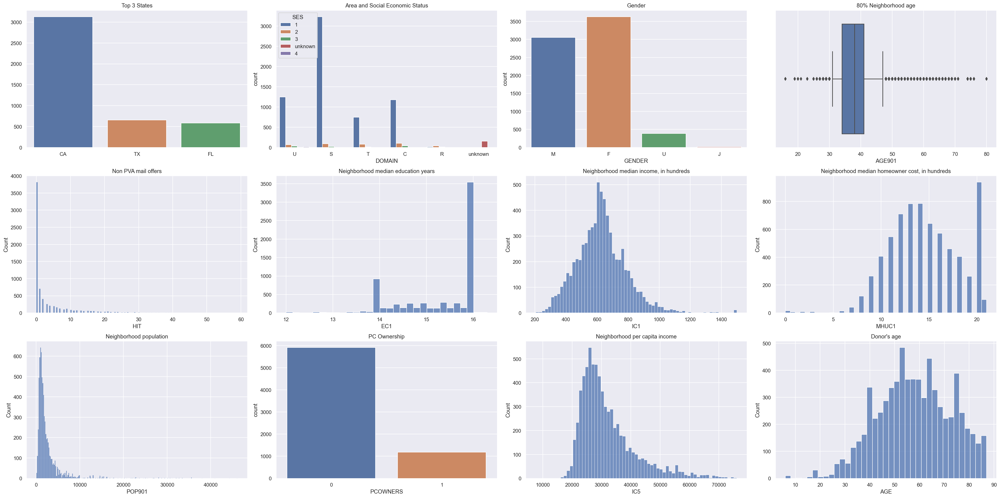

Neighborhood age: 31.0 | 47.0
Neighborhood years of education: 14.0 | 16.0
Neighborhood median income: 430.0 | 820.0
Neighborhood population: 703.0 | 4573.0
Neighborhood per capita income: 22940.4 | 45019.900000000016
Donor age: 39.0 | 78.0


In [248]:
demographic_description(cluster1)

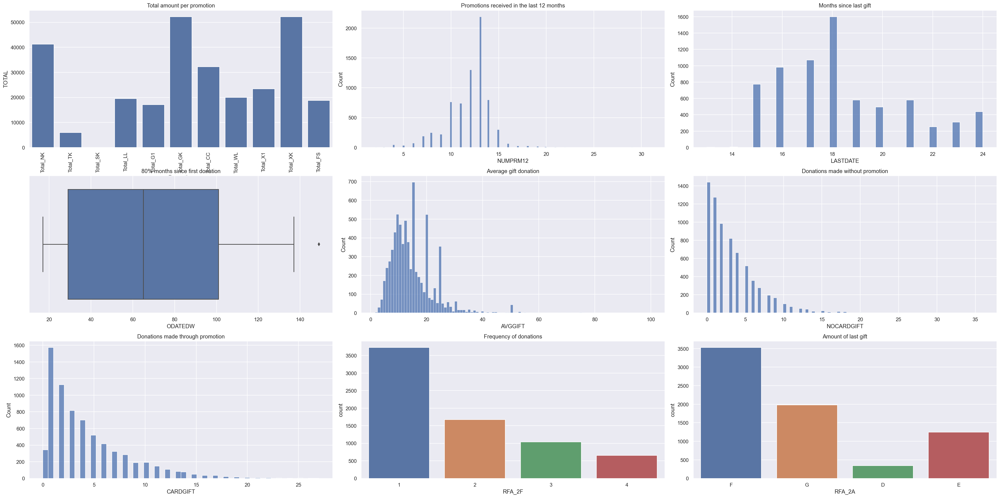

Donor time: 17.0 | 137.0
Average gift value: 7.0 | 25.0
Donations without promotion: 0.0 | 8.0
Donations with promotion: 1.0 | 10.0


In [249]:
gift_description(cluster1)

### Cluster 2

In [250]:
# getting indexes of cluster 2
cluster2_indexes = data_merged[data_merged['merged_labels']==1].drop(columns='merged_labels').index

# selecting observations of the original data in cluster 2
cluster2 = data_not_standard.iloc[cluster2_indexes]

C:\Users\joaof\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


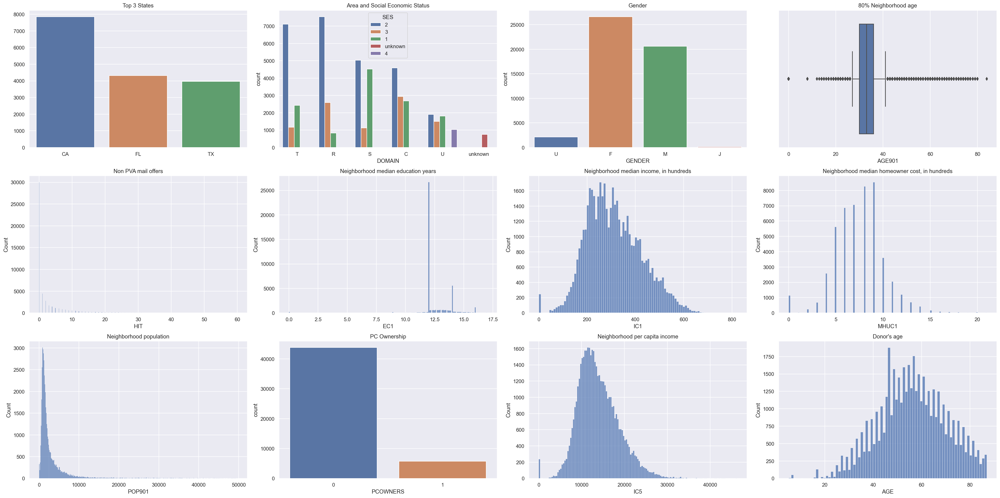

Neighborhood age: 27.0 | 41.0
Neighborhood years of education: 12.0 | 14.0
Neighborhood median income: 179.0 | 469.0
Neighborhood population: 708.0 | 6434.0
Neighborhood per capita income: 8651.0 | 20204.300000000003
Donor age: 37.0 | 75.0


In [251]:
demographic_description(cluster2)

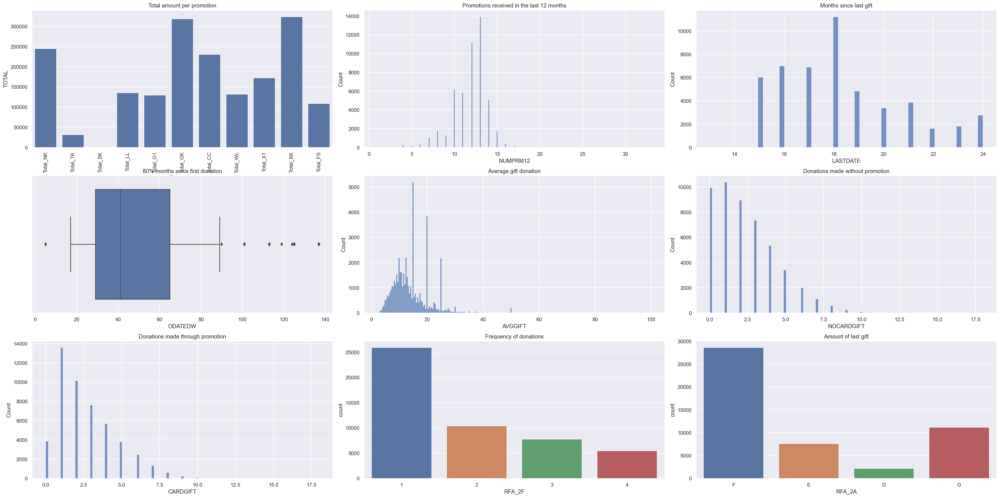

Donor time: 17.0 | 89.0
Average gift value: 7.333333333300001 | 23.0
Donations without promotion: 0.0 | 5.0
Donations with promotion: 1.0 | 5.0


In [252]:
gift_description(cluster2)

### Cluster 3

In [253]:
# getting indexes of cluster 3
cluster3_indexes = data_merged[data_merged['merged_labels']==2].drop(columns='merged_labels').index

# selecting observations of the original data in cluster 3
cluster3 = data_not_standard.iloc[cluster3_indexes]

C:\Users\joaof\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


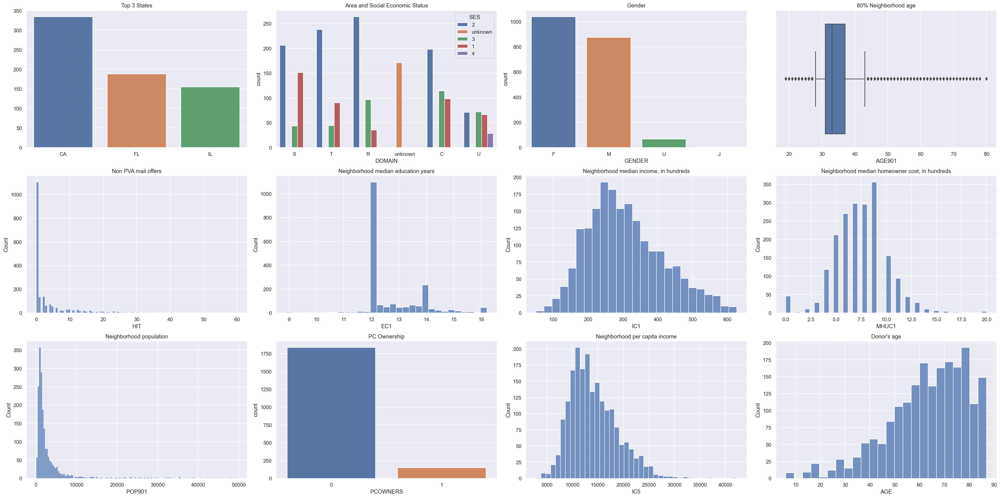

Neighborhood age: 28.0 | 43.0
Neighborhood years of education: 12.0 | 14.0
Neighborhood median income: 177.0 | 464.0
Neighborhood population: 694.0 | 6992.000000000002
Neighborhood per capita income: 8945.0 | 20674.4
Donor age: 41.0 | 82.0


In [254]:
demographic_description(cluster3)

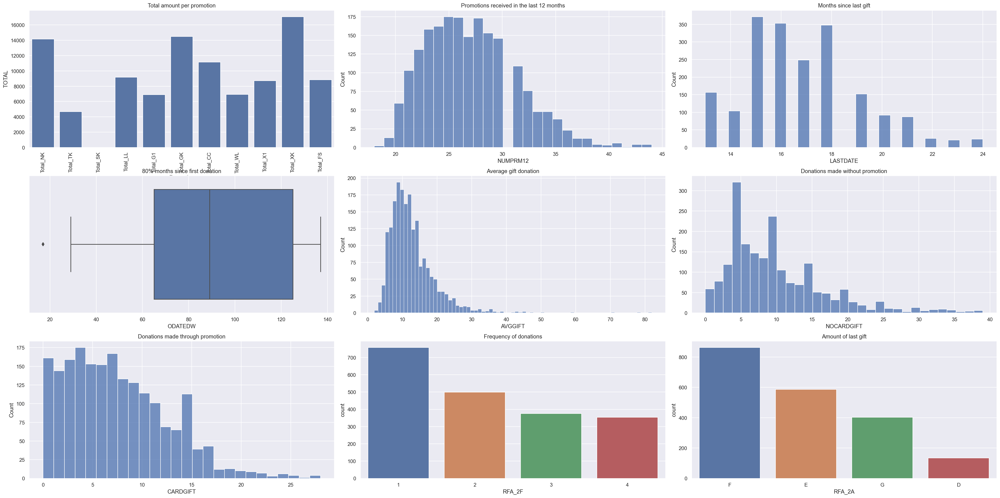

Donor time: 29.0 | 137.0
Average gift value: 6.359113300460001 | 20.565079365
Donations without promotion: 3.0 | 19.0
Donations with promotion: 2.0 | 15.0


In [255]:
gift_description(cluster3)

### Cluster 4

In [256]:
# getting indexes of cluster 4
cluster4_indexes = data_merged[data_merged['merged_labels']==3].drop(columns='merged_labels').index

# selecting observations of the original data in cluster 4
cluster4 = data_not_standard.iloc[cluster4_indexes]

C:\Users\joaof\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


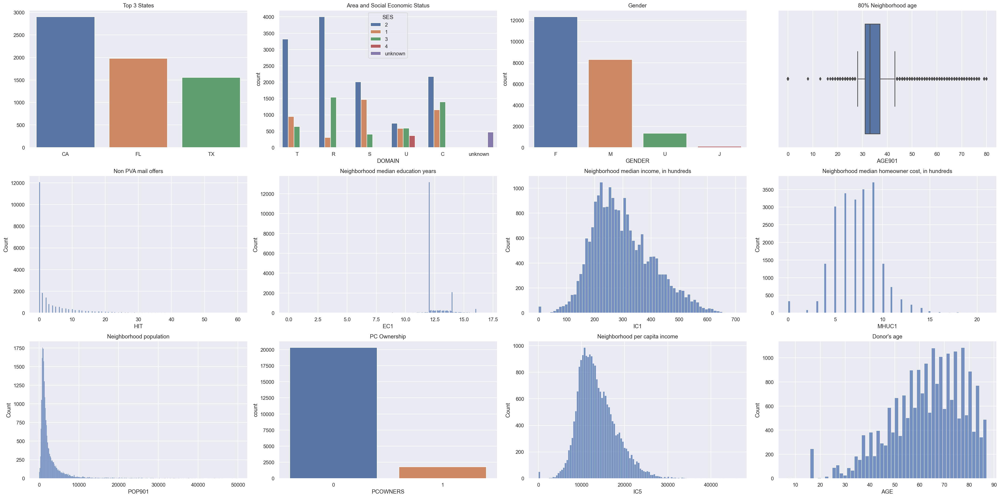

Neighborhood age: 28.0 | 43.0
Neighborhood years of education: 12.0 | 14.0
Neighborhood median income: 176.0 | 451.0
Neighborhood population: 692.0 | 5961.5
Neighborhood per capita income: 8806.0 | 19618.0
Donor age: 43.0 | 81.0


In [257]:
demographic_description(cluster4)

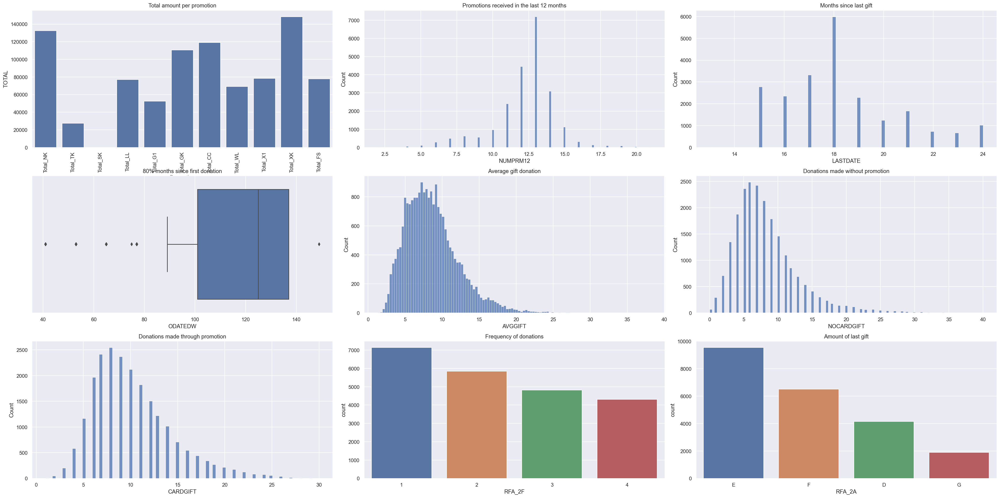

Donor time: 89.0 | 137.0
Average gift value: 4.5454545455 | 13.314144737
Donations without promotion: 3.0 | 14.0
Donations with promotion: 6.0 | 16.0


In [258]:
gift_description(cluster4)

### Cluster 5

In [259]:
# getting indexes of cluster 5
cluster5_indexes = data_merged[data_merged['merged_labels']==4].drop(columns='merged_labels').index

# selecting observations of the original data in cluster 5
cluster5 = data_not_standard.iloc[cluster5_indexes]

C:\Users\joaof\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


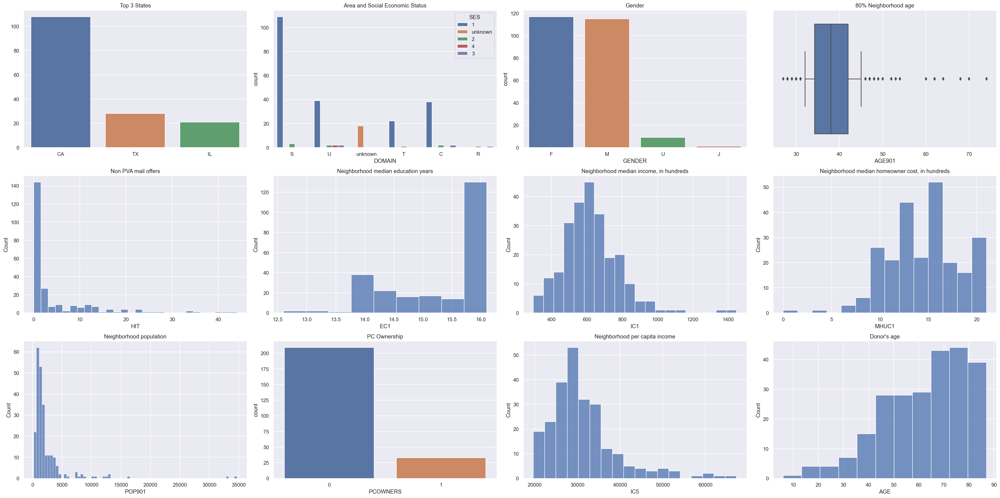

Neighborhood age: 32.0 | 45.900000000000006
Neighborhood years of education: 14.0 | 16.0
Neighborhood median income: 452.1 | 811.0
Neighborhood population: 655.2 | 4132.600000000001
Neighborhood per capita income: 23549.0 | 40267.7
Donor age: 39.0 | 83.0


In [260]:
demographic_description(cluster5)

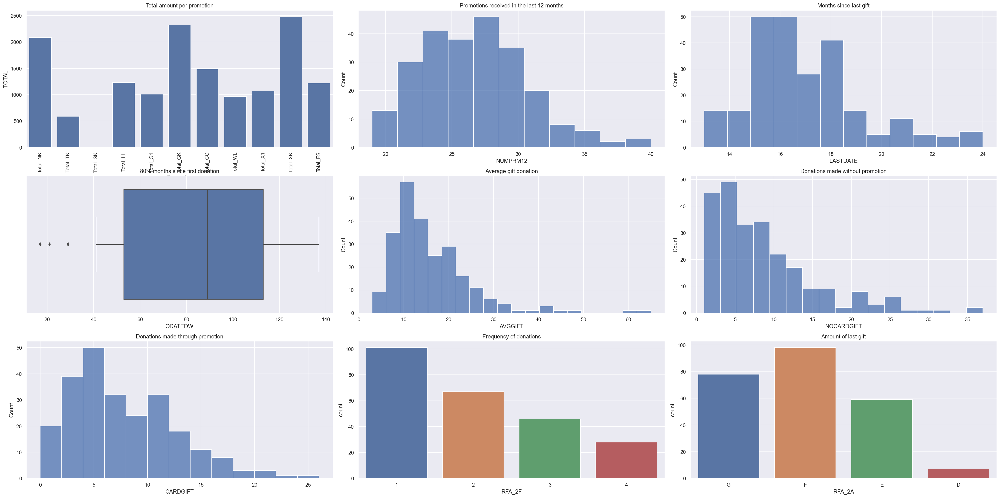

Donor time: 41.0 | 137.0
Average gift value: 7.95909090905 | 25.5433395875
Donations without promotion: 2.0 | 17.0
Donations with promotion: 2.0 | 14.0


In [261]:
gift_description(cluster5)